FIP200 LD and inclusion quantification  
- Exclude cells with faint inclusions that don’t segment.  
- %SA overlap between LDs and synuclein inclusions.  
- number of inclusions  
- surface area of inclusions  
- SA and number of LDs in inclusions and outside inclusions  
- analyze LDs only in green cells (Cellpose)  
- We imaged only cells that contain inclusions.  

Import Libraries

In [13]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.filters import gaussian, threshold_otsu, threshold_multiotsu
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects, binary_dilation, disk
import czifile
import skimage.io as io
from skimage import exposure
from cellpose import models
model = models.Cellpose(model_type='cyto')
model = models.Cellpose(model_type='nuclei')

c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\cellpose\resnet_torch.py:275: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(filename, 

Define Sub Functions

In [14]:
def show_image(image):
    io.imshow(image, cmap='gray')
    plt.show()

def preprocess_green_channel(green_channel):
    """Preprocess the green channel for cell segmentation and inclusion quantification."""
    confocal_img = gaussian(green_channel, sigma=2)
    confocal_img = exposure.adjust_sigmoid(green_channel, cutoff=0.25)
    confocal_img = (confocal_img - confocal_img.min()) / (confocal_img.max() - confocal_img.min())
    
    return confocal_img

def preprocess_dapi_channel(dapi_channel):
    """Preprocess the DAPI channel for nuclei quantification."""
    blurred_dapi = gaussian(dapi_channel, sigma=2)
    threshold_value = threshold_otsu(blurred_dapi)
    binary_image = blurred_dapi > threshold_value
    # show_image(binary_image)
    cleaned_image = remove_small_objects(binary_image, min_size=400)
    merged_image = binary_dilation(cleaned_image, footprint=disk(5))
    labeled_image = label(merged_image)
    return labeled_image

def count_nuclei(labeled_image):
    """Count the number of nuclei in the labeled image."""
    return len(np.unique(labeled_image)) - 1



In [15]:
def analyze_image(image_path, basename):
    """
    Analyze an image by its individual cells
    Args:
        image_path: Path to the .czi image file.
        basename: Base name for the file, used in the output DataFrame.

    Returns:
        A DataFrame containing details about each image 
        A second DataFrame containing details about each detected cell
    """
    
    # Load the image and squeeze dimensions
    image = czifile.imread(image_path)
    image_squeezed = np.squeeze(image)

    # Separate the channels
    red_channel = image_squeezed[0, :, :]
    green_channel = image_squeezed[1, :, :]

    threshold_red = threshold_otsu(gaussian(red_channel)) + 0.1
    red_channel_thresholded = gaussian(red_channel) > threshold_red

    # TODO: use cellpose for red channel

    print("Red Channel")
    show_image(red_channel_thresholded)

    green_channel = preprocess_green_channel(green_channel)
    print("Green Channel")
    show_image(green_channel)


    green_channel_remove_inclusions = np.where(green_channel < 0.6, green_channel, 0) # remove inclusions
    green_channel_remove_inclusions = gaussian(green_channel_remove_inclusions, sigma=10) # blur

    # Detect cells in the green channel
    masks, flows, styles, diams = model.eval(green_channel_remove_inclusions, diameter=300, channels=[0, 0])
    labeled_cells = label(masks)
    
    print("Segmented Cells")
    show_image(labeled_cells)


    # Initialize lists to store results
    num_inclusions = []
    total_inclusion_areas = []


    number_of_ld_in_inclusions_list = []
    area_of_ld_in_inclusions_list = []
    number_of_ld_outside_inclusions_list = []
    area_of_ld_outside_inclusions_list = []

    # Analyze each detected cell
    for i, cell in enumerate(regionprops(labeled_cells)):
        if cell.area < 100:
            continue
        
        
        mask = labeled_cells == cell.label
        
        applied_mask_blurred = gaussian(green_channel, sigma=5) * mask
        applied_mask_eliminate_background = applied_mask_blurred[applied_mask_blurred > 0] # filter out 0
        
        # normalize 
        applied_mask_eliminate_background = (applied_mask_eliminate_background - np.min(applied_mask_eliminate_background)) / ((np.max(applied_mask_eliminate_background) - np.min(applied_mask_eliminate_background)))

        # calculate statistics
        mean_intensity = np.mean(applied_mask_eliminate_background)
        median_intensity = np.median(applied_mask_eliminate_background)
        q1 = np.percentile(applied_mask_eliminate_background, 25)
        q3 = np.percentile(applied_mask_eliminate_background, 75)
        
        hist, bin_edges = np.histogram(applied_mask_eliminate_background, bins='fd')
        
        applied_mask = green_channel * mask
        # 0.4 is an empirical value that seems to work well
        if q3 < 0.5 and len(bin_edges) > 20:
            # the population is skewed to the left, indicating that there are inclusions
            threshold = max(threshold_otsu(applied_mask),0.5) # use otsu thresholding to find the threshold
        elif q3 >= 0.9:
            # definitely no inclusions
            threshold = 1
        else:
            # probably no inclusions, but not sure, so we set a very high threshold in case there are inclusions
            threshold = 0.95
        
        inclusions = applied_mask > threshold # apply the threshold
        # remove small objects
        inclusions = remove_small_objects(inclusions, min_size=10)
        dilated_inclusions = binary_dilation(inclusions, disk(5)) # dilate the inclusions
        inclusions_labeled = label(inclusions)

        dilated_inclusions_labeled = label(dilated_inclusions)
        num_inclusions.append(len(np.unique(dilated_inclusions_labeled)) - 1)
        
                

        inclusion_areas = [inclusion.area for inclusion in regionprops(inclusions_labeled) if inclusion.area > 10] # filter out small inclusions
        inclusion_areas = np.array(inclusion_areas)
        total_inclusion_area = np.sum(inclusion_areas)
        
        # if len(inclusion_areas) > 0:
        print("Threshold: ", threshold)
        print("Bin count", len(bin_edges))

        plt.hist(applied_mask_eliminate_background, bins='fd')  
        plt.axvline(mean_intensity, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_intensity:.2f}')
        plt.axvline(median_intensity, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median_intensity:.2f}')
        plt.axvline(q1, color='blue', linestyle='dashed', linewidth=2, label=f'Q1: {q1:.2f}')
        plt.axvline(q3, color='purple', linestyle='dashed', linewidth=2, label=f'Q3: {q3:.2f}')
        plt.legend()
        plt.title("Intensity histogram")
        plt.show()

        print("Inclusion Areas: ", inclusion_areas)
        show_image(inclusions)
        

        ld_cell = red_channel_thresholded*mask # find the lipid droplets in the cell
        ld_cell_labeled = label(ld_cell) # label the lipid droplets in the cell
        number_of_ld_in_inclusions = 0
        area_of_ld_in_inclusions = 0
        number_of_ld_outside_inclusions = 0
        area_of_ld_outside_inclusions = 0
        for ld in regionprops(ld_cell_labeled):
            if ld.area < 10:
                continue
            ld_image = ld_cell_labeled == ld.label
            # show_image(ld_image)
            overlap = inclusions_labeled * ld_image
            if np.sum(overlap) > 0:
                number_of_ld_in_inclusions += 1
                area_of_ld_in_inclusions += ld.area
            else:
                number_of_ld_outside_inclusions += 1
                area_of_ld_outside_inclusions += ld.area
        if len(inclusion_areas) == 0:
            number_of_ld_in_inclusions = 0
            area_of_ld_in_inclusions = 0
        number_of_ld_in_inclusions_list.append(number_of_ld_in_inclusions)
        area_of_ld_in_inclusions_list.append(area_of_ld_in_inclusions)
        number_of_ld_outside_inclusions_list.append(number_of_ld_outside_inclusions)
        area_of_ld_outside_inclusions_list.append(area_of_ld_outside_inclusions)
        # store results
        total_inclusion_areas.append(total_inclusion_area)
        
        # num_inclusions.append(len(inclusion_areas))
    
    # analysis by image
    df1 = pd.DataFrame({
        "File_Name:": [basename],
        "Number_of_Inclusions": [np.sum(num_inclusions)],
        "Area_of_Inclusions": [np.sum(total_inclusion_areas)],
        "Number_of_LD_in_Inclusions": [np.sum(number_of_ld_in_inclusions_list)],
        "Area_of_LD_in_Inclusions": [np.sum(area_of_ld_in_inclusions_list)],
        "Number_of_LD_outside_Inclusions": [np.sum(number_of_ld_outside_inclusions_list)],
        "Area_of_LD_outside_Inclusions": [np.sum(area_of_ld_outside_inclusions_list)],
    })
    
   
    return df1

In [16]:
def analyze_all_images(image_folder, images=None):
    # images is the list of images to analyze, if set to None, analyze all images
    all_data_1 = []
    for well_image in os.listdir(image_folder):
        
        if well_image.lower().endswith(".czi"):  # Filter for CZI files
            
            print(well_image)
            if images is not None and well_image not in images:
                continue

            well_image_path = os.path.join(image_folder, well_image)
            well_image_base_name = os.path.basename(well_image)[:-4]


            
            df1 = analyze_image(well_image_path, well_image_base_name)
            all_data_1.append(df1)
            
            print("-" * 200)

    combined_df_1 = pd.concat(all_data_1, ignore_index=True)
    combined_df_1.to_excel(f"{image_folder[:6]}_analysis_by_image.xlsx", index=False)


Define Main Function

In [17]:
# folders = ['11725_lipidDroplets_FIP200','12425_LipidDroplets_FIP200']
# folders = ['12425_LipidDroplets_FIP200']
folders = ['13125_LipidDroplets_FIP200']

1K_FIP200_noOA_LT_01.czi
Red Channel


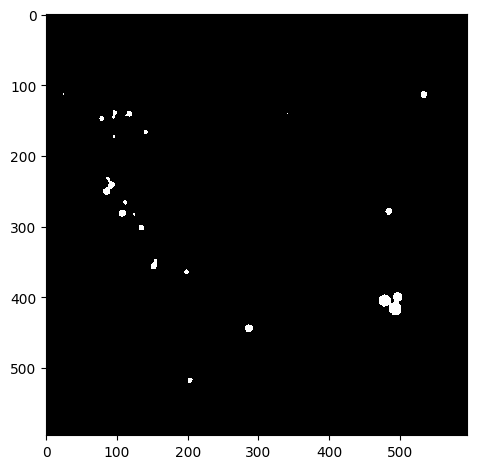

Green Channel


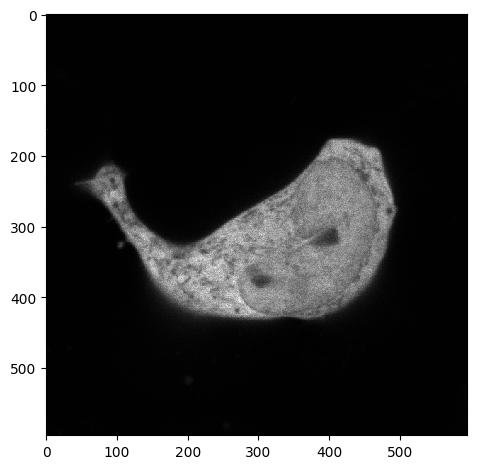

Segmented Cells


c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:158: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


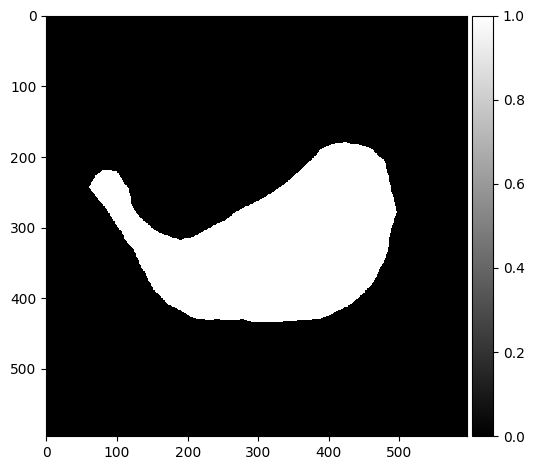

Threshold:  0.95
Bin count 113


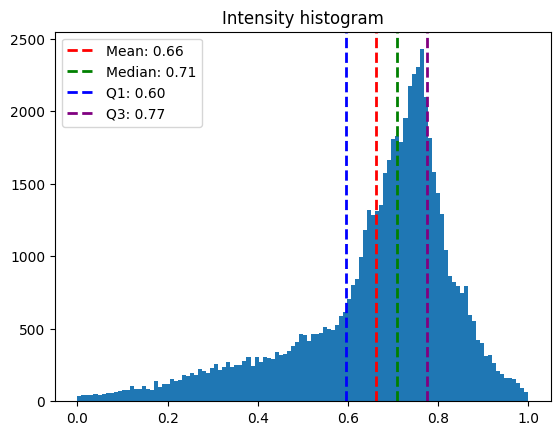

Inclusion Areas:  []


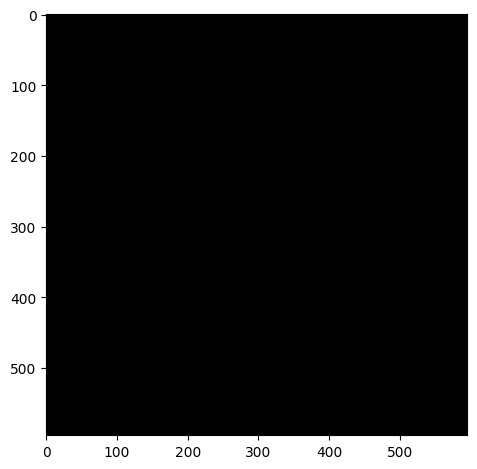

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_noOA_LT_02.czi
Red Channel


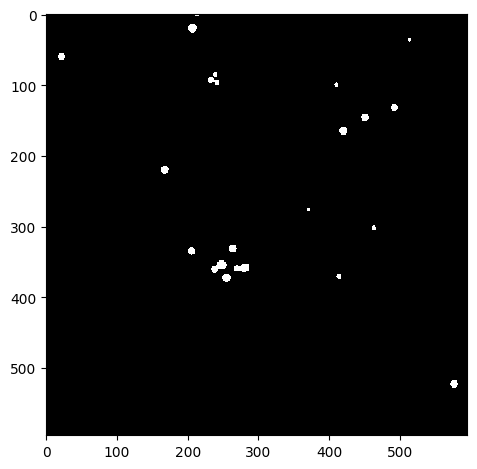

Green Channel


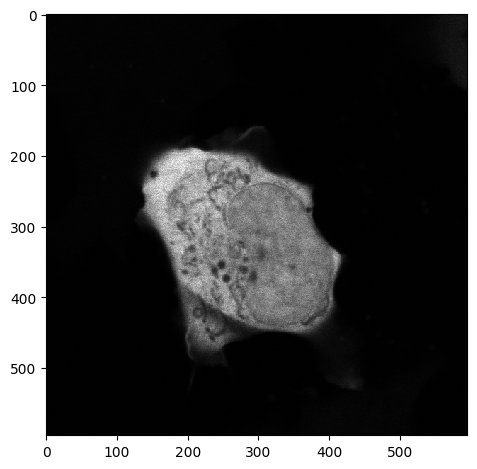

Segmented Cells


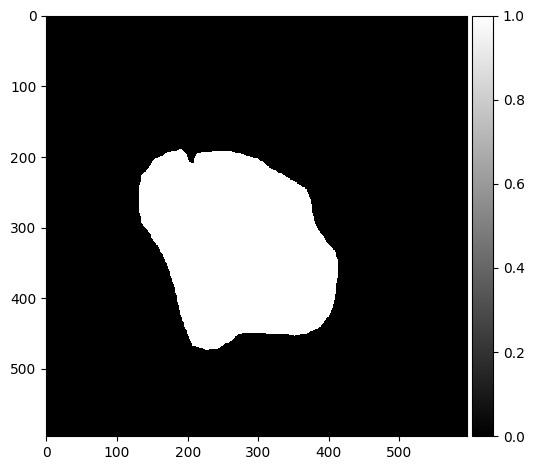

Threshold:  0.95
Bin count 124


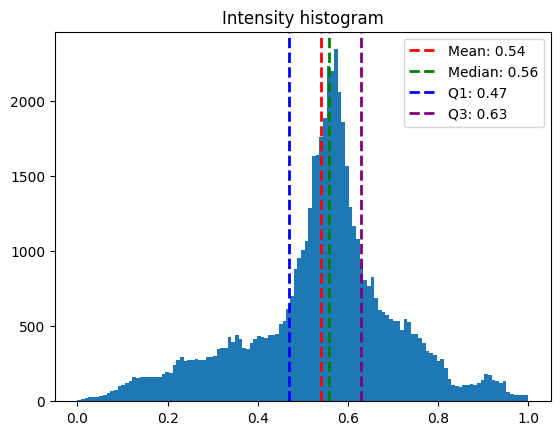

Inclusion Areas:  []


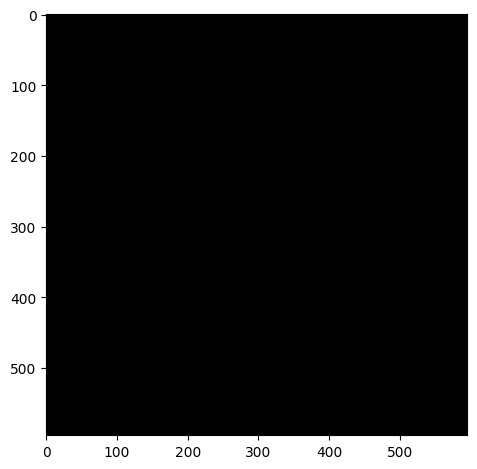

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_noOA_LT_03.czi
Red Channel


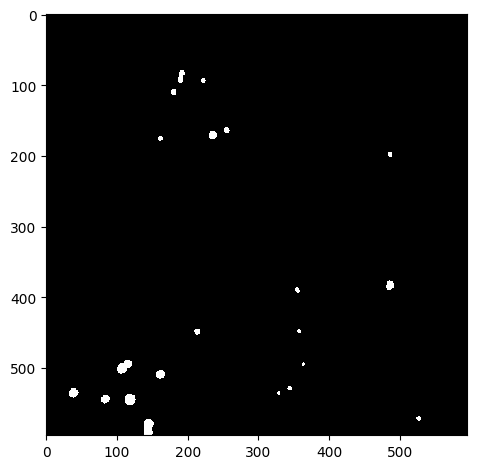

Green Channel


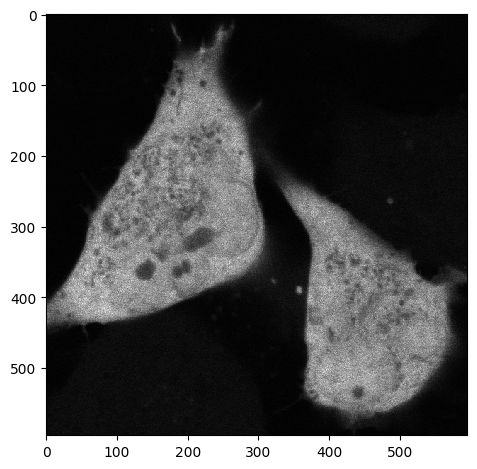

Segmented Cells


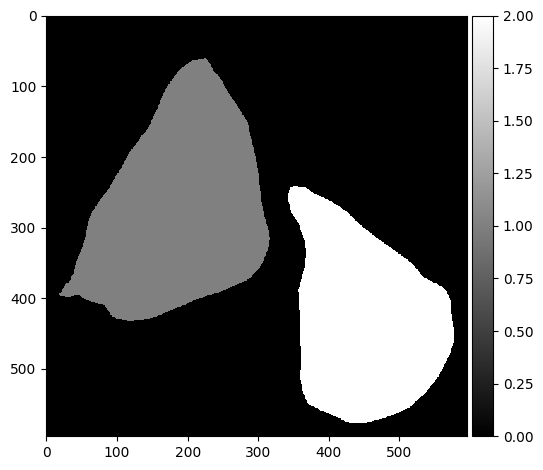

Threshold:  0.95
Bin count 121


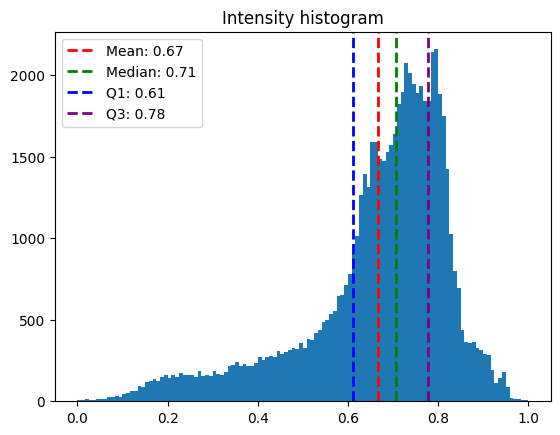

Inclusion Areas:  []


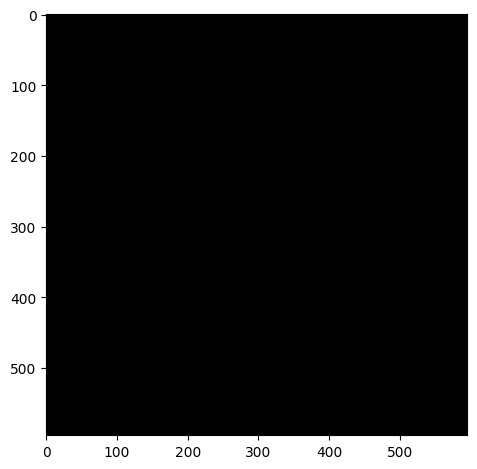

Threshold:  0.95
Bin count 93


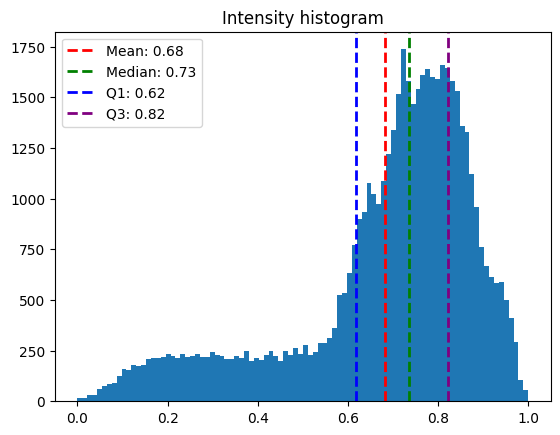

Inclusion Areas:  []


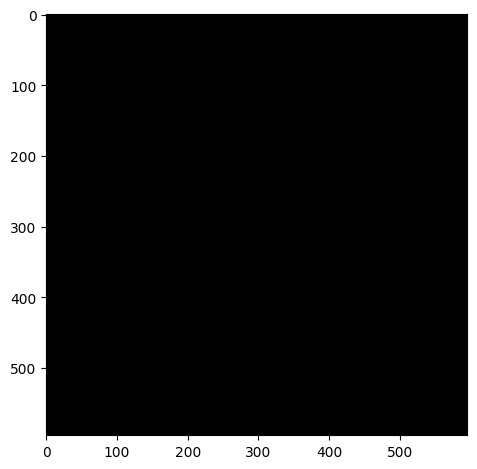

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_noOA_LT_04.czi
Red Channel


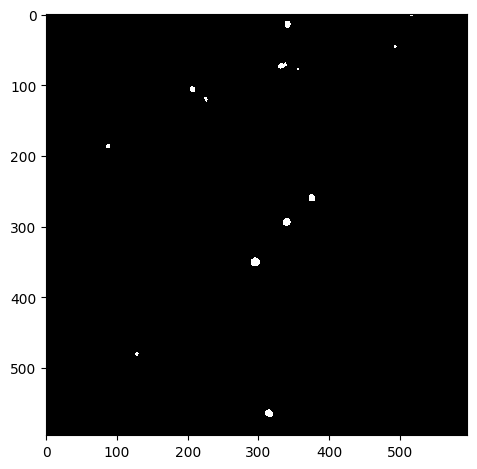

Green Channel


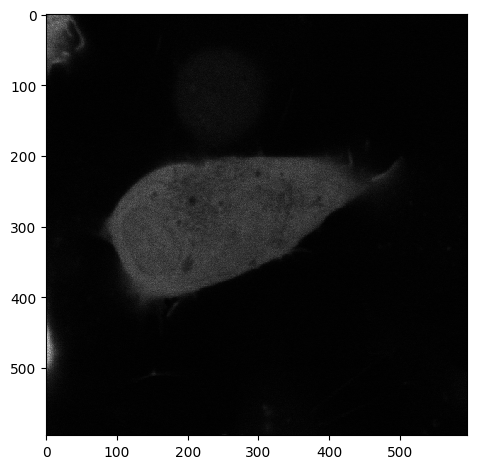

Segmented Cells


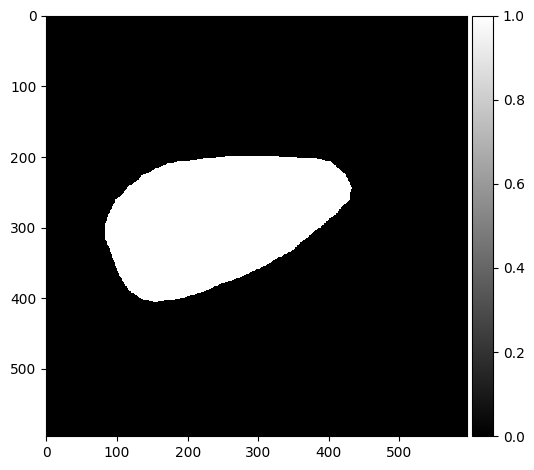

Threshold:  0.95
Bin count 107


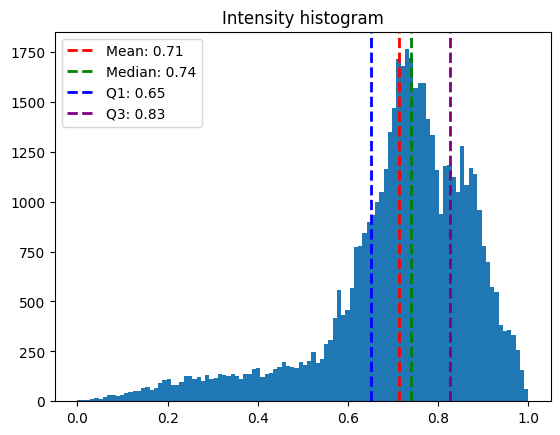

Inclusion Areas:  []


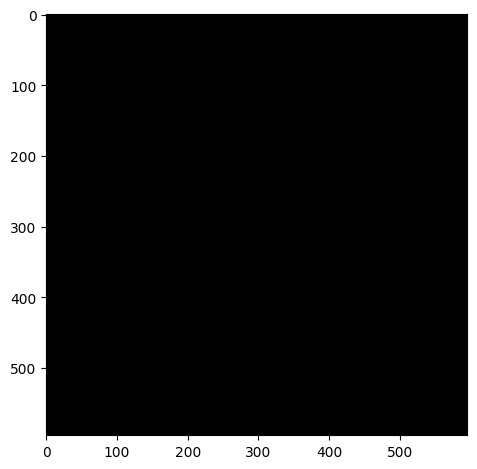

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_noOA_LT_05.czi
Red Channel


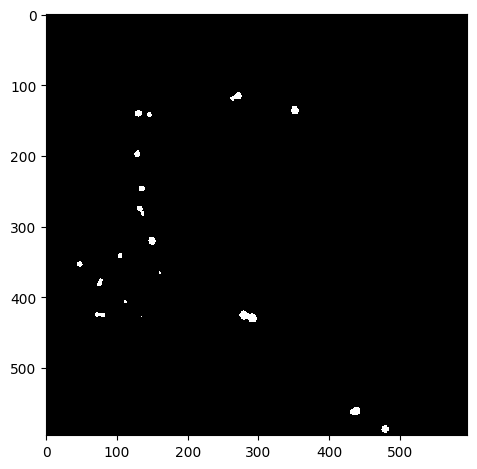

Green Channel


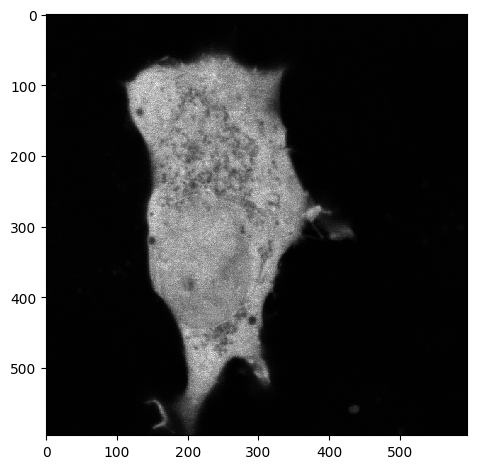

Segmented Cells


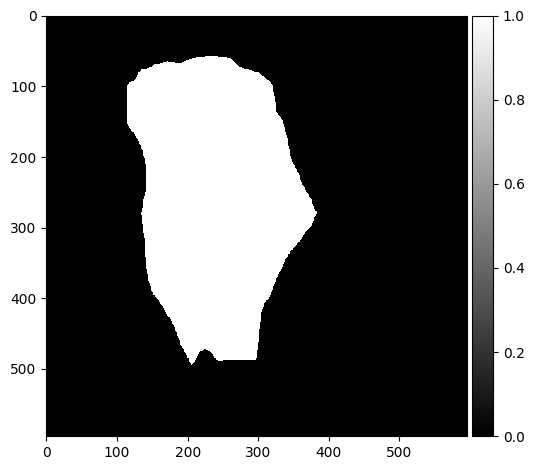

Threshold:  0.95
Bin count 142


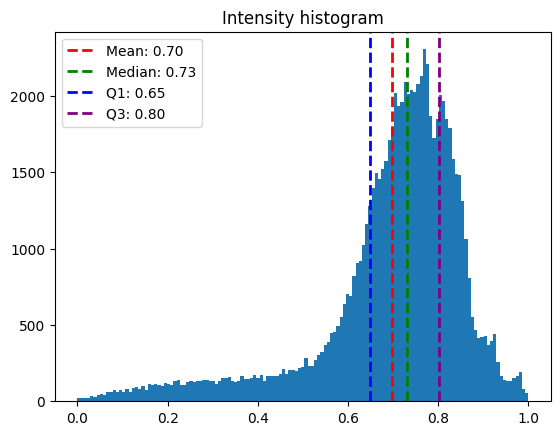

Inclusion Areas:  []


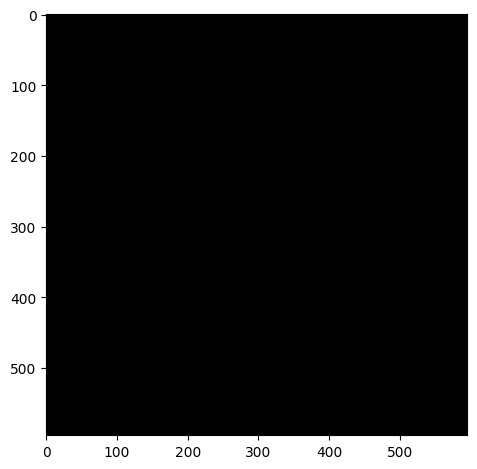

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_noOA_LT_06.czi
Red Channel


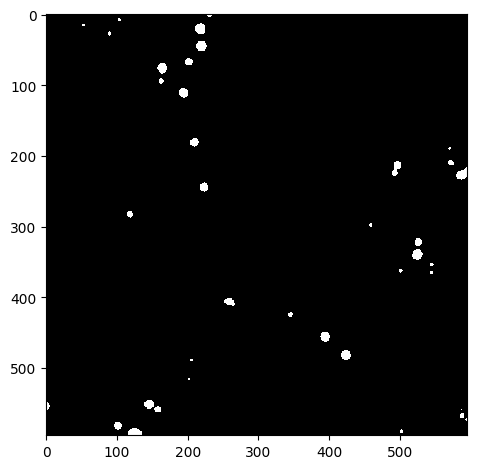

Green Channel


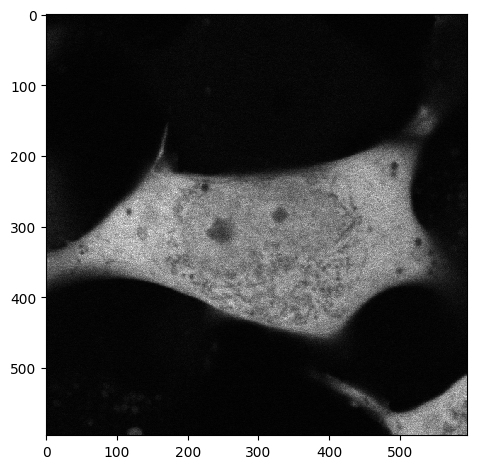

Segmented Cells


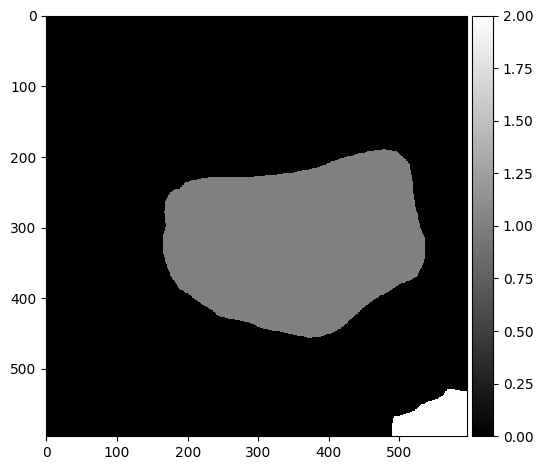

Threshold:  0.95
Bin count 172


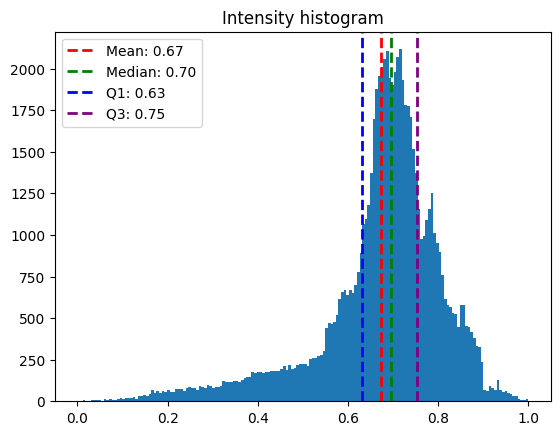

Inclusion Areas:  []


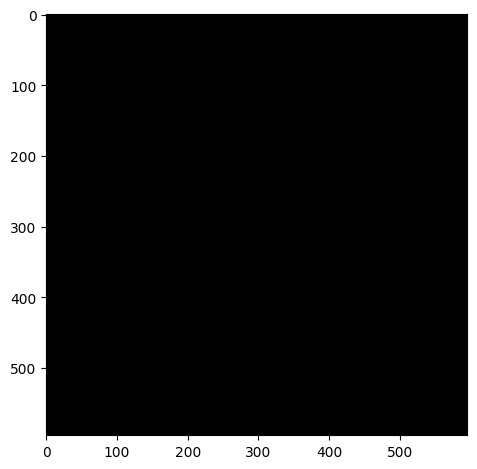

Threshold:  0.95
Bin count 37


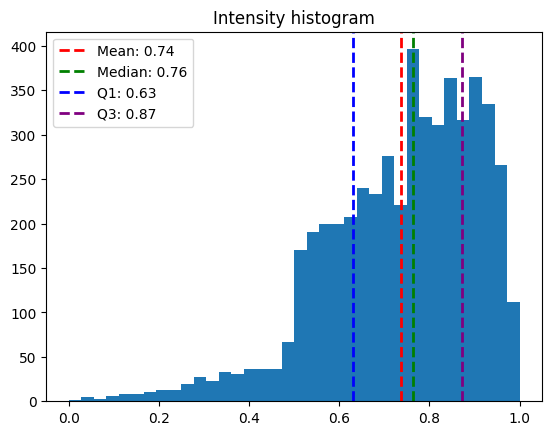

Inclusion Areas:  []


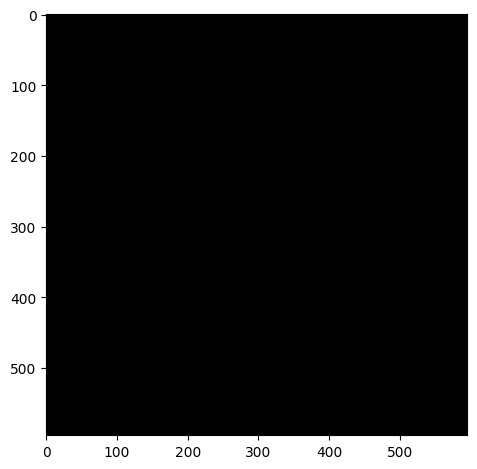

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_OA_LT_01.czi
Red Channel


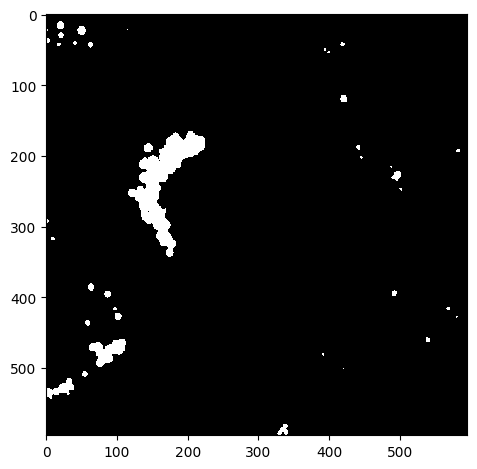

Green Channel


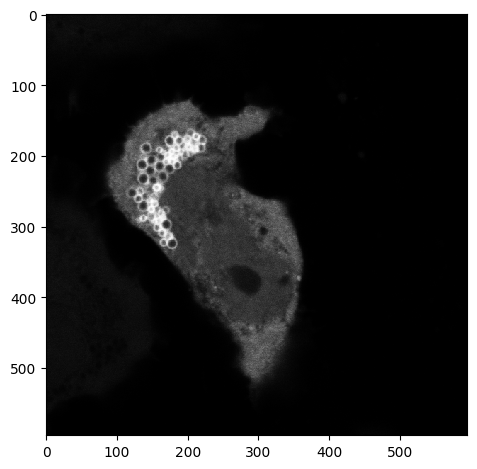

Segmented Cells


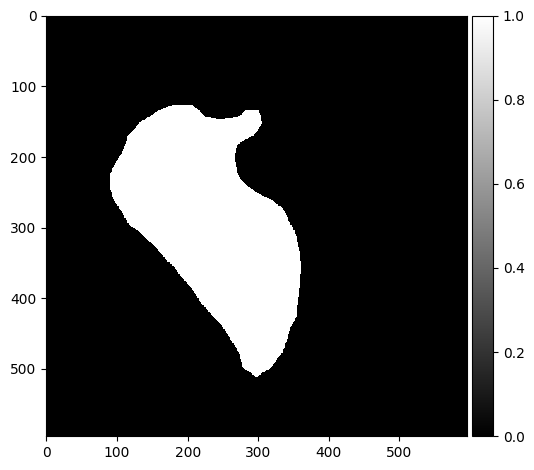

Threshold:  0.5
Bin count 136


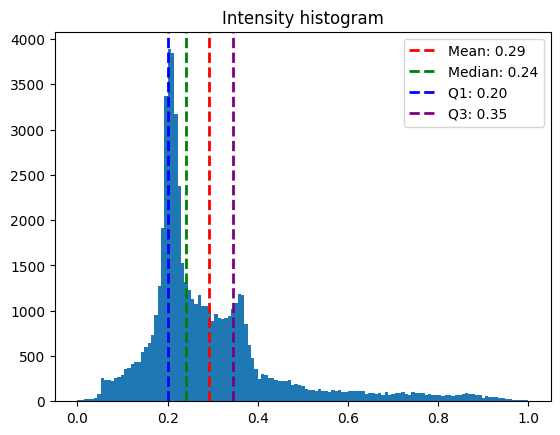

Inclusion Areas:  [4902.]


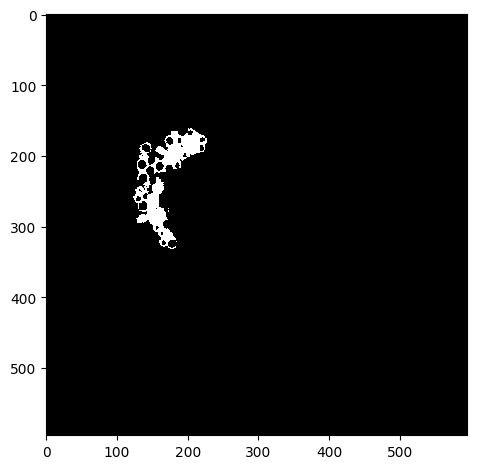

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_OA_LT_02.czi
Red Channel


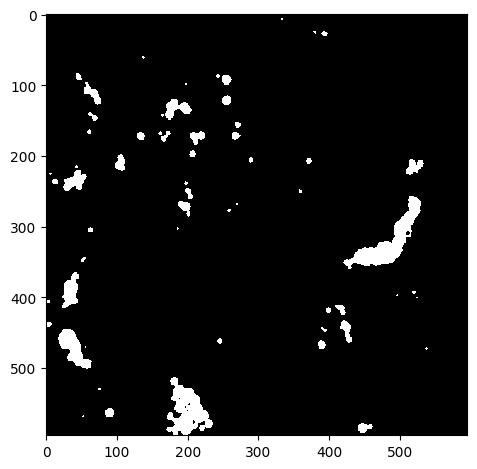

Green Channel


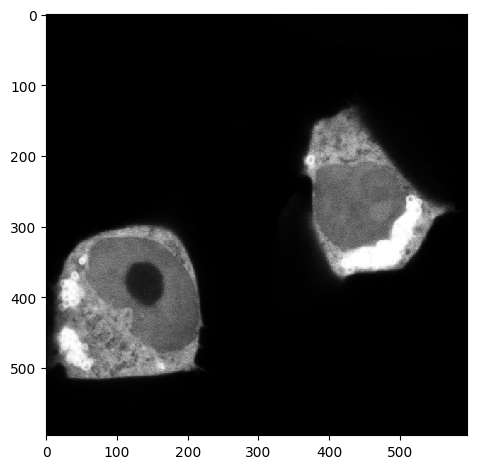

Segmented Cells


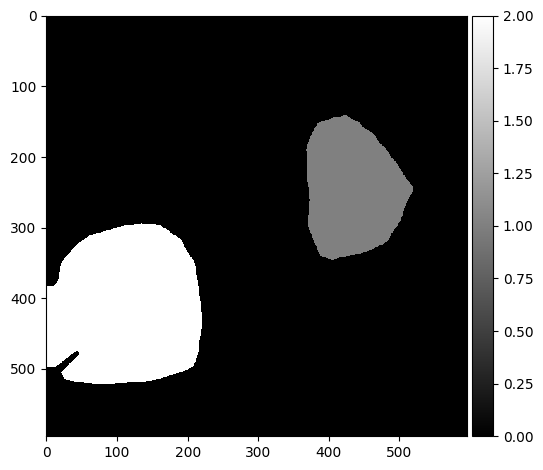

Threshold:  0.5
Bin count 116


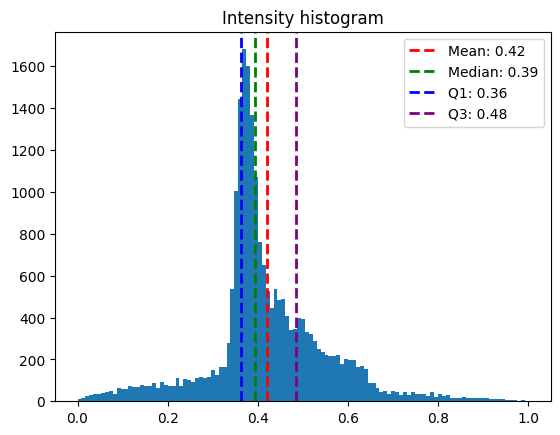

Inclusion Areas:  [  37. 3604.   23.   45. 1250.   13.]


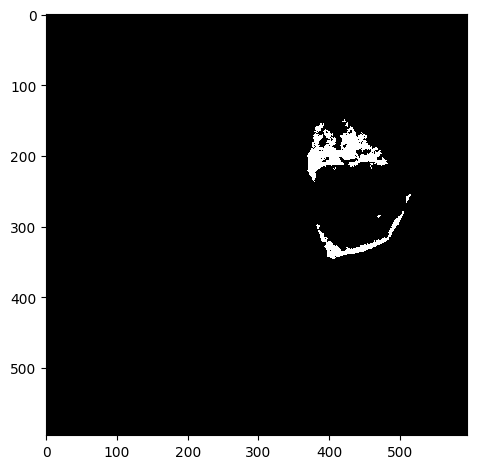

Threshold:  0.95
Bin count 94


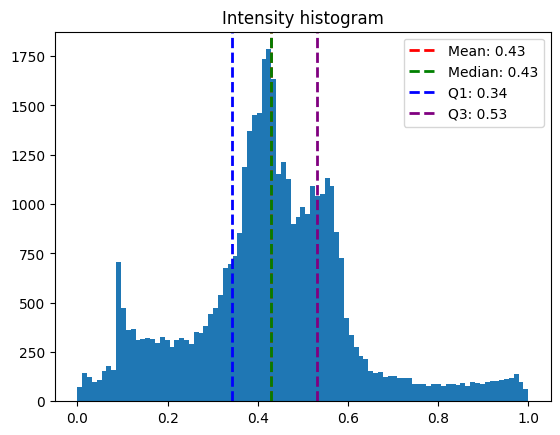

Inclusion Areas:  [ 16. 317. 549.  30.]


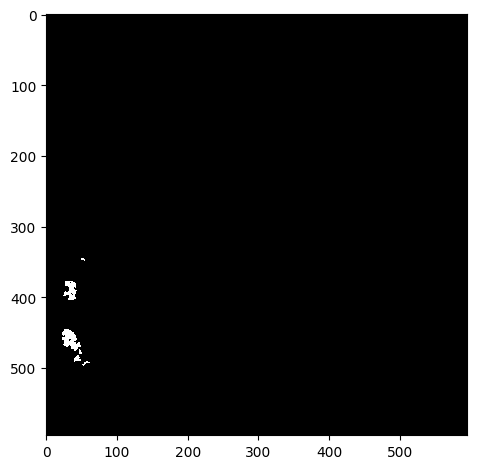

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_OA_LT_03.czi
Red Channel


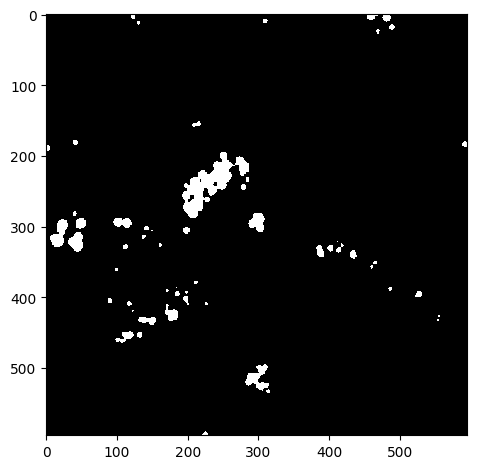

Green Channel


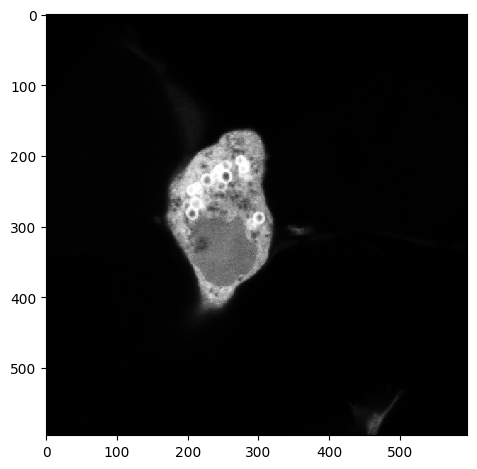

Segmented Cells


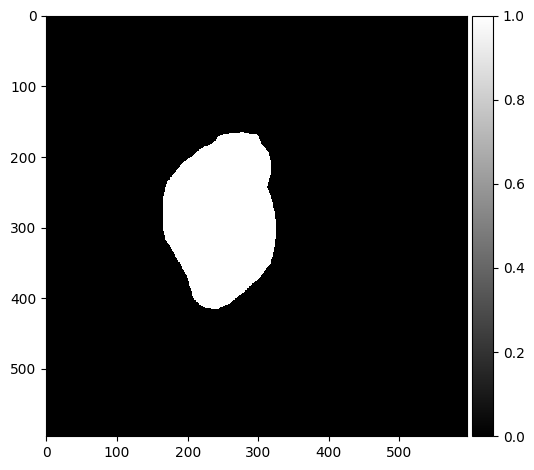

Threshold:  0.95
Bin count 73


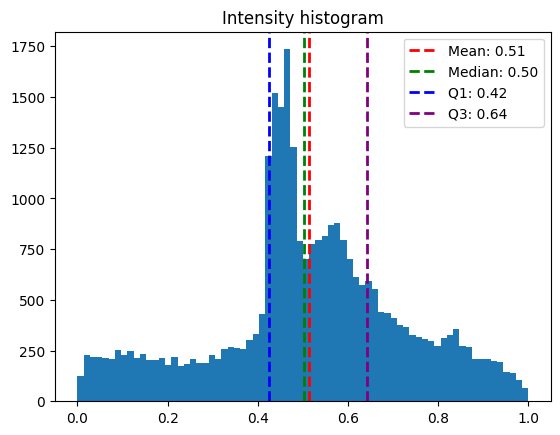

Inclusion Areas:  [233.  17. 339.  35. 258. 114.  45.  56.]


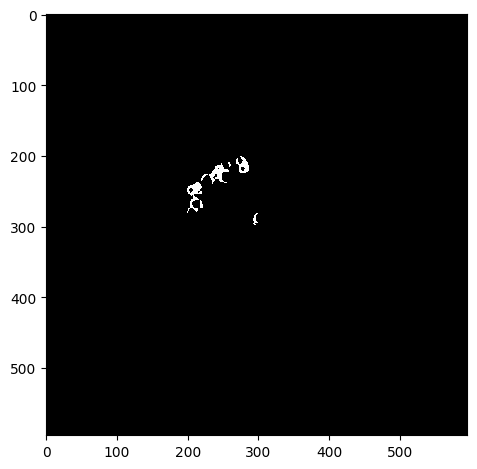

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_OA_LT_04.czi
Red Channel


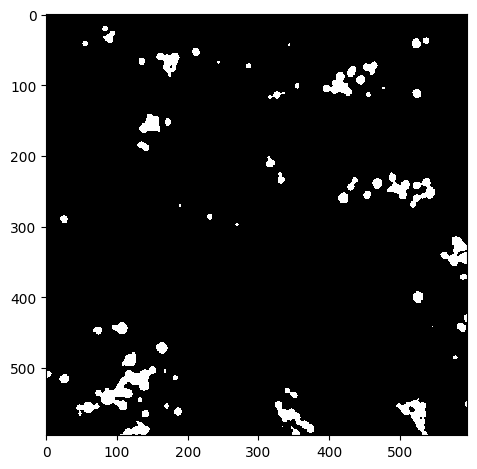

Green Channel


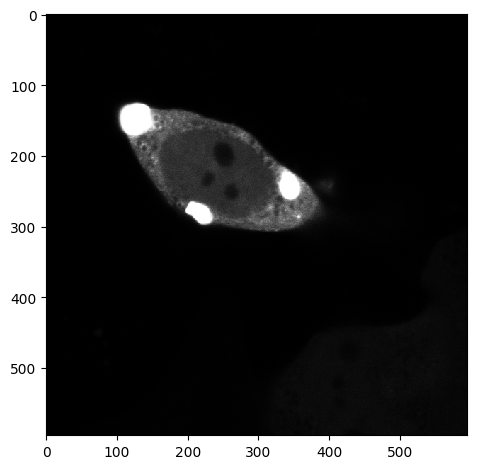

Segmented Cells


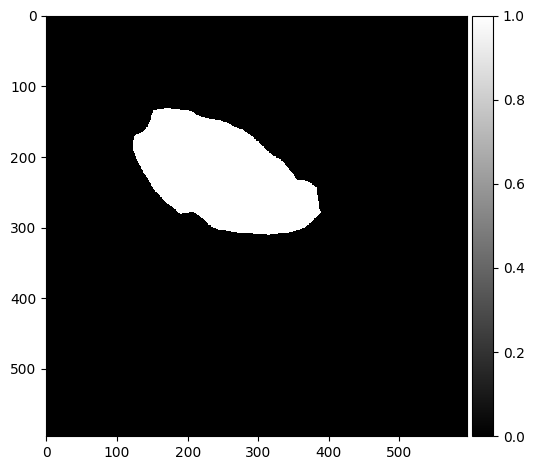

Threshold:  0.5
Bin count 108


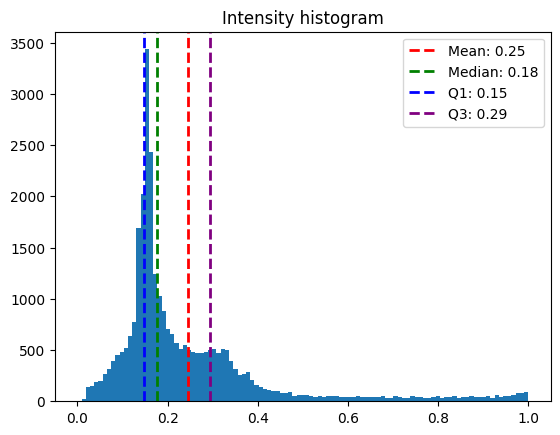

Inclusion Areas:  [ 468.   13. 1291.  605.   37.   80.]


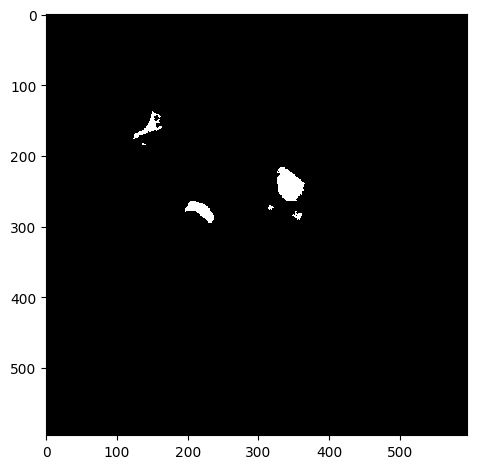

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_OA_LT_05.czi
Red Channel


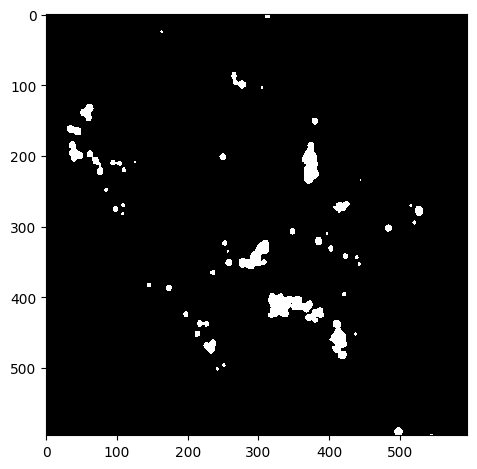

Green Channel


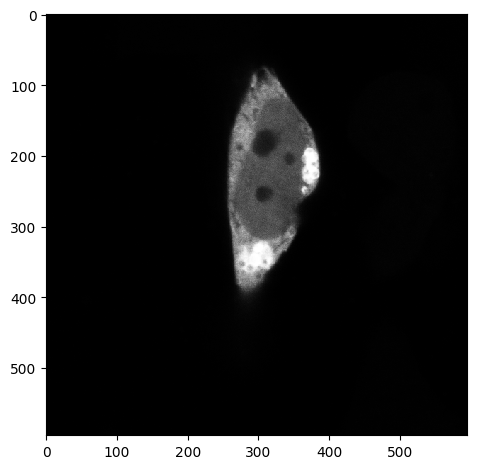

Segmented Cells


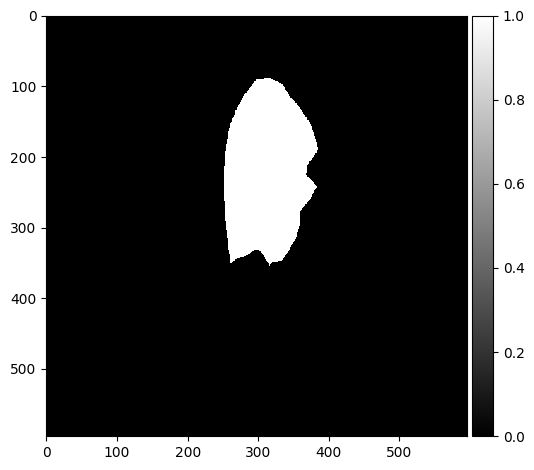

Threshold:  0.5
Bin count 101


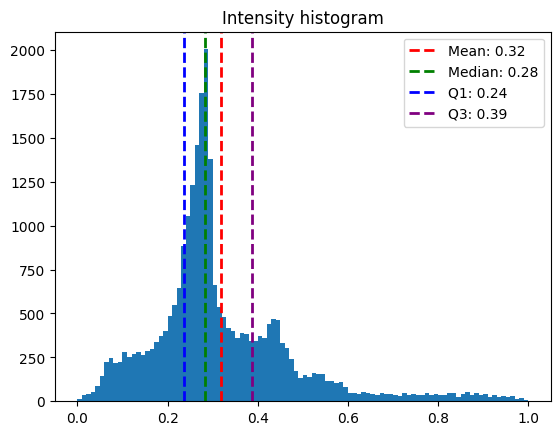

Inclusion Areas:  [  66.   19.   44.   45.   38.   35.   11.  167.  729.   33.  808.   33.
   84.   88. 1721.   71.]


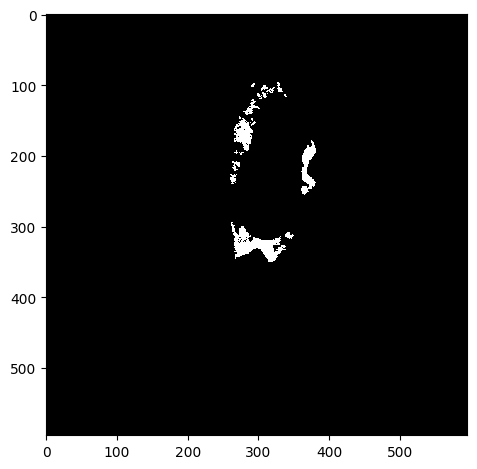

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_OA_LT_06.czi
Red Channel


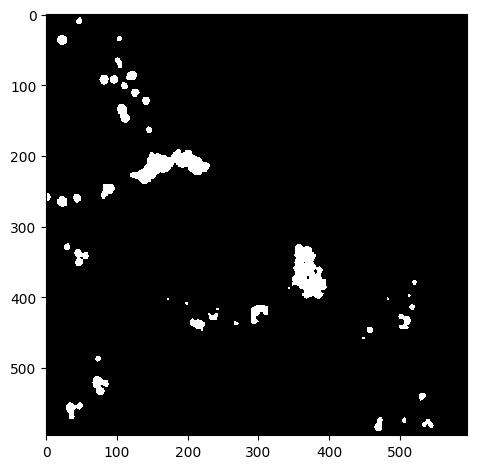

Green Channel


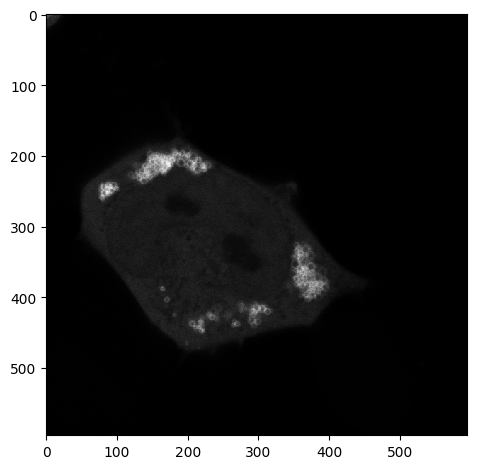

Segmented Cells


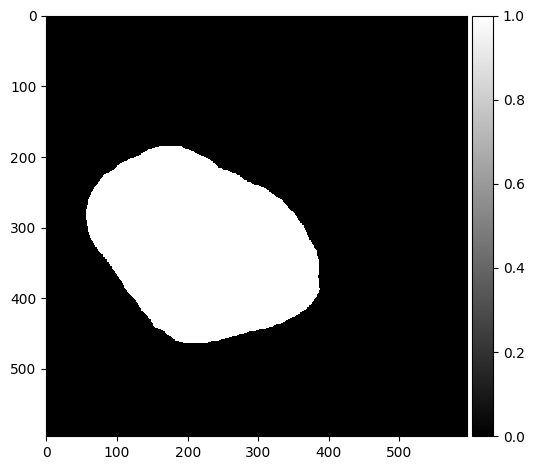

Threshold:  0.5
Bin count 540


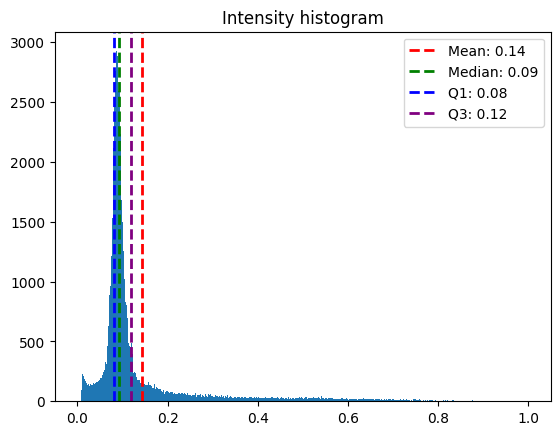

Inclusion Areas:  [1008.   40.  112.   58.  266.   65.  422.   17.   65.   13.   24.]


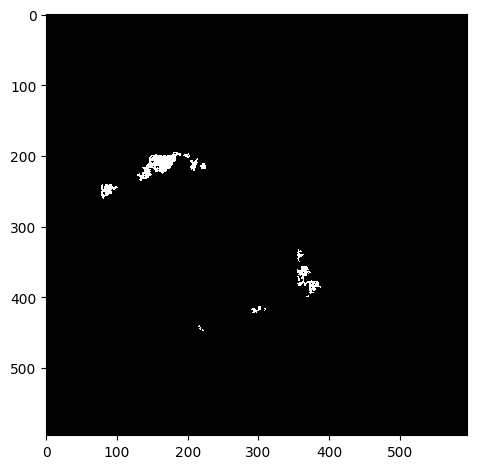

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_01.czi
Red Channel


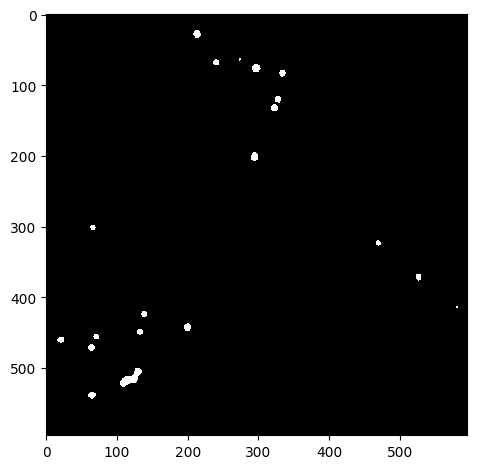

Green Channel


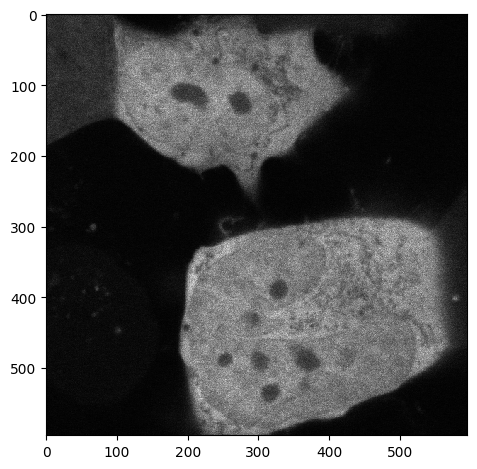

Segmented Cells


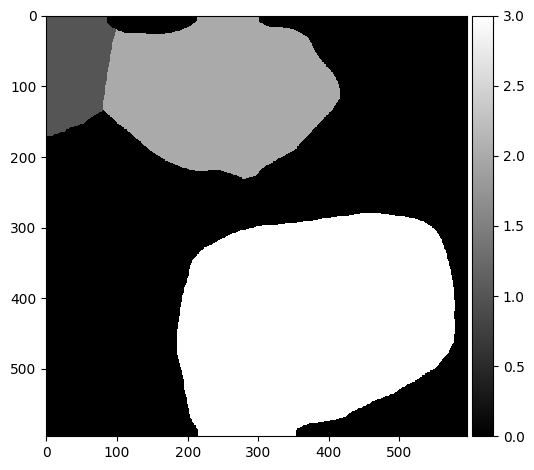

Threshold:  0.5
Bin count 127


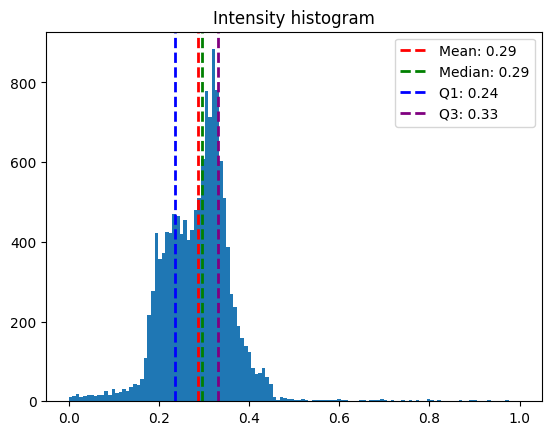

Inclusion Areas:  []


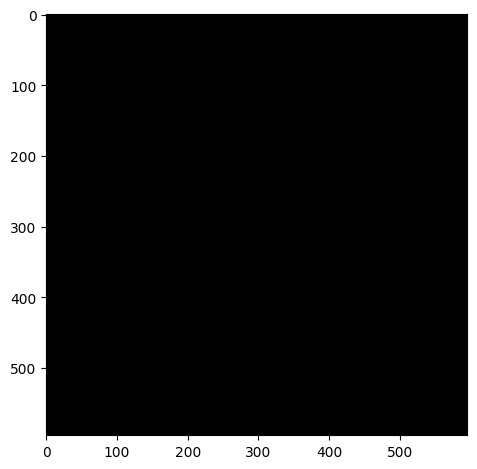

Threshold:  0.95
Bin count 80


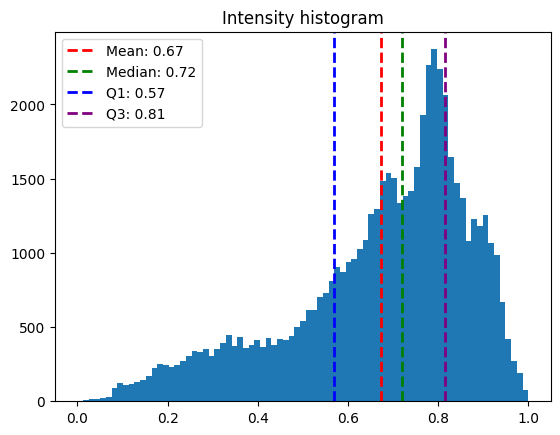

Inclusion Areas:  []


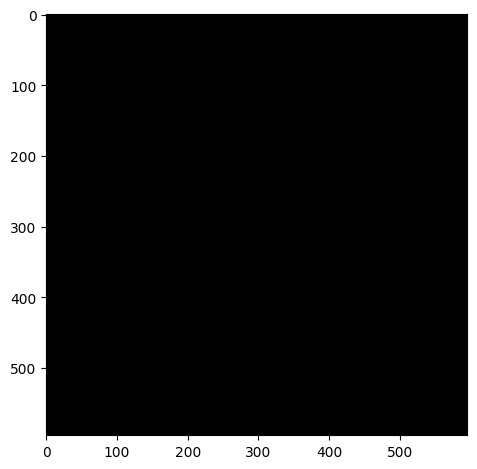

Threshold:  0.95
Bin count 187


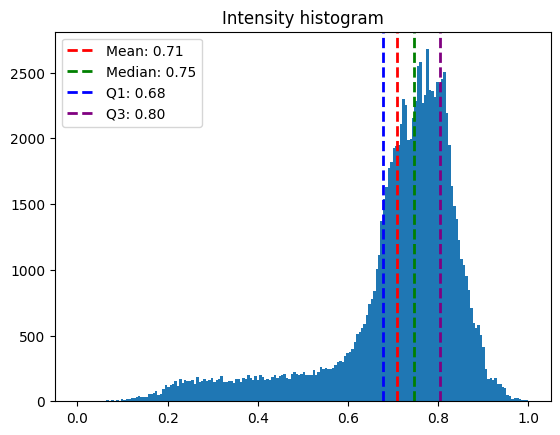

Inclusion Areas:  []


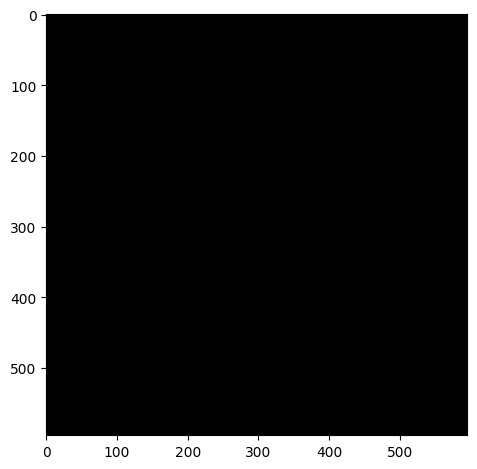

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_02.czi
Red Channel


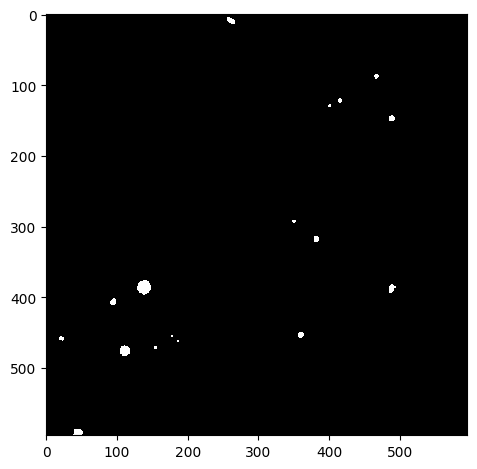

Green Channel


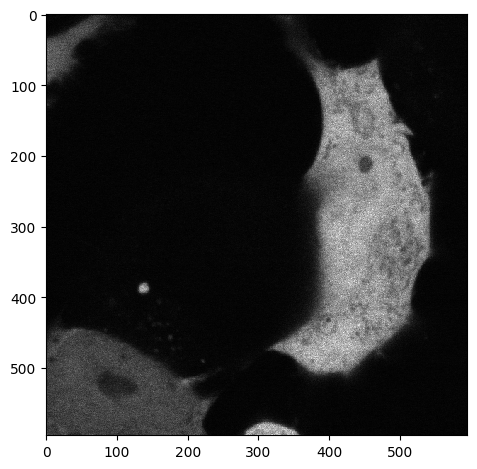

Segmented Cells


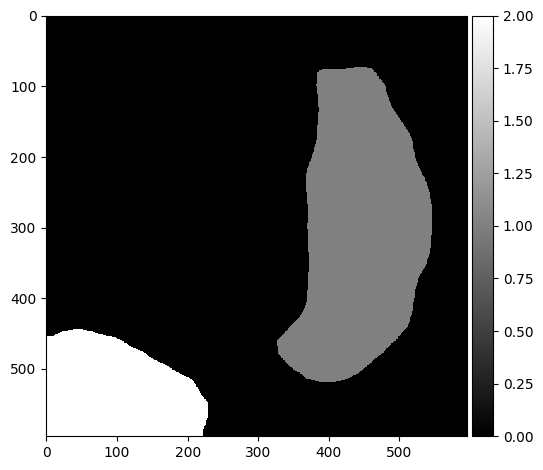

Threshold:  0.95
Bin count 86


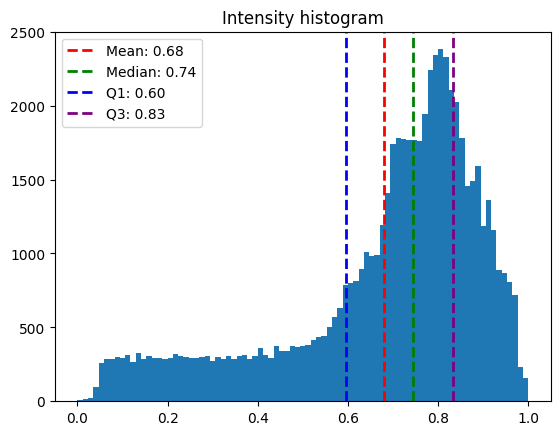

Inclusion Areas:  []


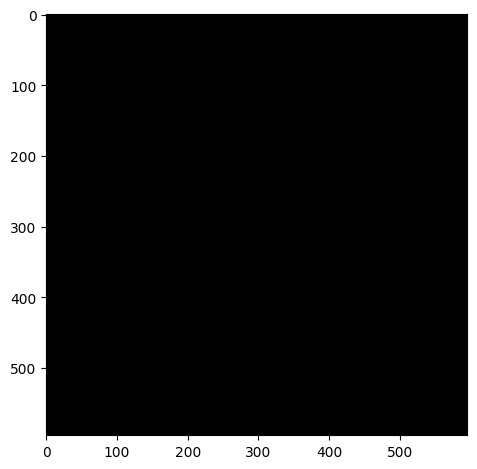

Threshold:  0.95
Bin count 117


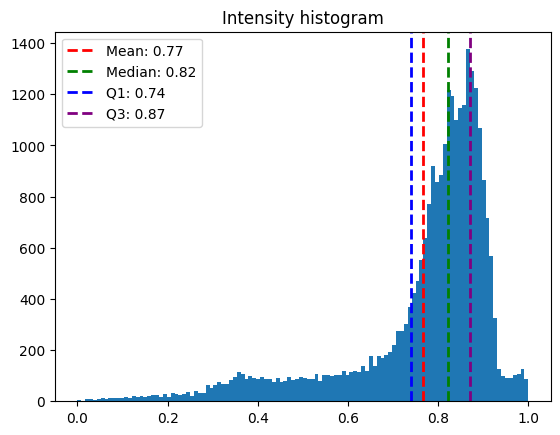

Inclusion Areas:  []


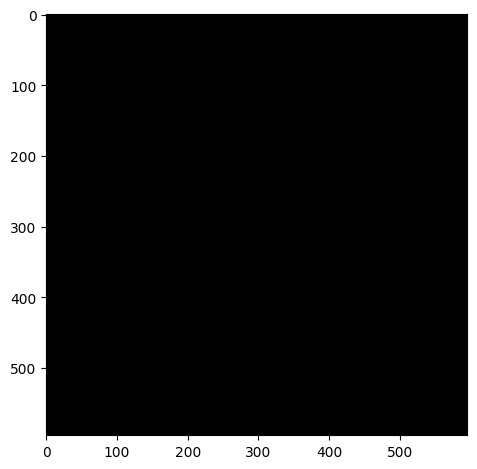

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_03.czi
Red Channel


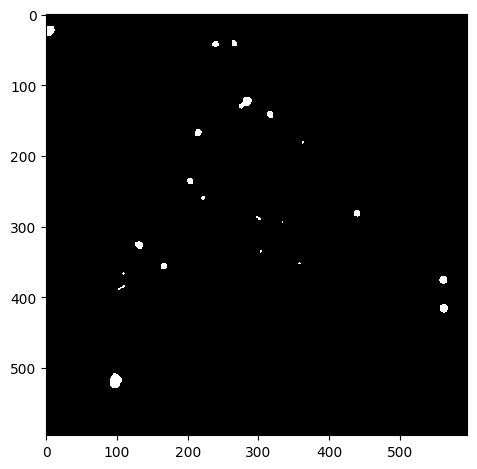

Green Channel


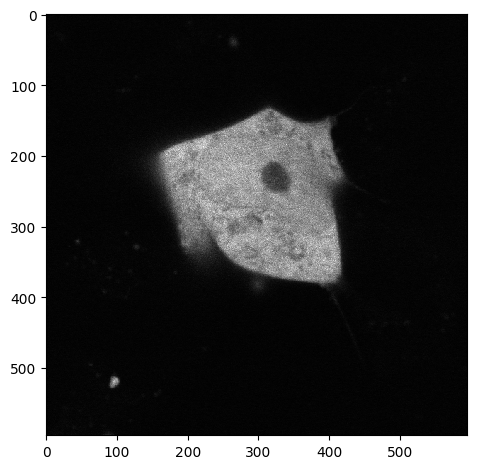

Segmented Cells


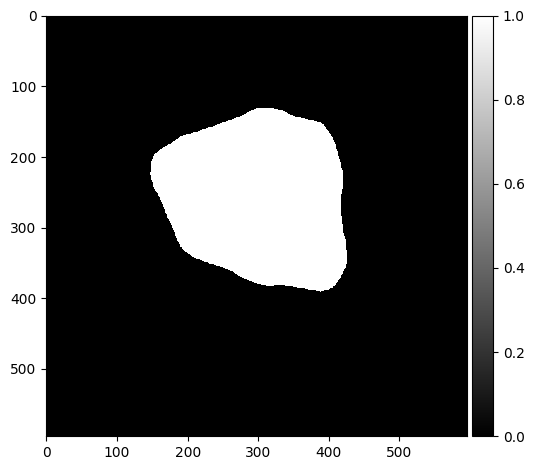

Threshold:  0.95
Bin count 73


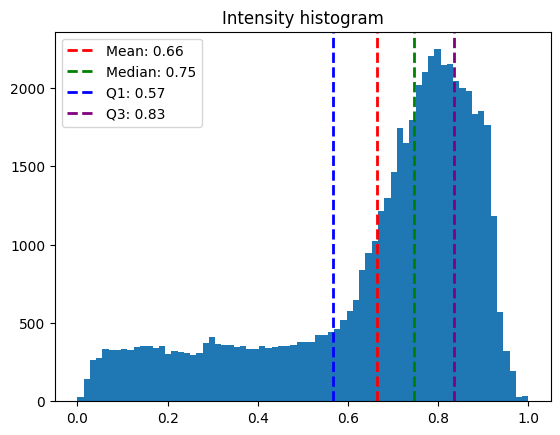

Inclusion Areas:  []


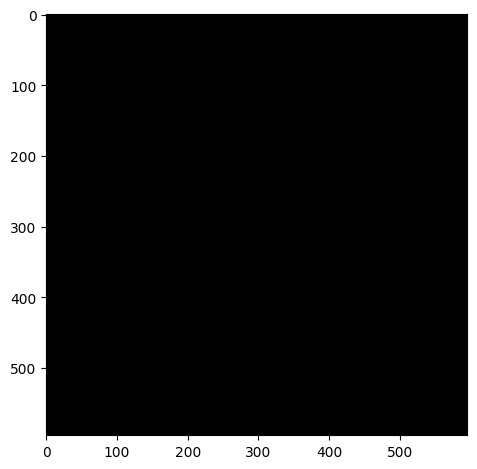

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_04.czi
Red Channel


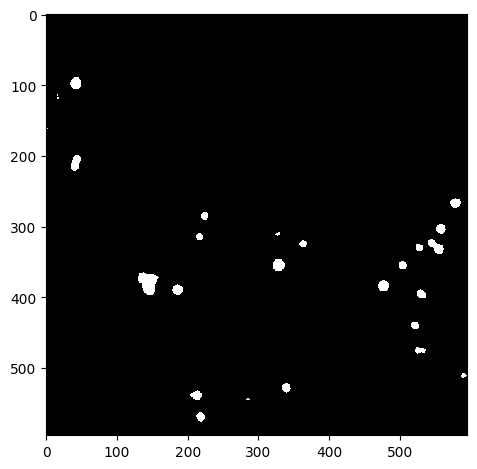

Green Channel


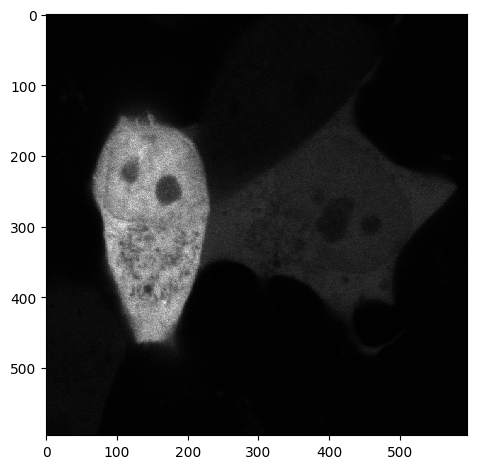

Segmented Cells


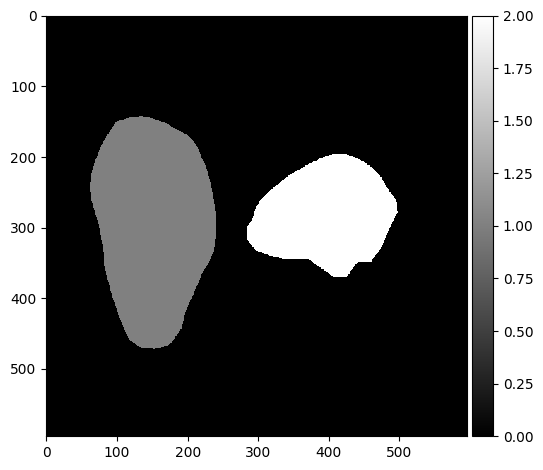

Threshold:  0.95
Bin count 73


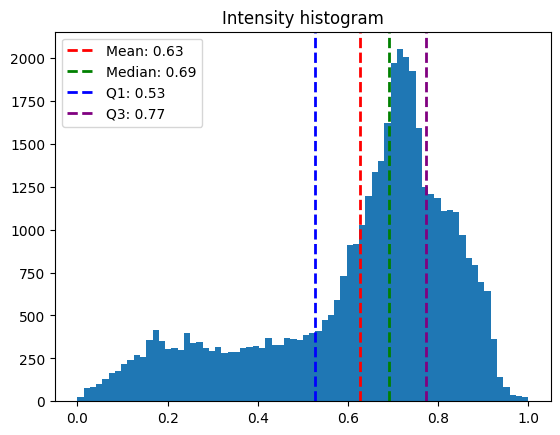

Inclusion Areas:  []


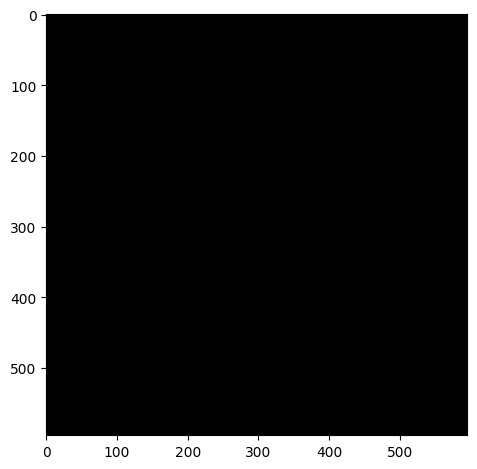

Threshold:  0.95
Bin count 112


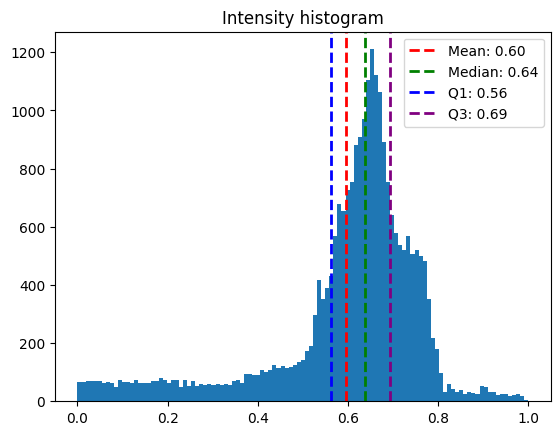

Inclusion Areas:  []


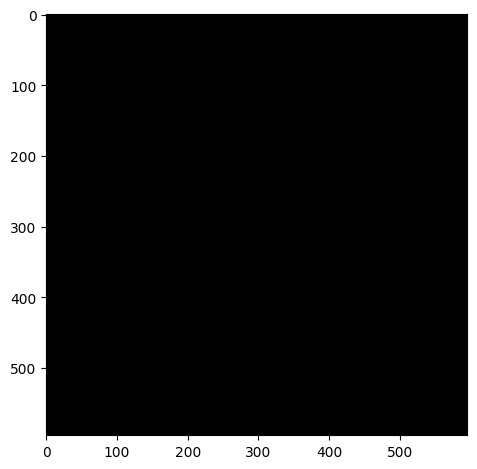

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_05.czi
Red Channel


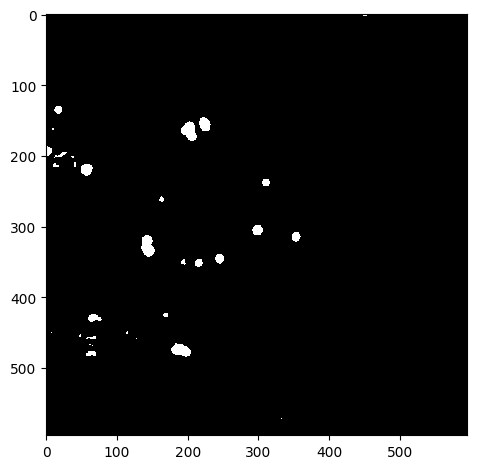

Green Channel


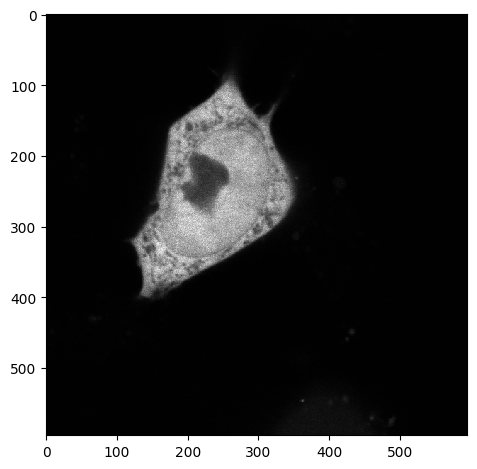

Segmented Cells


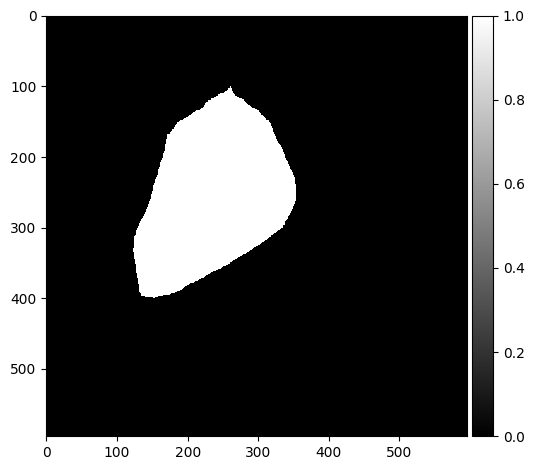

Threshold:  0.95
Bin count 62


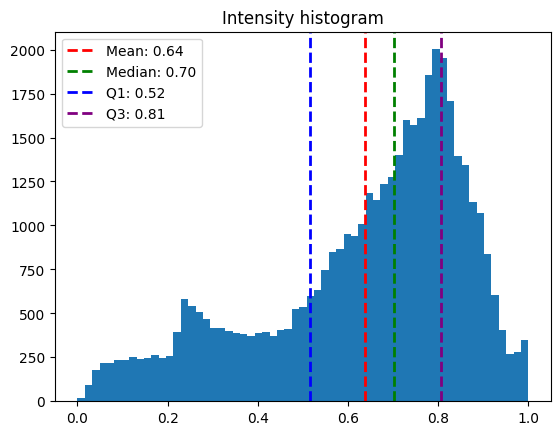

Inclusion Areas:  []


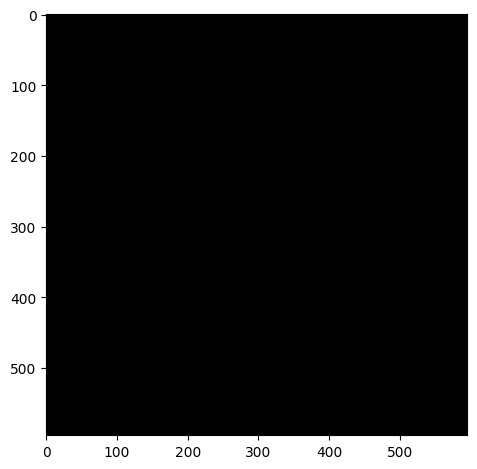

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_06.czi
Red Channel


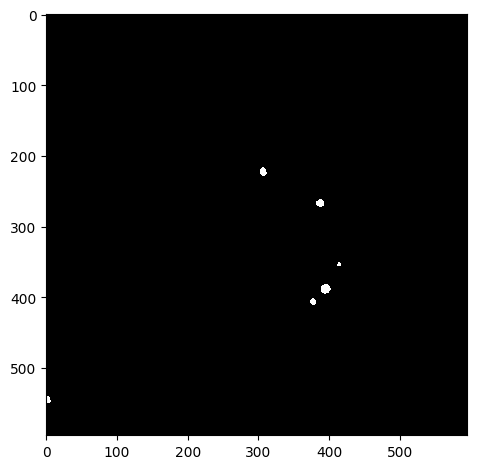

Green Channel


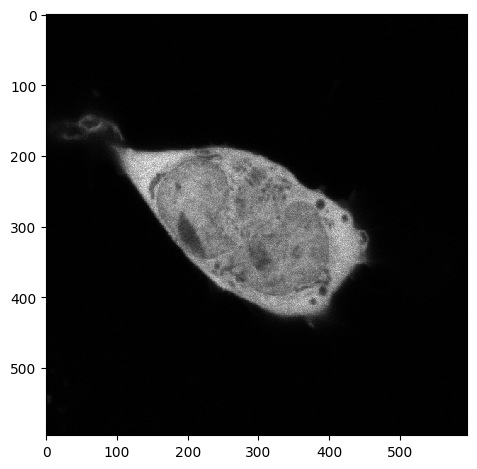

Segmented Cells


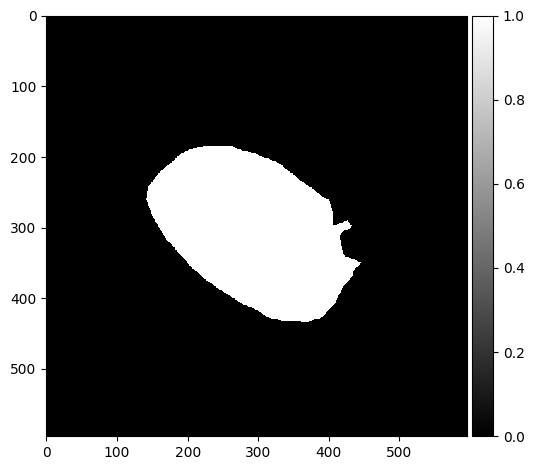

Threshold:  0.95
Bin count 138


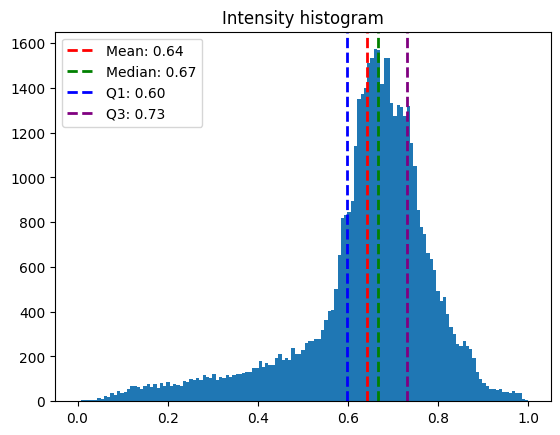

Inclusion Areas:  []


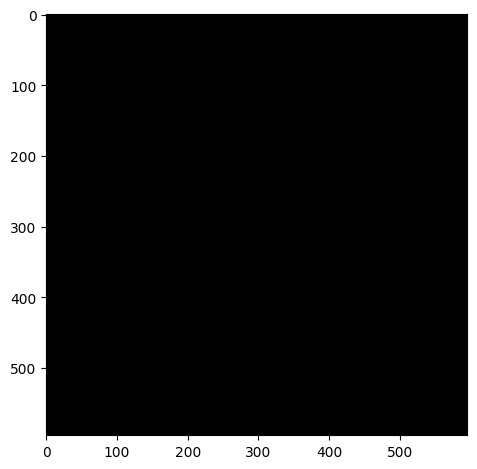

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_01.czi
Red Channel


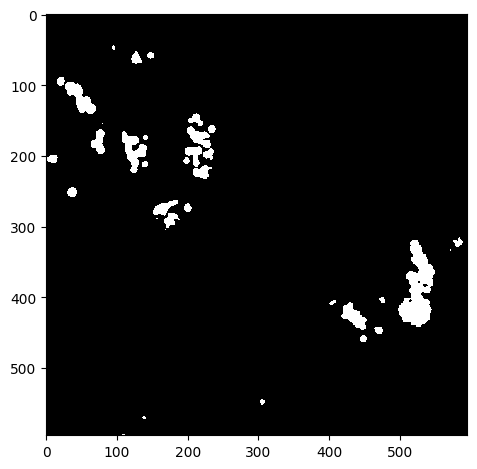

Green Channel


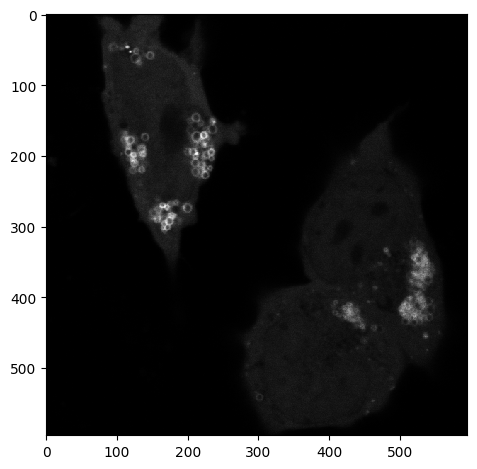

Segmented Cells


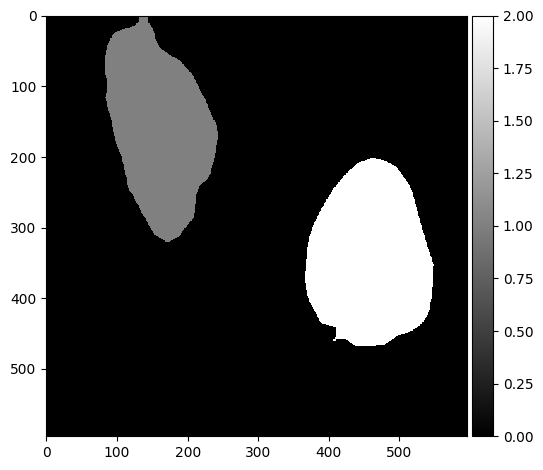

Threshold:  0.5
Bin count 114


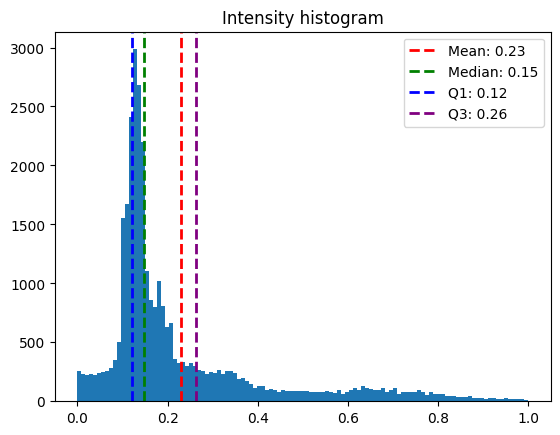

Inclusion Areas:  [ 14. 104.  88.  32.  50.  49.  13.  68. 132.  15.  47.  91. 210.  30.
  17.]


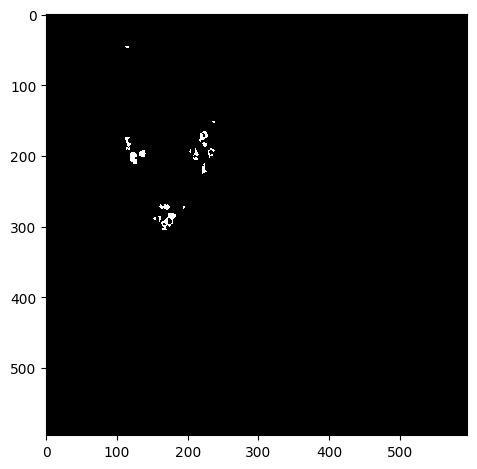

Threshold:  0.5
Bin count 313


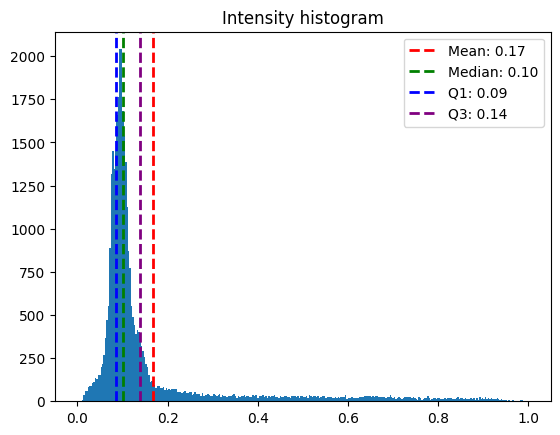

Inclusion Areas:  [24. 42. 18. 55. 20. 22. 23.]


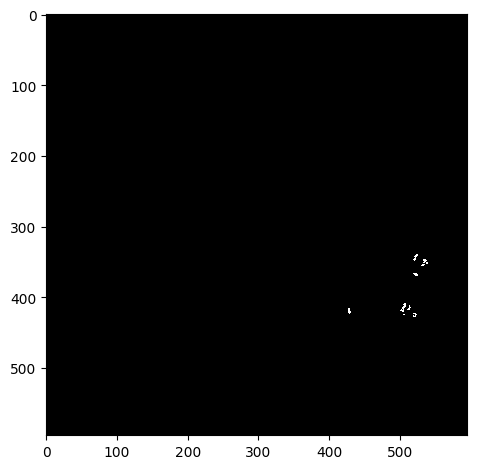

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_02.czi
Red Channel


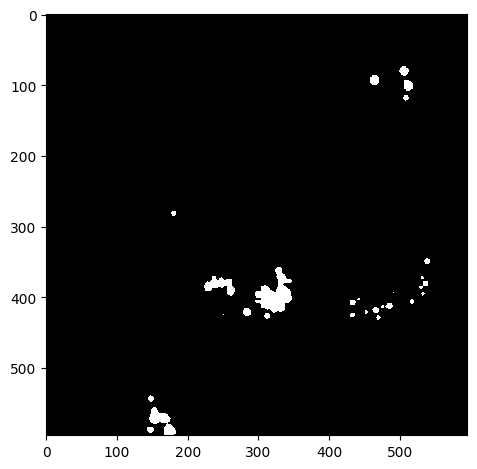

Green Channel


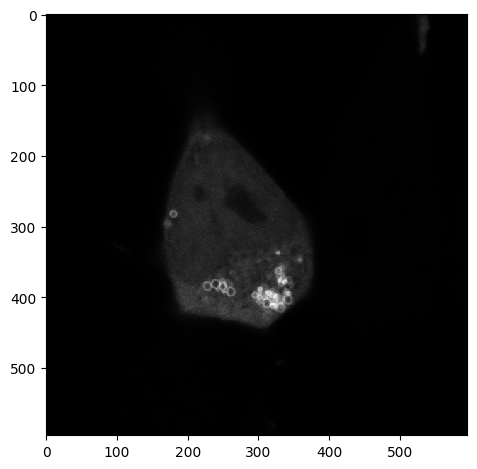

Segmented Cells


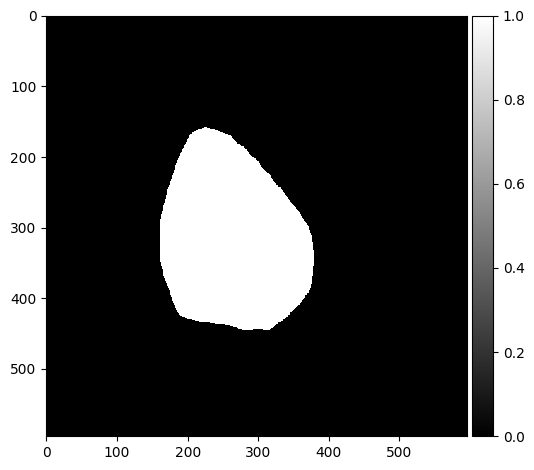

Threshold:  0.5
Bin count 242


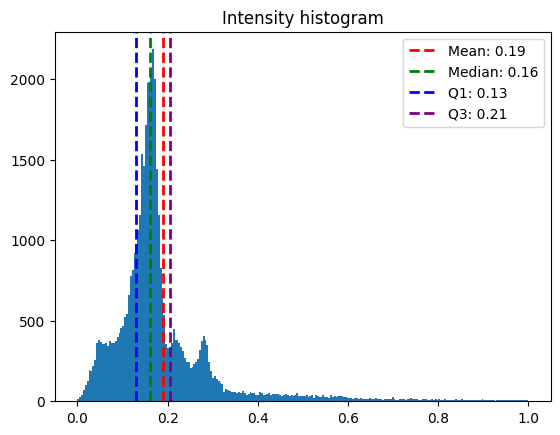

Inclusion Areas:  [ 17. 201. 119.  13. 811.]


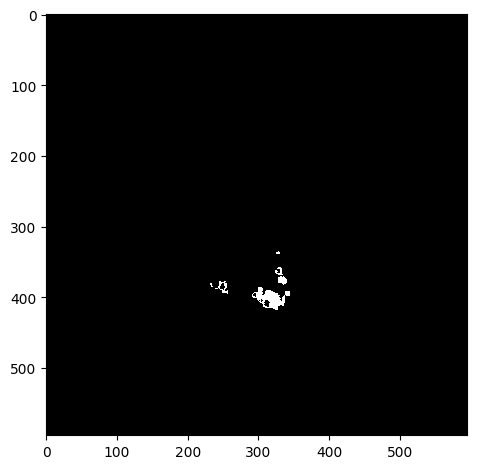

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_03.czi
Red Channel


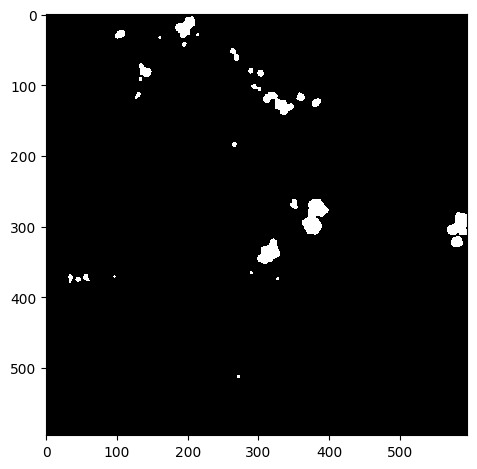

Green Channel


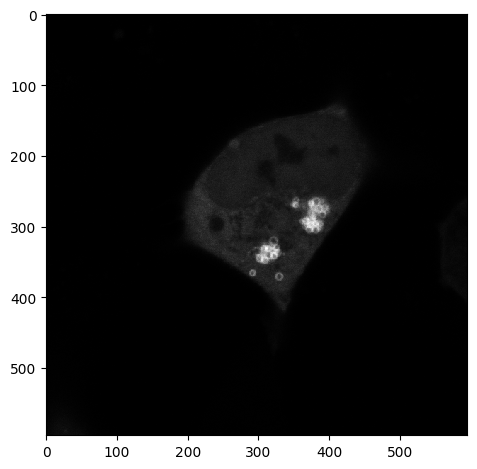

Segmented Cells


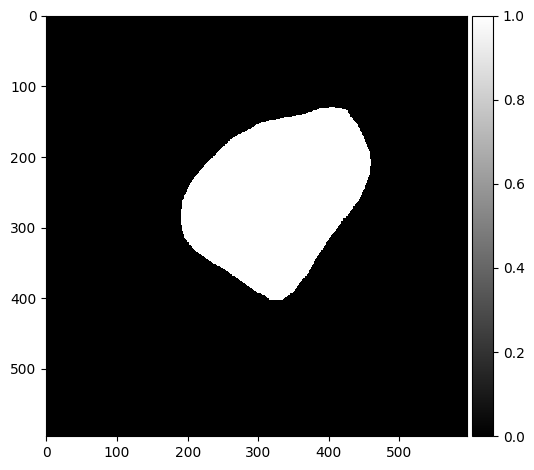

Threshold:  0.5
Bin count 322


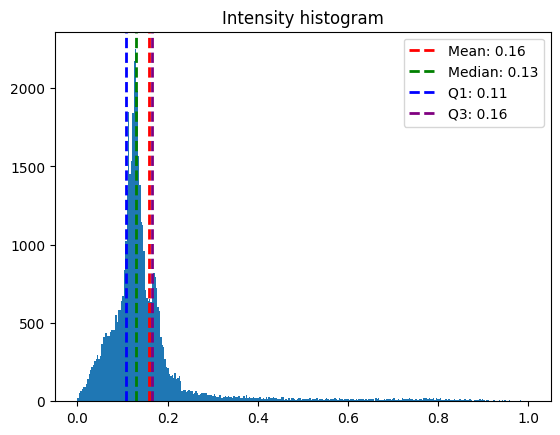

Inclusion Areas:  [821.  41. 557.]


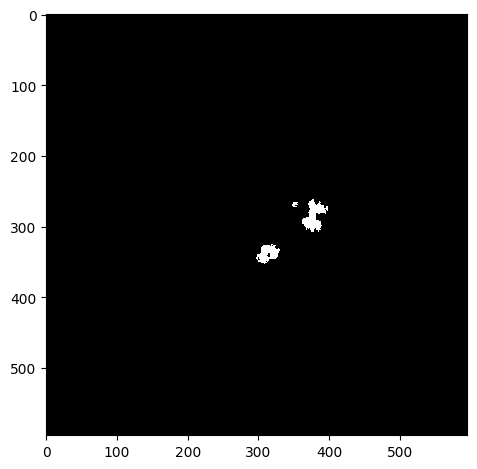

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_04.czi
Red Channel


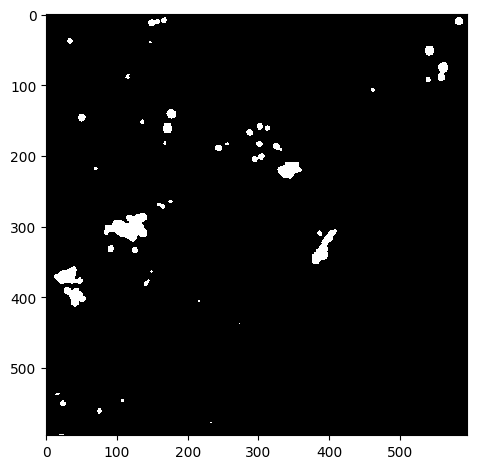

Green Channel


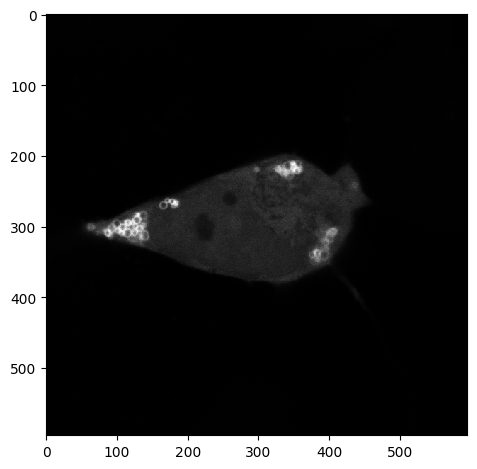

Segmented Cells


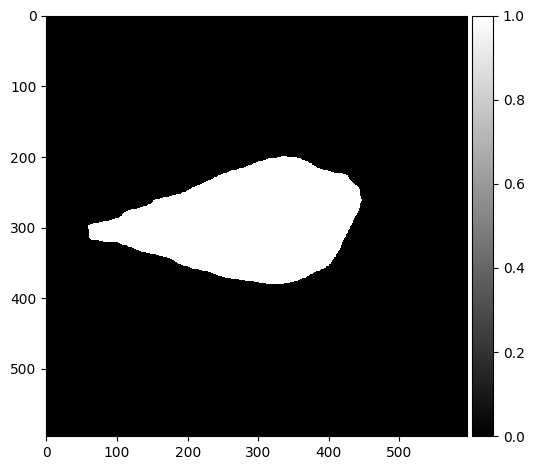

Threshold:  0.5
Bin count 397


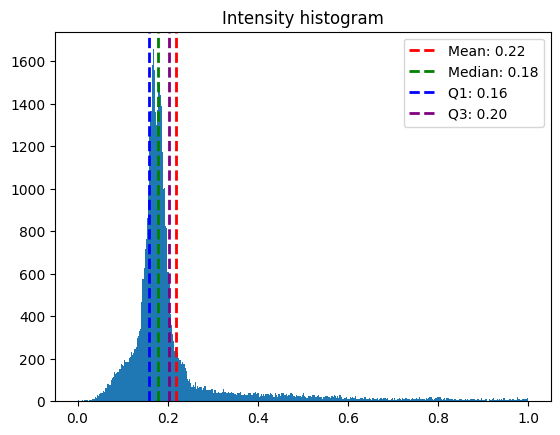

Inclusion Areas:  [ 442.  119. 1062.   77.   15.   88.]


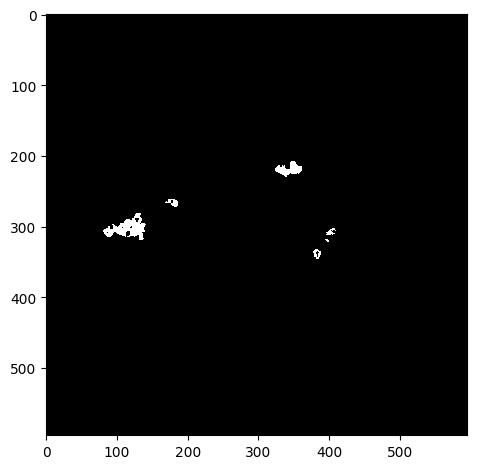

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_05.czi
Red Channel


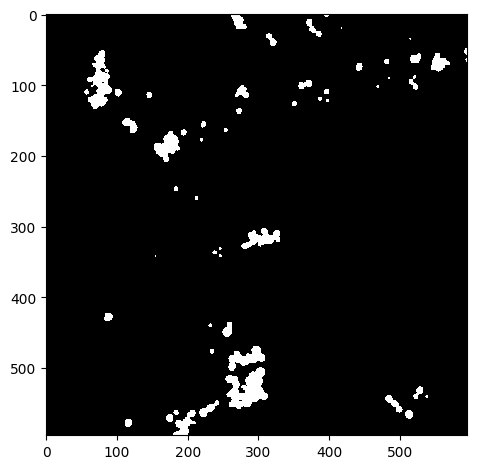

Green Channel


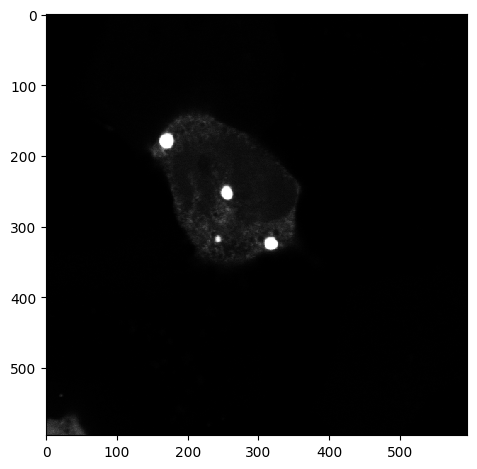

Segmented Cells


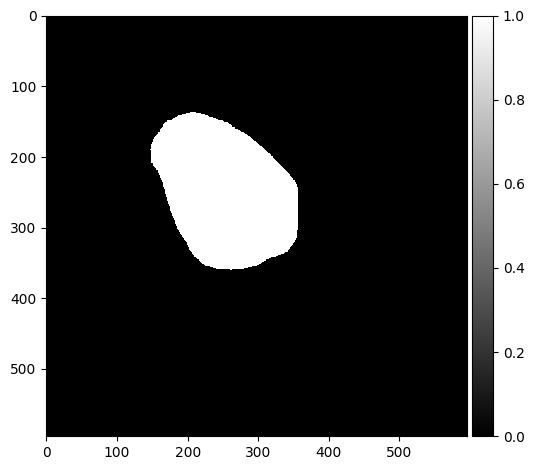

Threshold:  0.5
Bin count 302


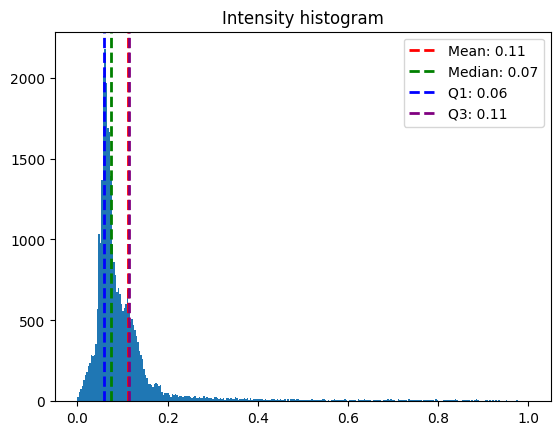

Inclusion Areas:  [373. 264.  57. 294.]


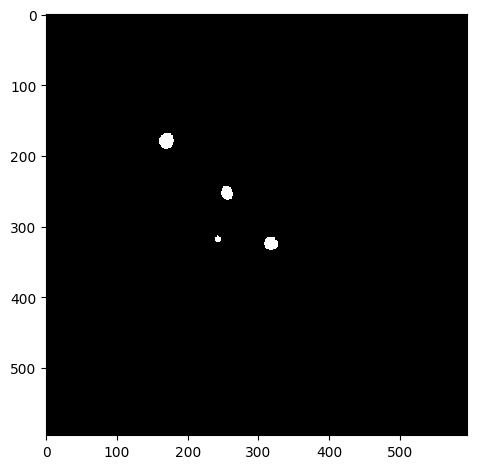

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_06.czi
Red Channel


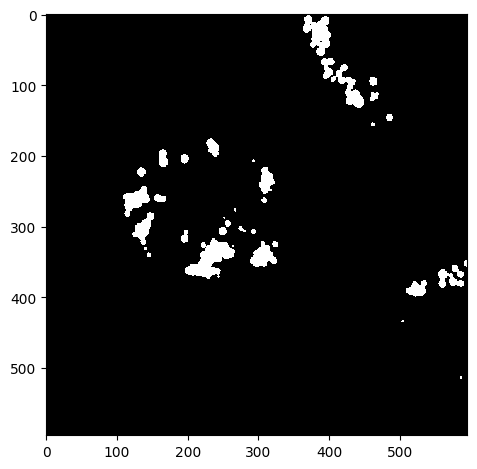

Green Channel


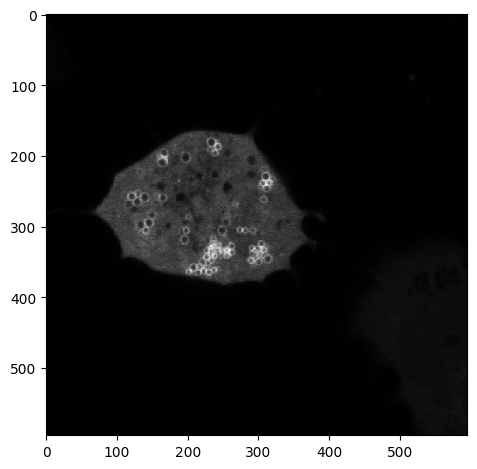

Segmented Cells


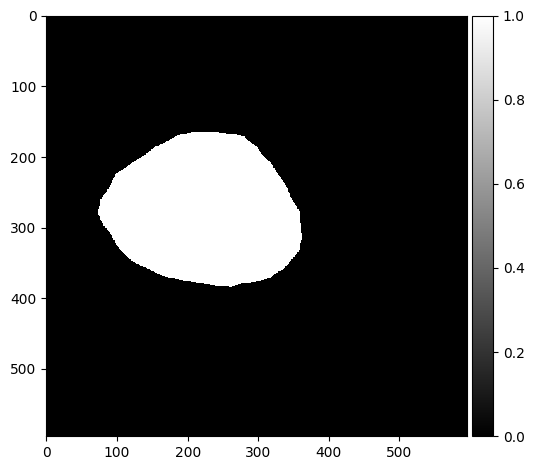

Threshold:  0.5
Bin count 175


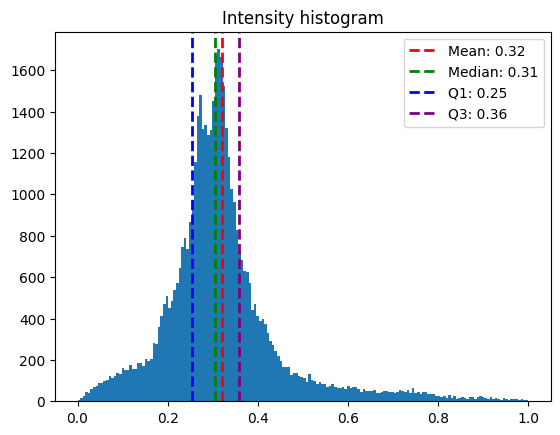

Inclusion Areas:  [ 77.  79. 159.  21.  31.  19.  18. 960. 310.]


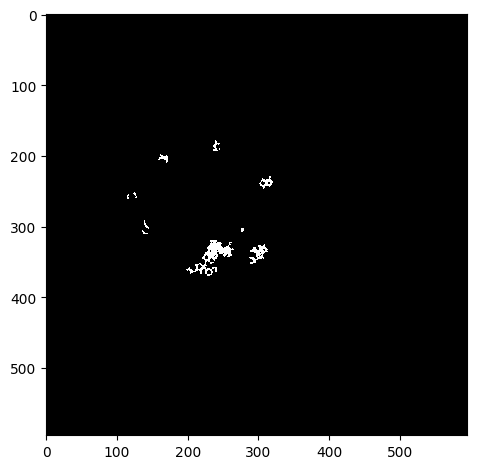

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_noOA_LT_01.czi
Red Channel


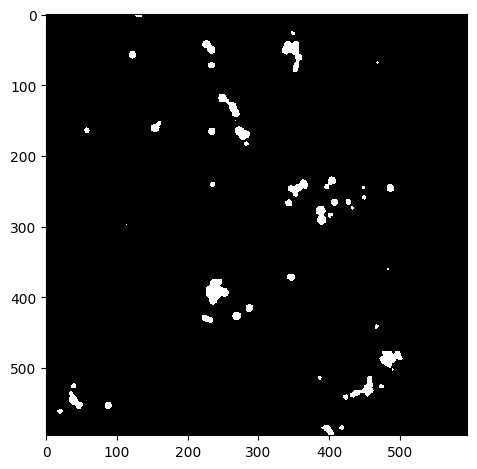

Green Channel


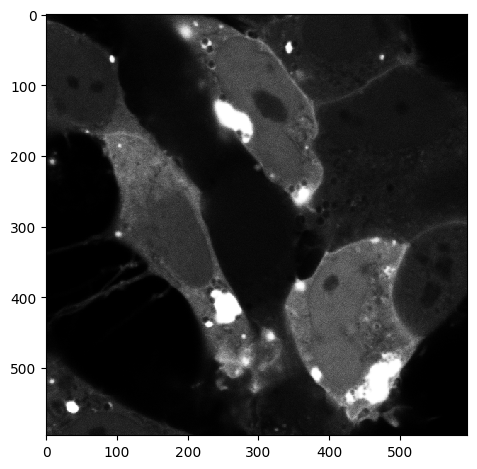

Segmented Cells


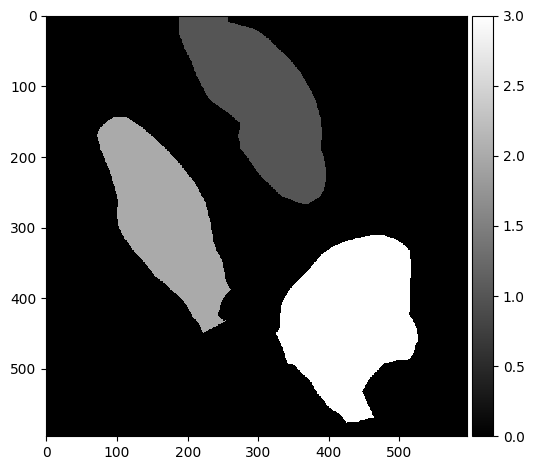

Threshold:  0.5
Bin count 270


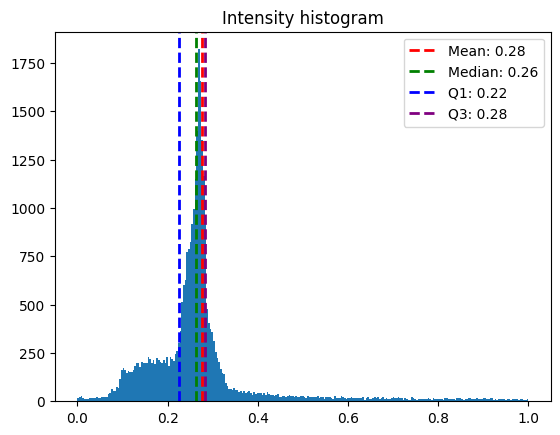

Inclusion Areas:  [  39.  317.   20.   88. 1031.   14.   16.  614.]


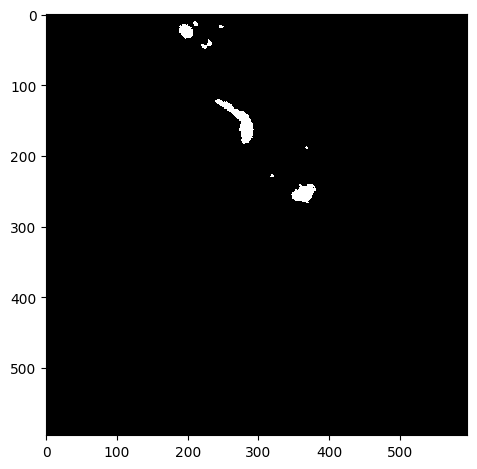

Threshold:  0.5
Bin count 106


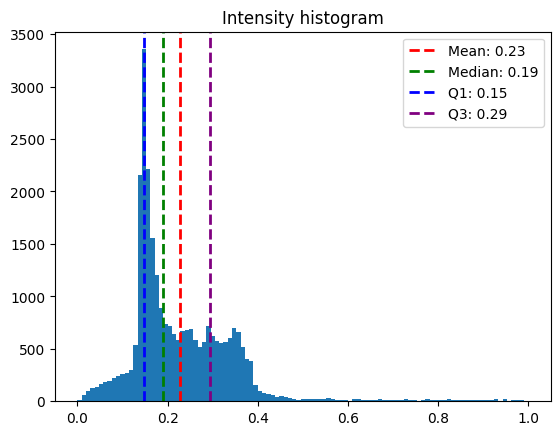

Inclusion Areas:  [ 43.  11. 549.  87.]


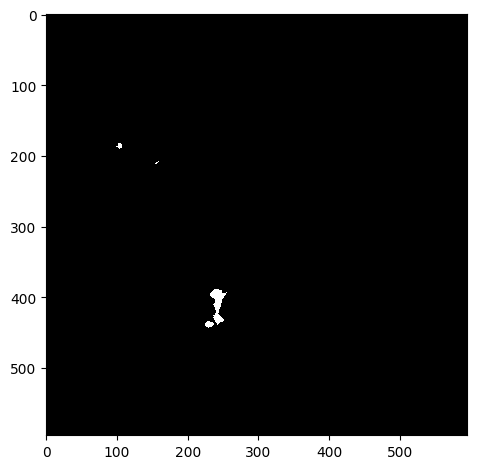

Threshold:  0.5
Bin count 237


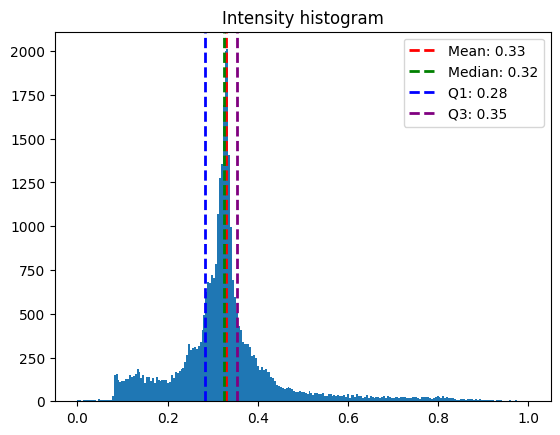

Inclusion Areas:  [ 111.   50.  373.   15.  254.   17.   47.   26.   12.   23. 1575.   24.
  295.   15.]


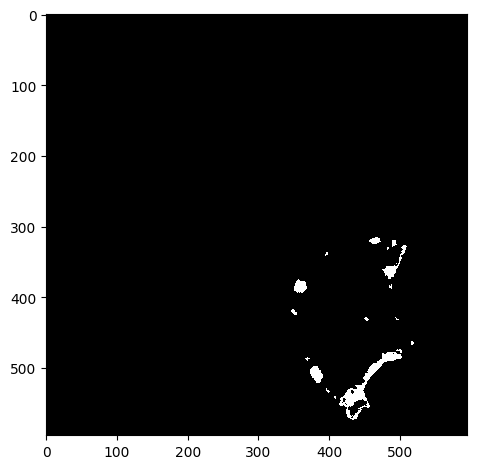

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_noOA_LT_02.czi
Red Channel


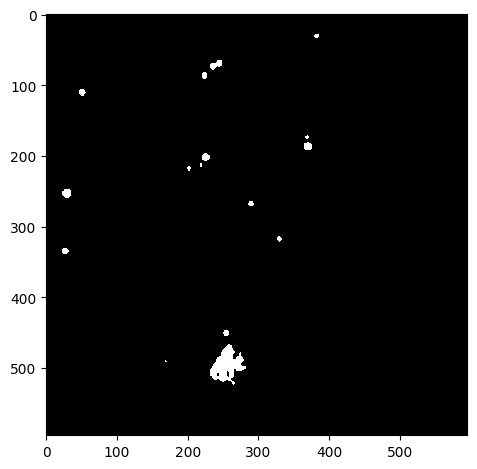

Green Channel


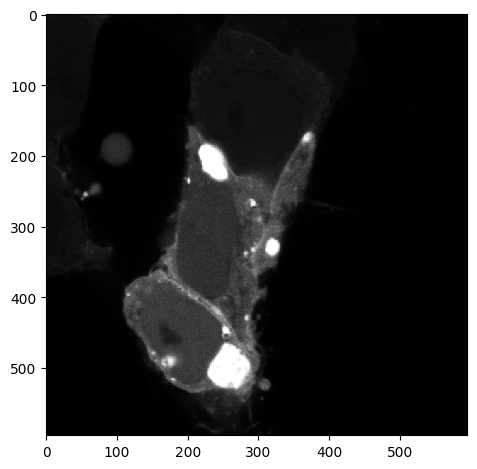

Segmented Cells


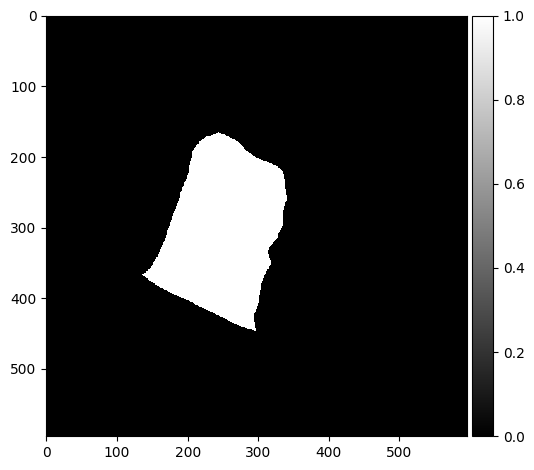

Threshold:  0.5
Bin count 132


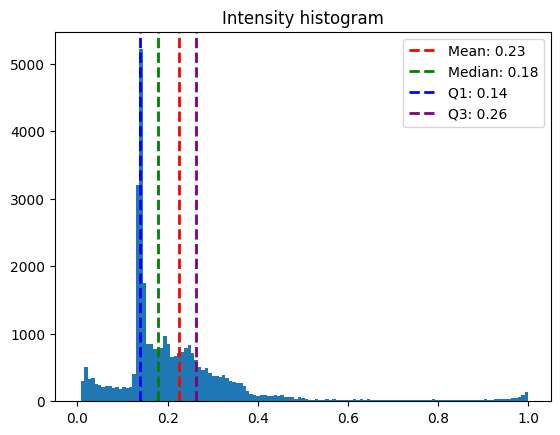

Inclusion Areas:  [1600.   31.   96.   26.  163.  124.   35.   16.   11.   43.   74.  112.
   47.]


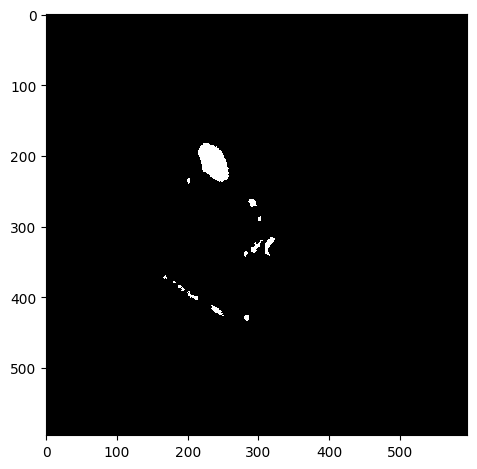

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_noOA_LT_03.czi
Red Channel


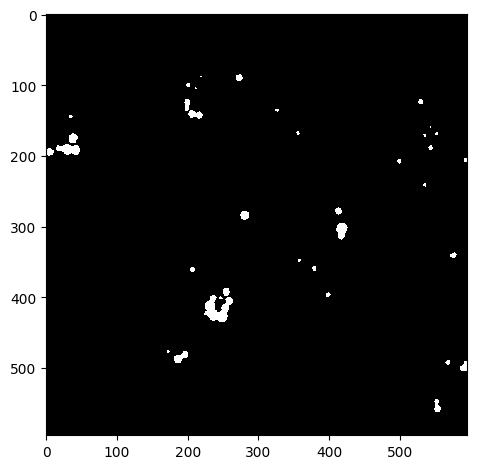

Green Channel


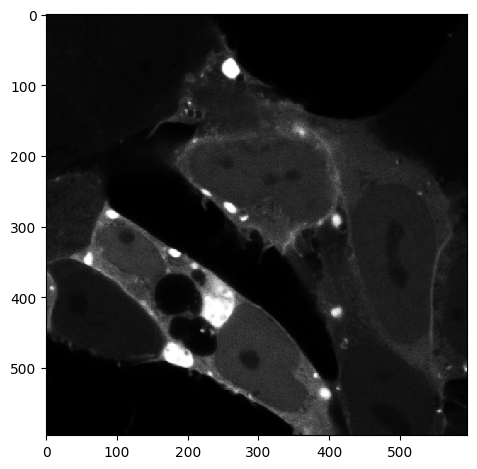

Segmented Cells


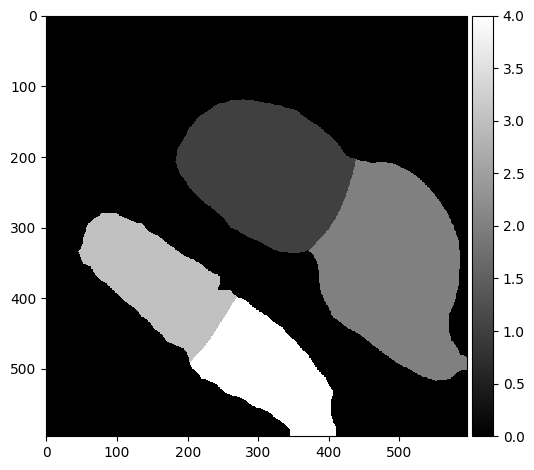

Threshold:  0.5
Bin count 228


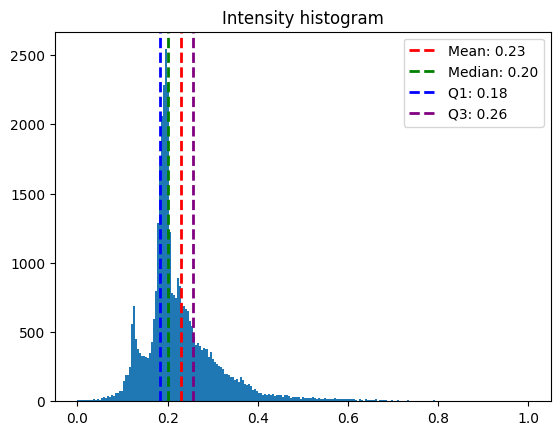

Inclusion Areas:  [111.  22.  87. 209.  46.  67.  18.]


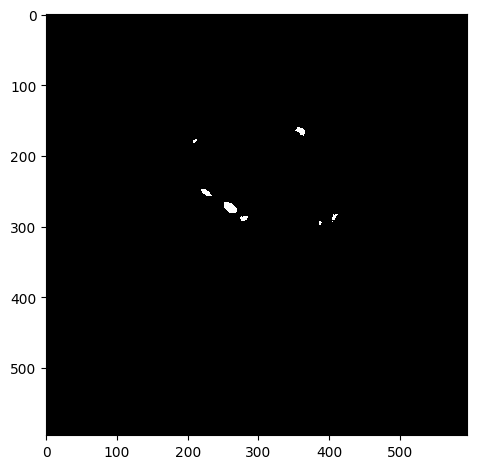

Threshold:  0.5
Bin count 370


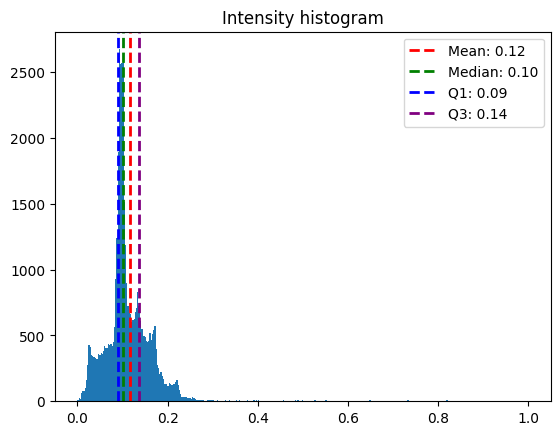

Inclusion Areas:  [122. 135.  12.]


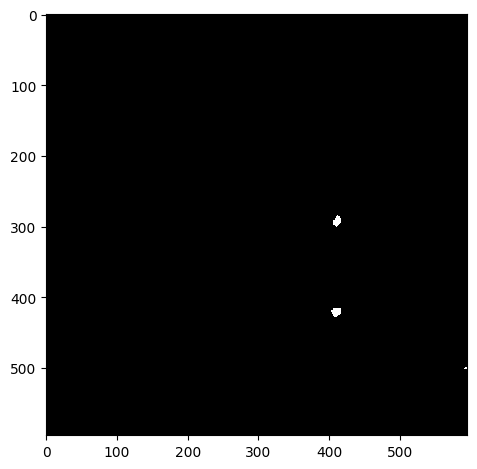

Threshold:  0.5
Bin count 87


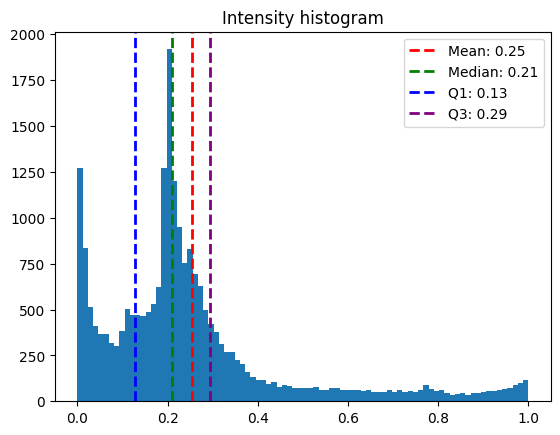

Inclusion Areas:  [ 189.  158.  214.   81.   22. 2070.   46.   38.   27.   73.]


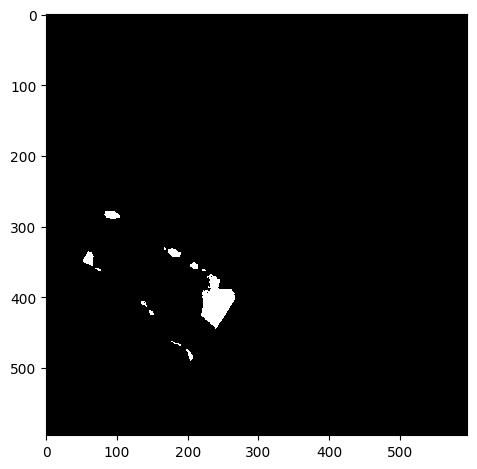

Threshold:  0.5
Bin count 160


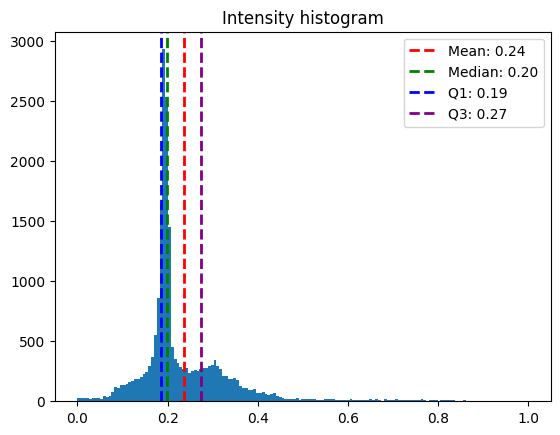

Inclusion Areas:  [274.  41.  47.  46. 241.  30.  24.]


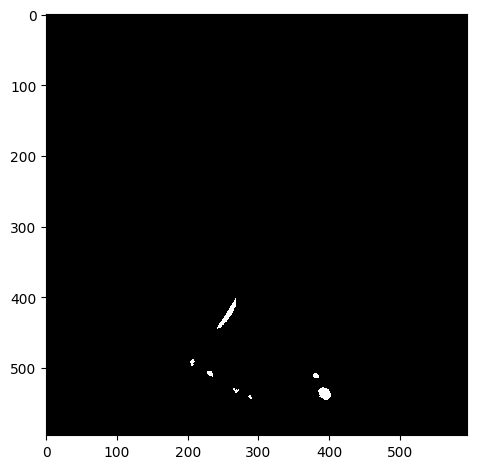

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_noOA_LT_04.czi
Red Channel


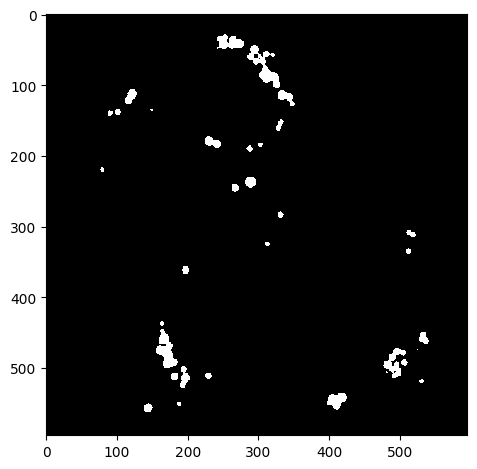

Green Channel


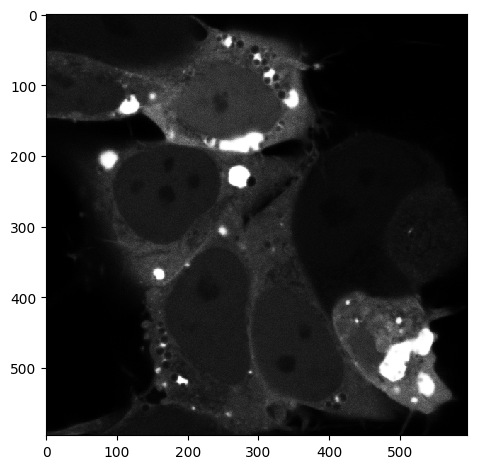

Segmented Cells


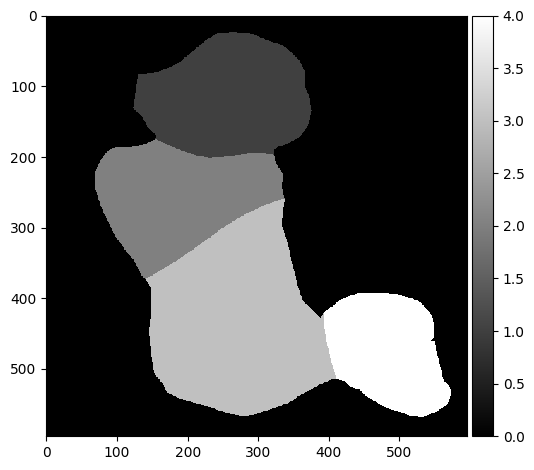

Threshold:  0.5
Bin count 168


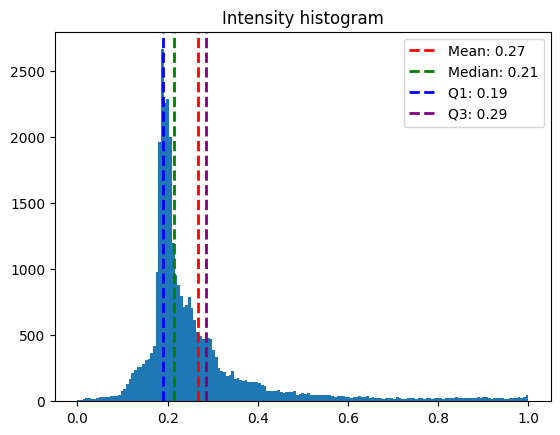

Inclusion Areas:  [ 148.   92.  172.  434.   76.  107.  116. 1312.  142.]


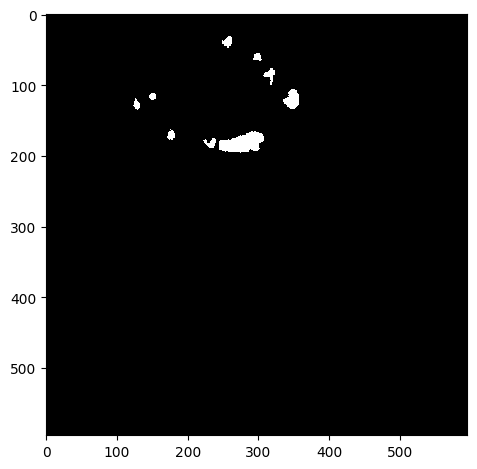

Threshold:  0.5
Bin count 207


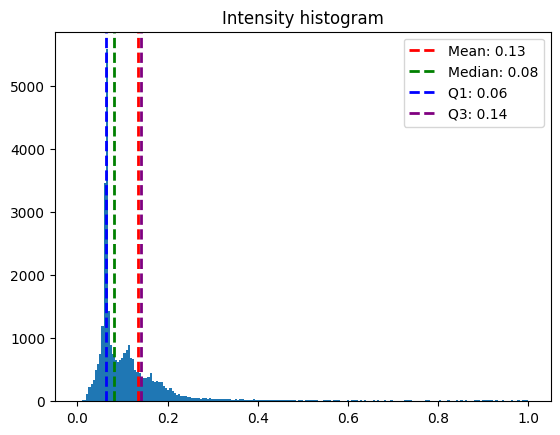

Inclusion Areas:  [473.  12. 773.  44.]


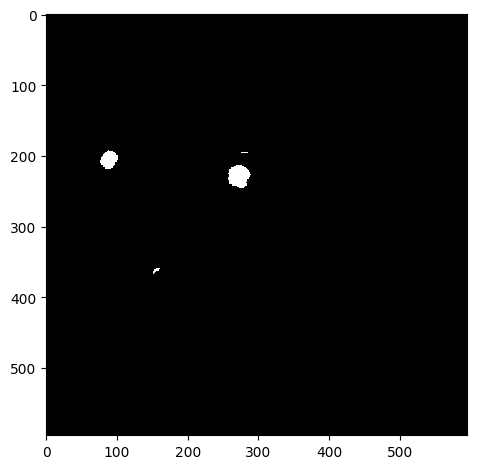

Threshold:  0.5
Bin count 263


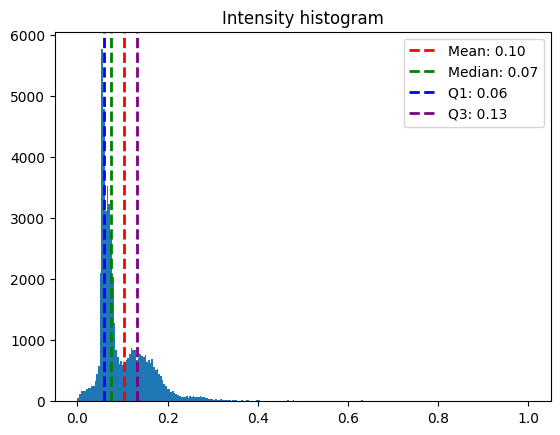

Inclusion Areas:  [100.  22. 178.  35.  28.  11. 130.  15.]


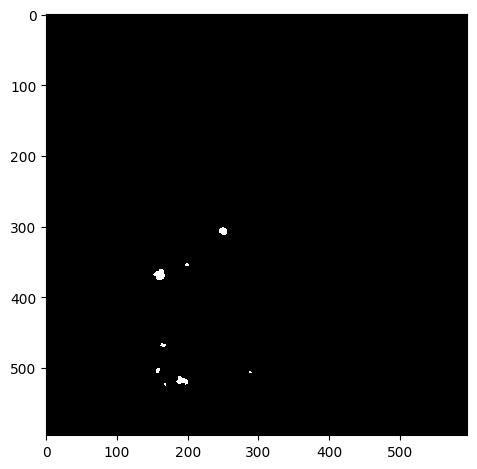

Threshold:  0.5
Bin count 68


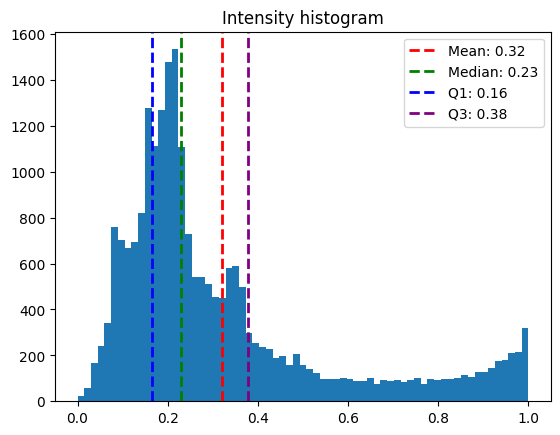

Inclusion Areas:  [  33.   66.   24. 2759.   27.  737.   94.   78.]


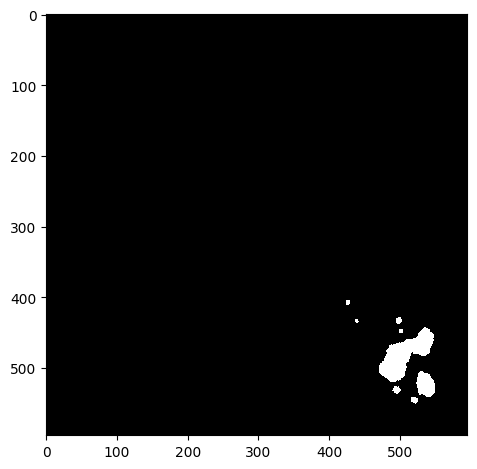

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_noOA_LT_05.czi
Red Channel


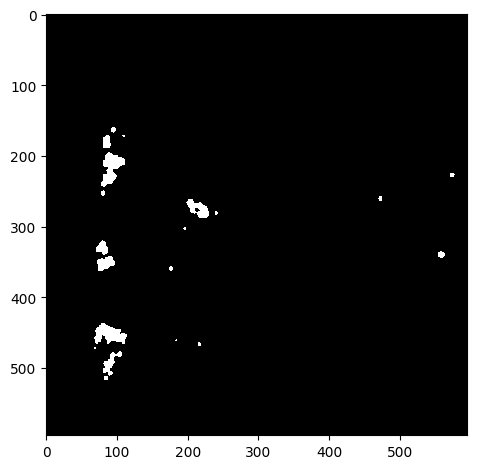

Green Channel


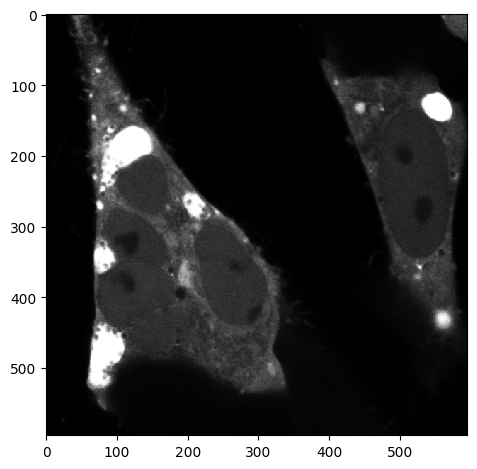

Segmented Cells


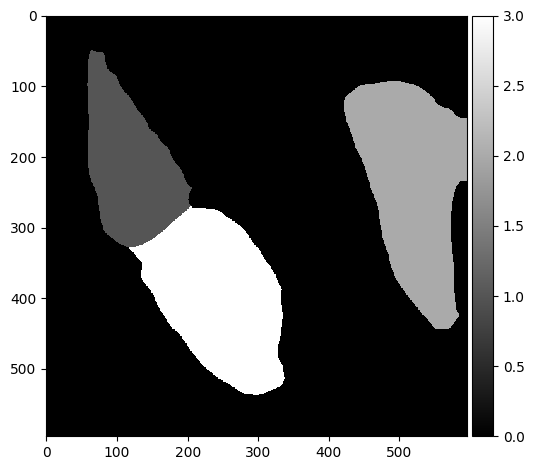

Threshold:  0.5
Bin count 60


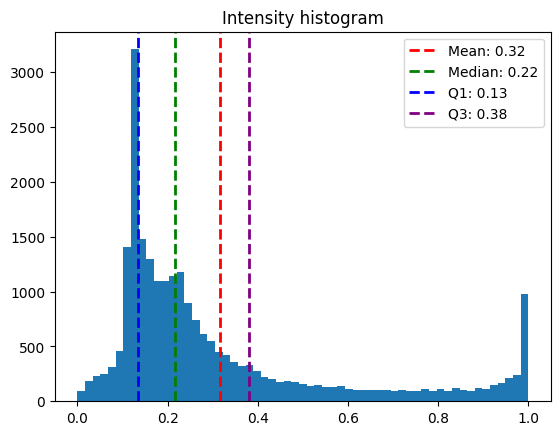

Inclusion Areas:  [  51.   13.   21.  105.   57. 4131.   17.   46.  191.   75.]


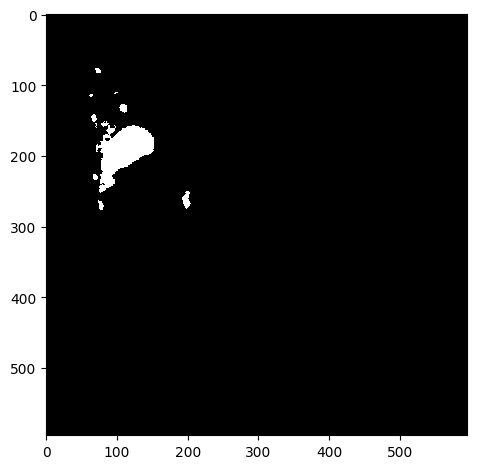

Threshold:  0.5
Bin count 316


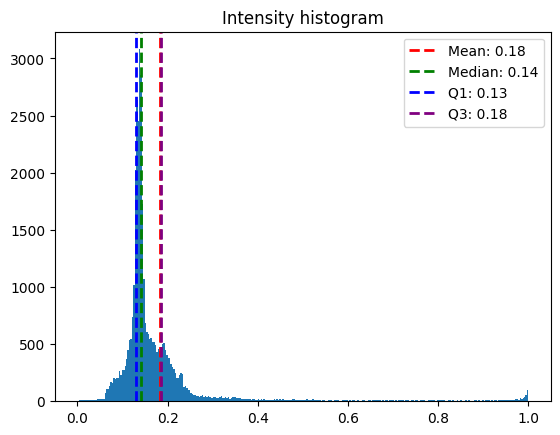

Inclusion Areas:  [1094.  146.   37.   26.  410.]


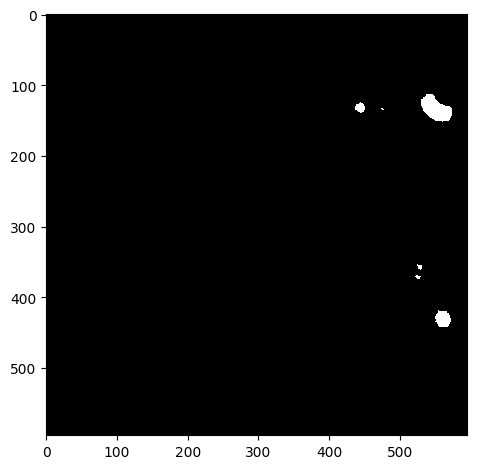

Threshold:  0.5
Bin count 271


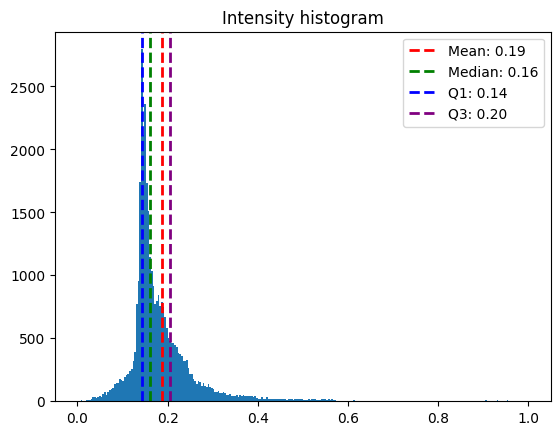

Inclusion Areas:  [352.  53.  27.  27.  13. 417.  22.]


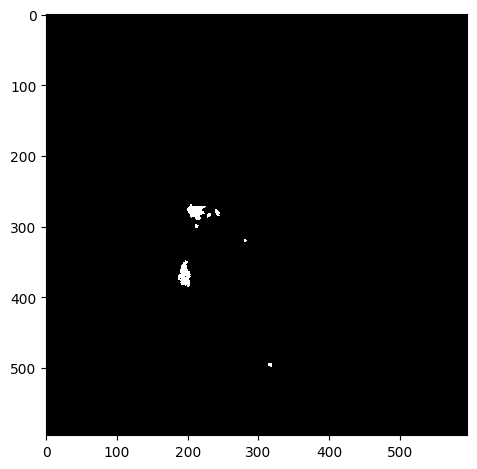

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_noOA_LT_06.czi
Red Channel


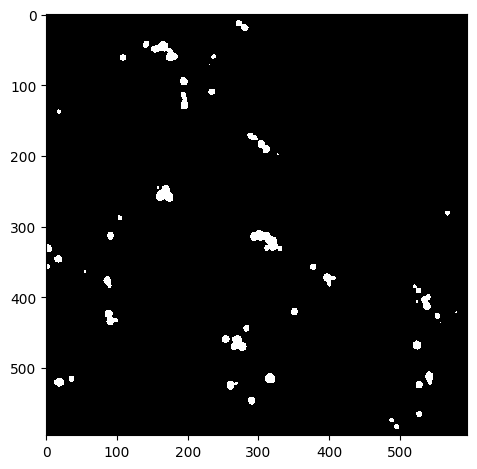

Green Channel


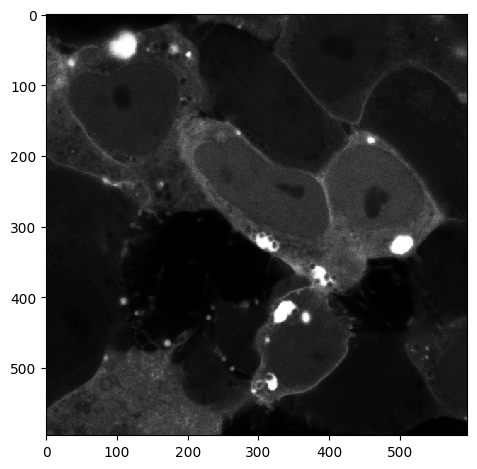

Segmented Cells


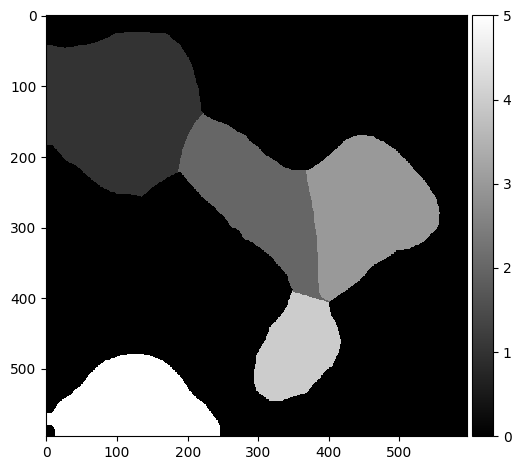

Threshold:  0.5
Bin count 220


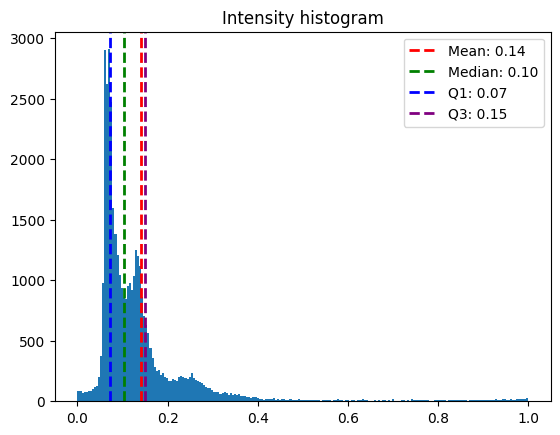

Inclusion Areas:  [1127.   77.   20.  105.   32.   39.   17.]


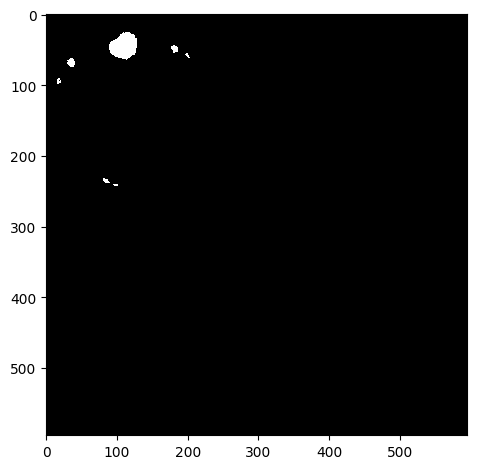

Threshold:  0.5
Bin count 184


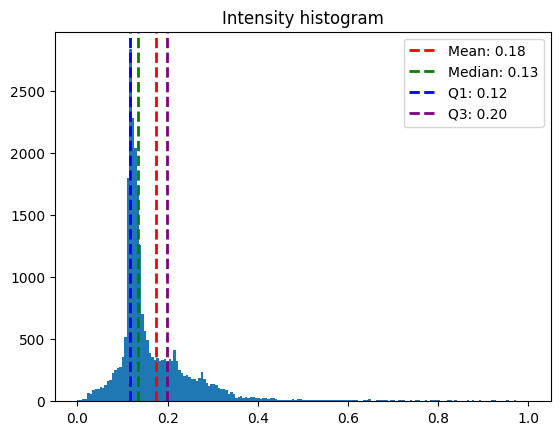

Inclusion Areas:  [ 34. 463.  76. 170.]


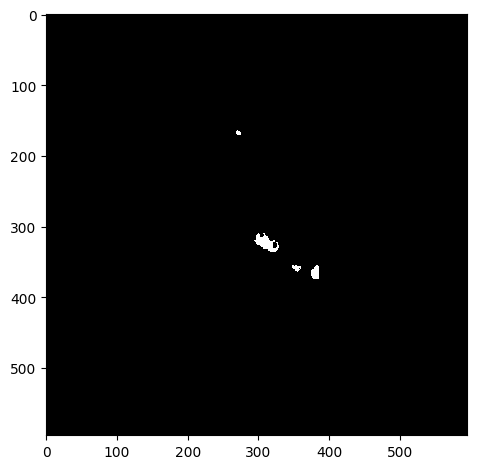

Threshold:  0.5
Bin count 215


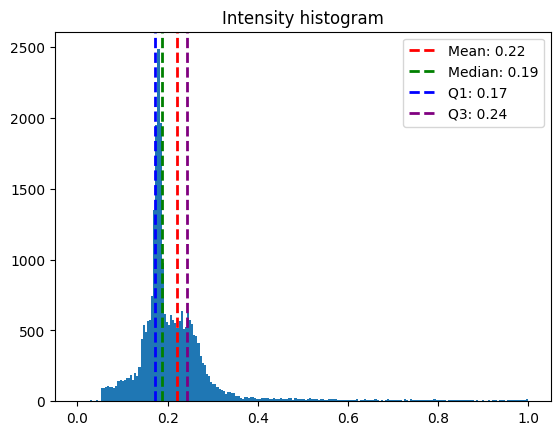

Inclusion Areas:  [115. 572. 340.]


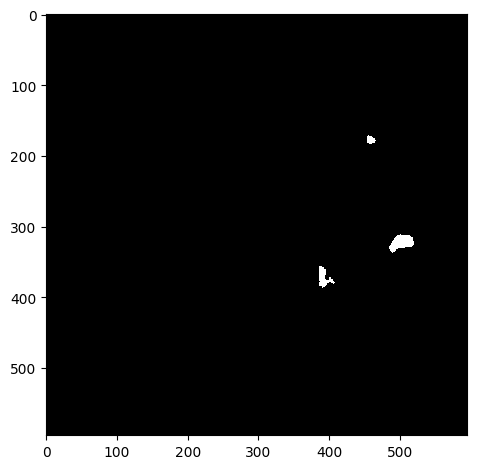

Threshold:  0.5
Bin count 125


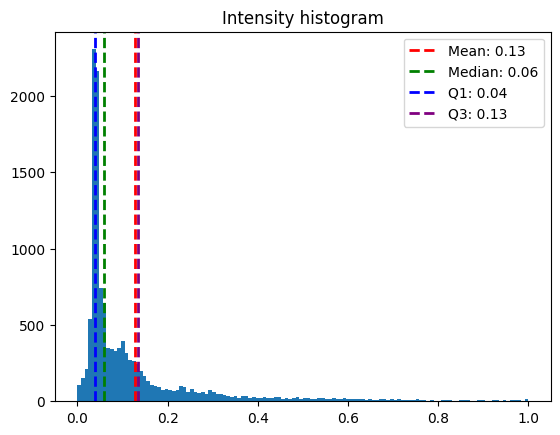

Inclusion Areas:  [369. 151.  27. 233.]


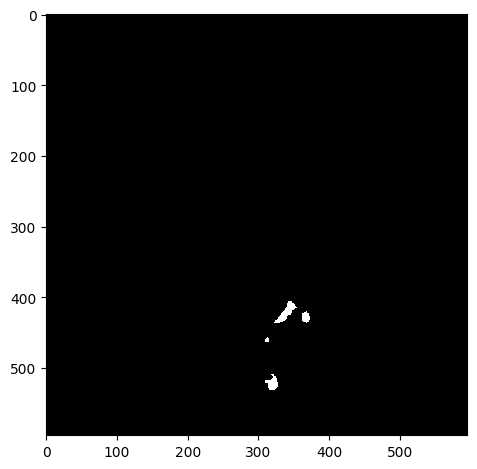

Threshold:  0.95
Bin count 65


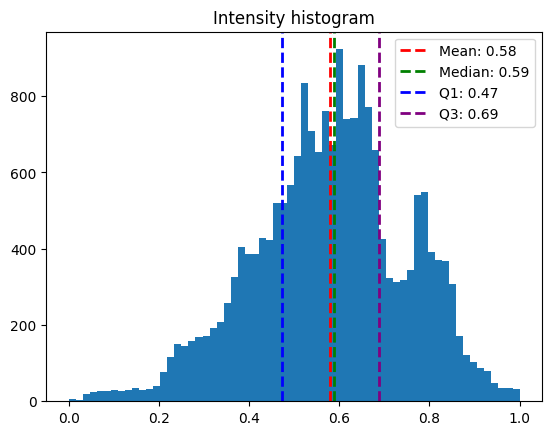

Inclusion Areas:  []


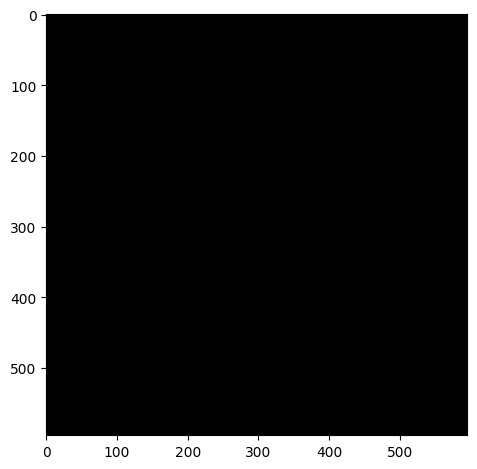

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_OA_LT_01.czi
Red Channel


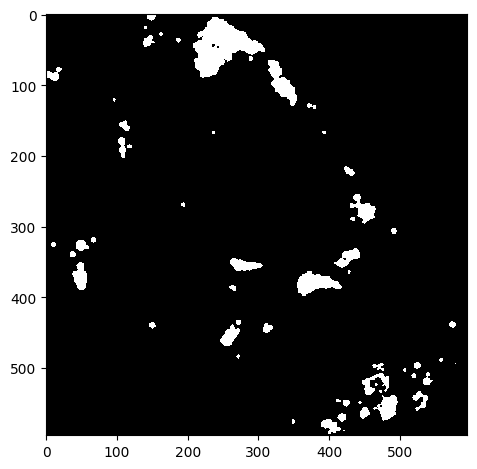

Green Channel


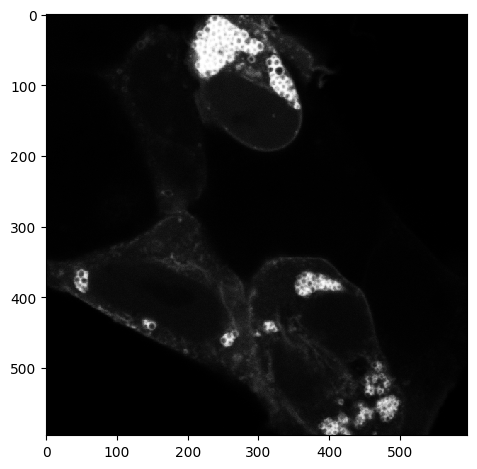

Segmented Cells


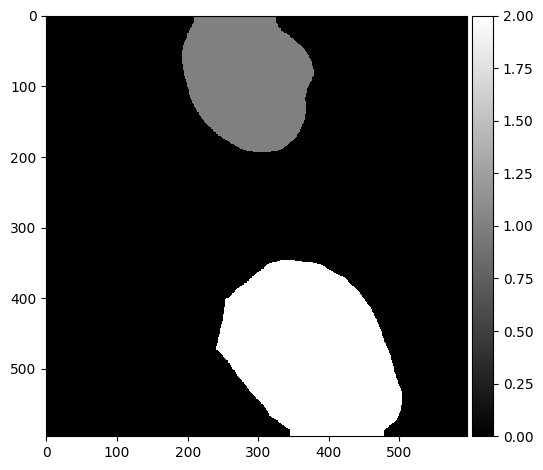

Threshold:  0.5
Bin count 46


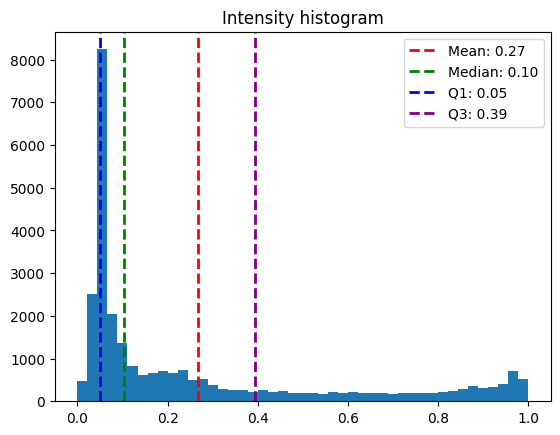

Inclusion Areas:  [4739.   11. 1303.]


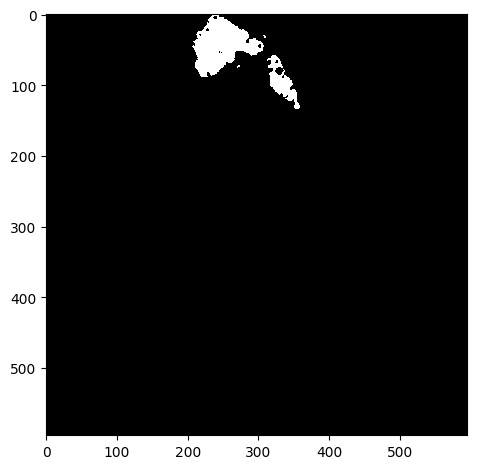

Threshold:  0.5
Bin count 167


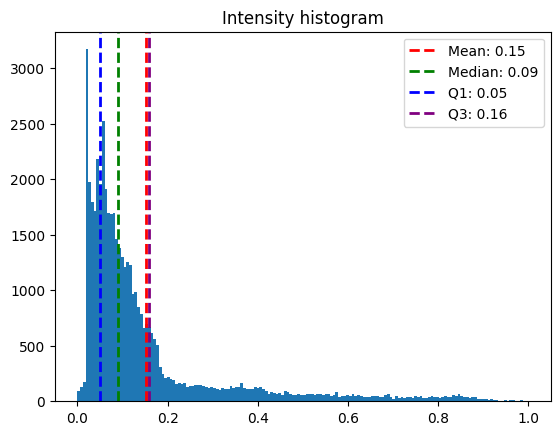

Inclusion Areas:  [1013.  153.   13.  204.   16.   29.   93.   26.  508.  195.   62.  322.
   71.]


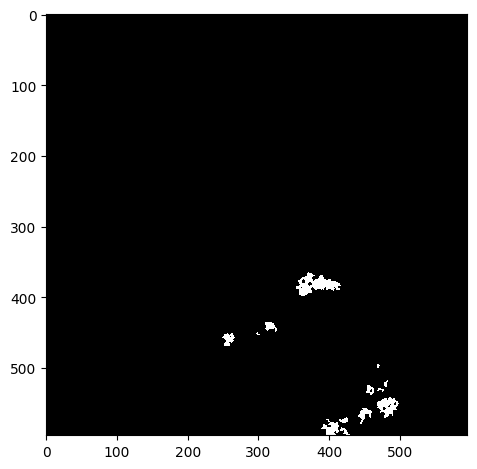

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_OA_LT_02.czi
Red Channel


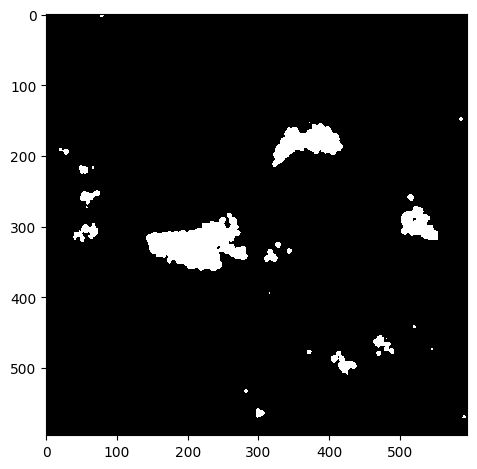

Green Channel


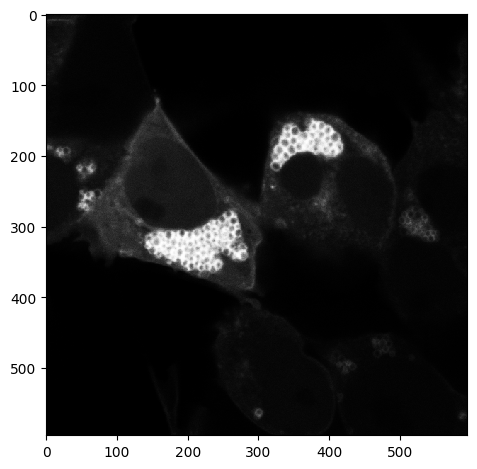

Segmented Cells


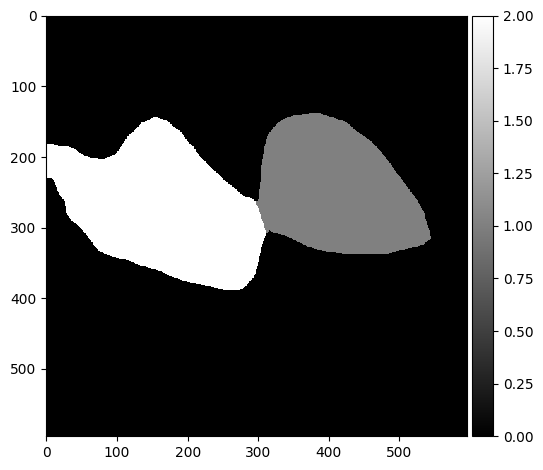

Threshold:  0.5
Bin count 161


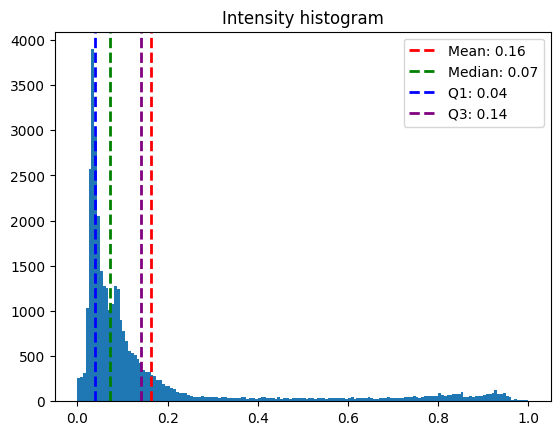

Inclusion Areas:  [3683.]


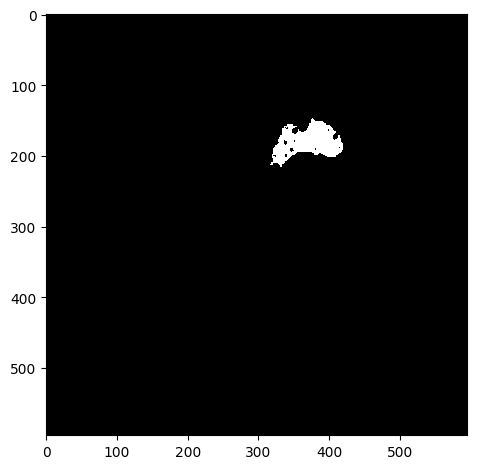

Threshold:  0.5
Bin count 129


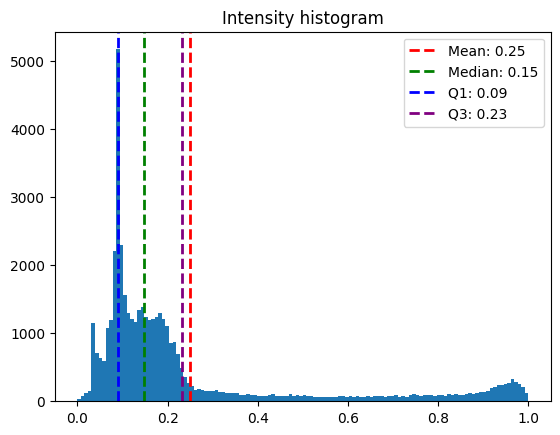

Inclusion Areas:  [  31.   44.   14.  216. 6632.]


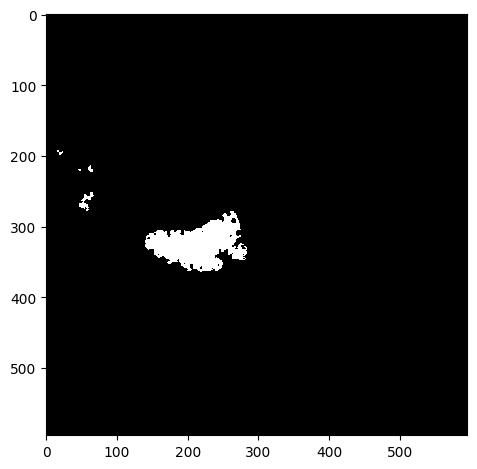

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_OA_LT_03.czi
Red Channel


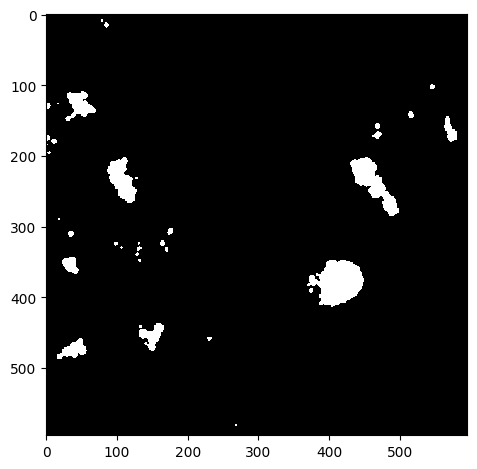

Green Channel


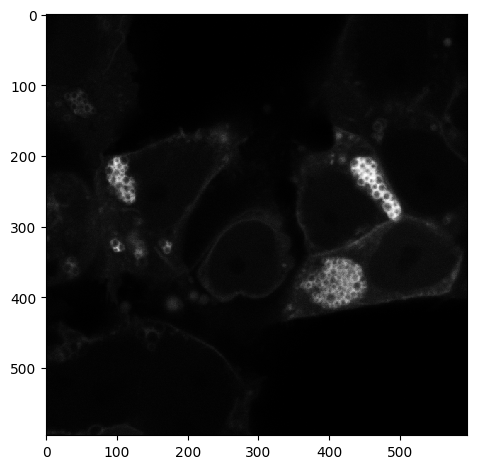

Segmented Cells


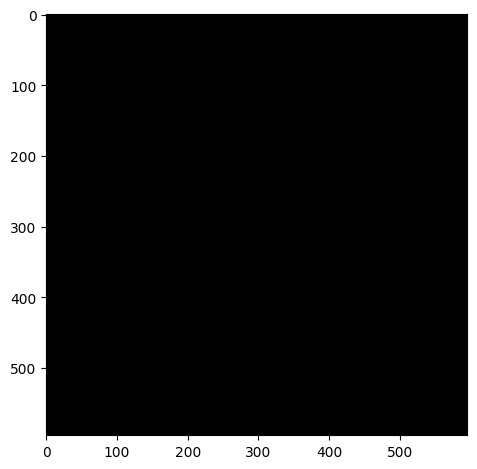

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_OA_LT_04.czi
Red Channel


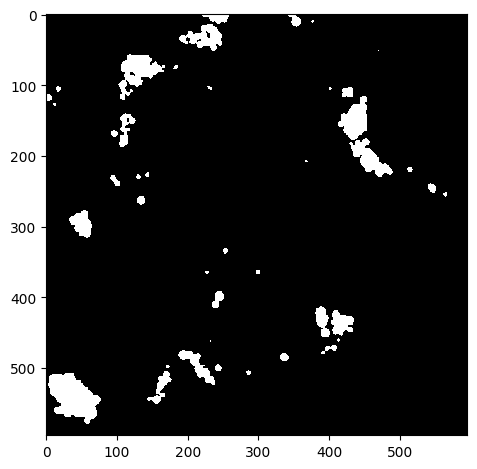

Green Channel


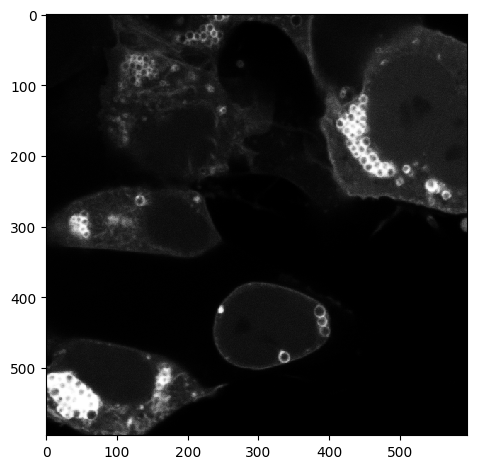

Segmented Cells


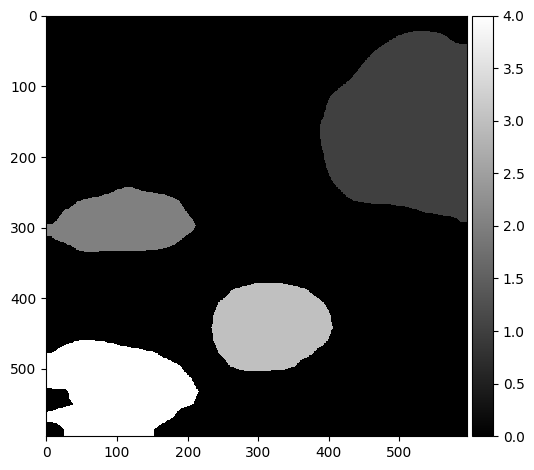

Threshold:  0.5
Bin count 213


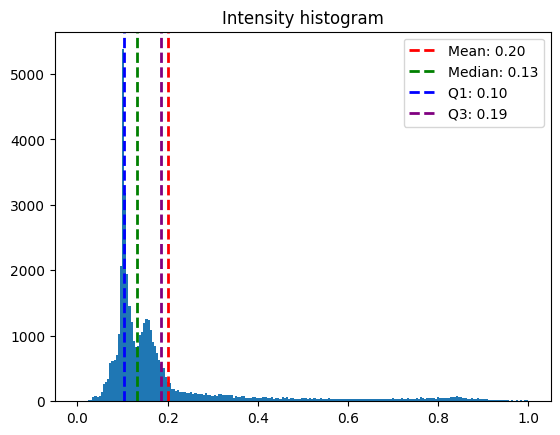

Inclusion Areas:  [3249.   84.  365.   23.   99.]


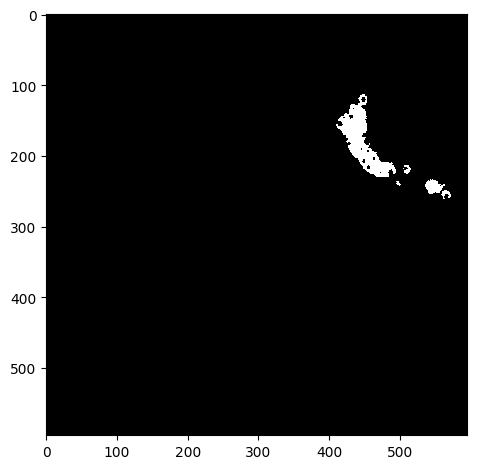

Threshold:  0.5
Bin count 91


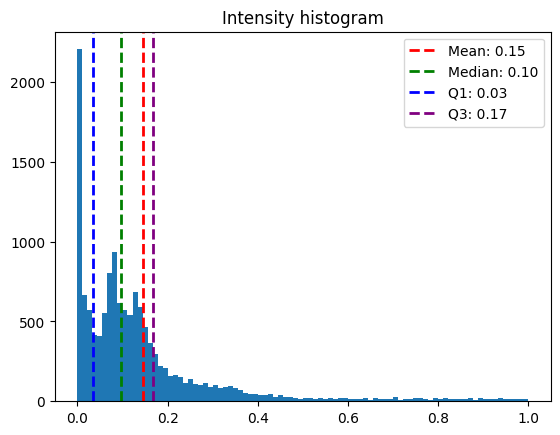

Inclusion Areas:  [ 18.  23. 648.  56.]


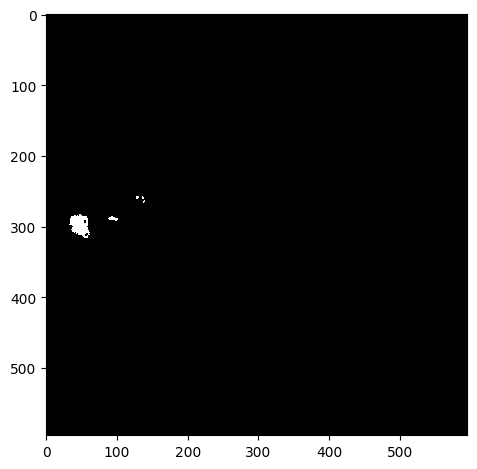

Threshold:  0.5
Bin count 195


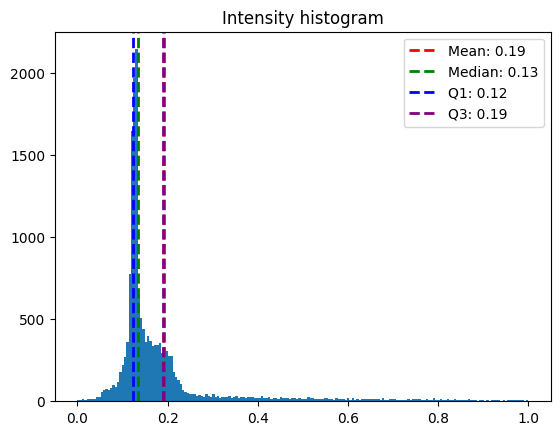

Inclusion Areas:  [64. 81. 77.]


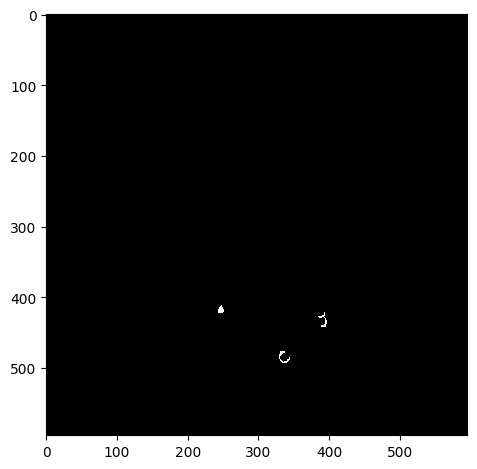

Threshold:  0.5
Bin count 63


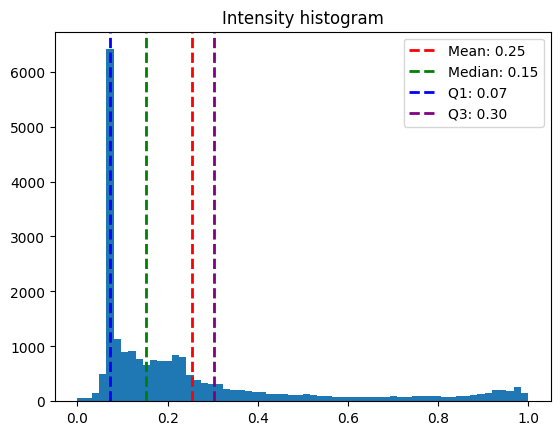

Inclusion Areas:  [ 647. 2822.   14.   18.   14.   61.]


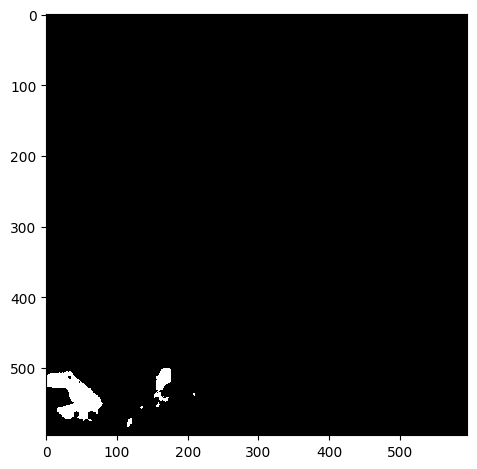

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_OA_LT_05.czi
Red Channel


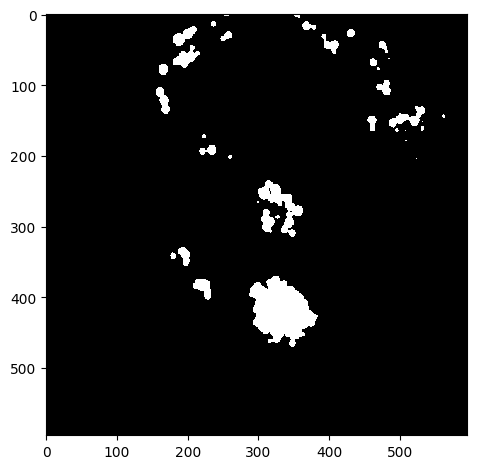

Green Channel


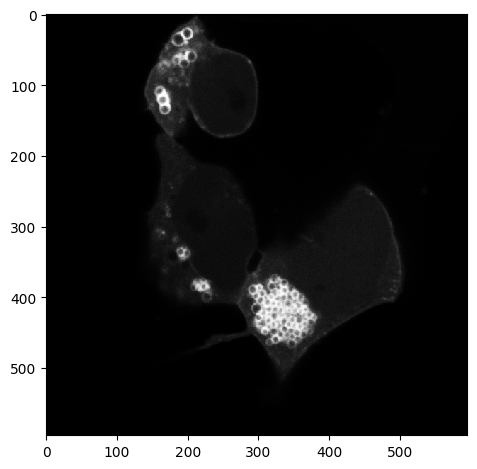

Segmented Cells


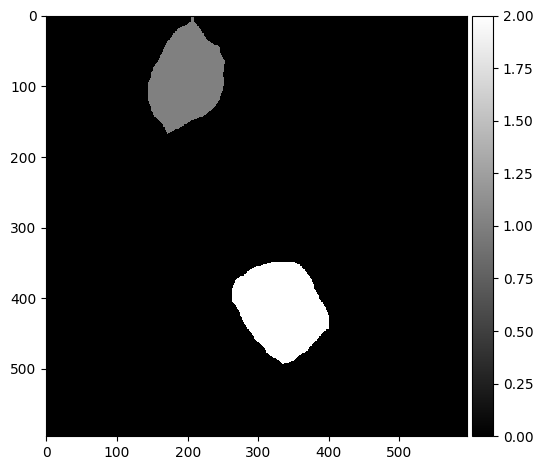

Threshold:  0.5
Bin count 46


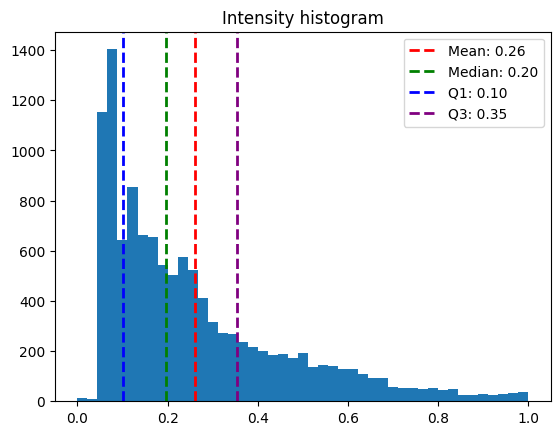

Inclusion Areas:  [240.  16. 262.  38. 508.]


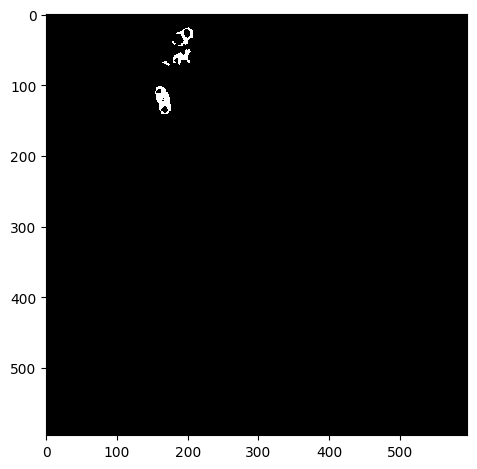

Threshold:  0.95
Bin count 19


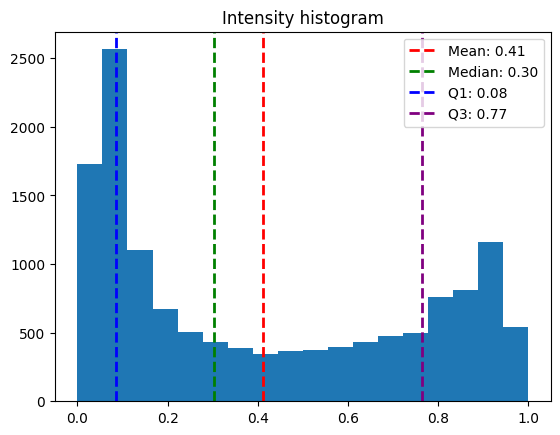

Inclusion Areas:  [24. 23. 12. 11. 12.]


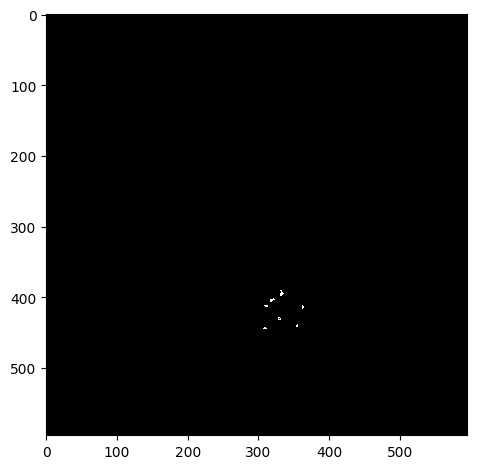

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_OA_LT_06.czi
Red Channel


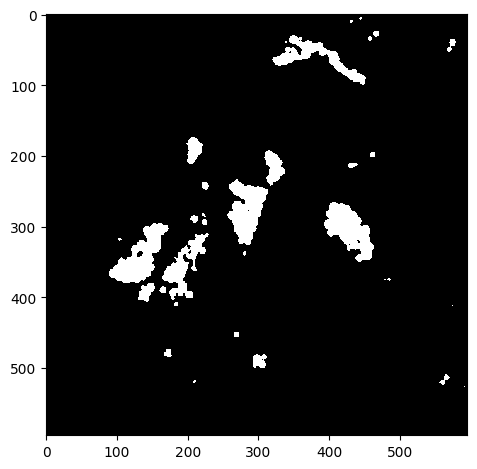

Green Channel


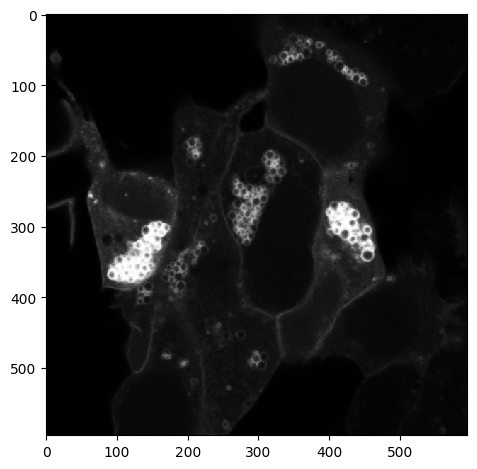

Segmented Cells


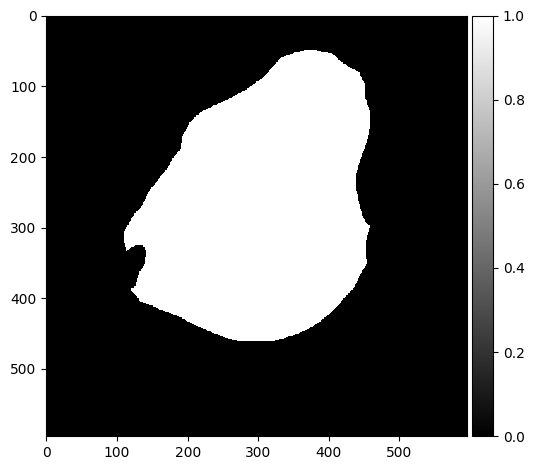

Threshold:  0.5
Bin count 257


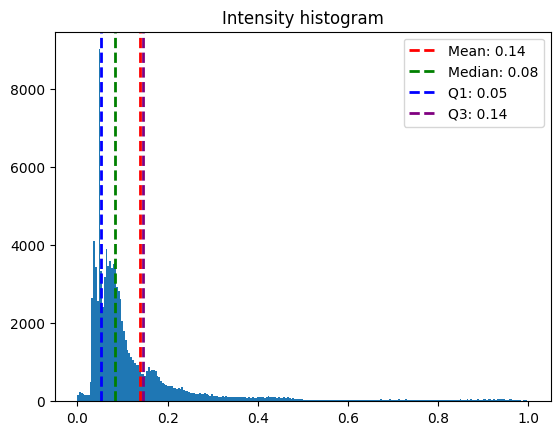

Inclusion Areas:  [  14.   45.   43.   14.   53.  112.   24.  136.   30.   62. 2293.   77.
   79.   32.   54. 1853.   71.]


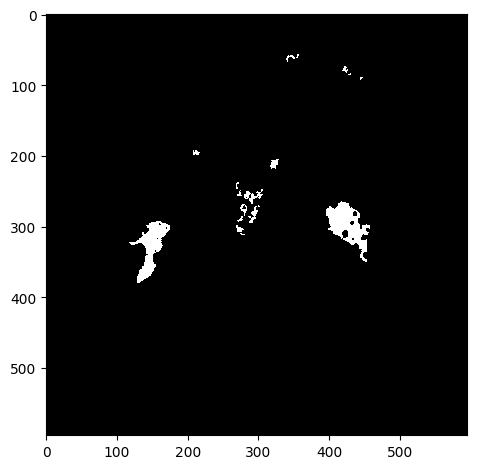

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_01.czi
Red Channel


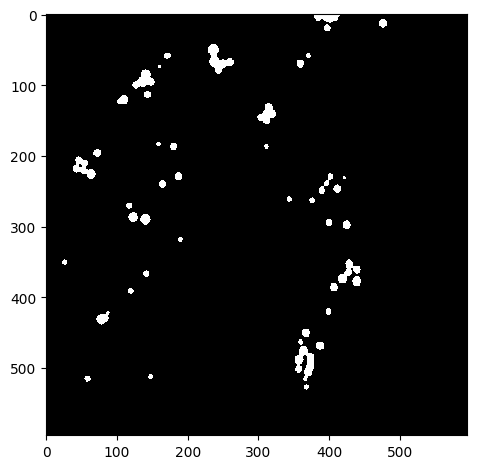

Green Channel


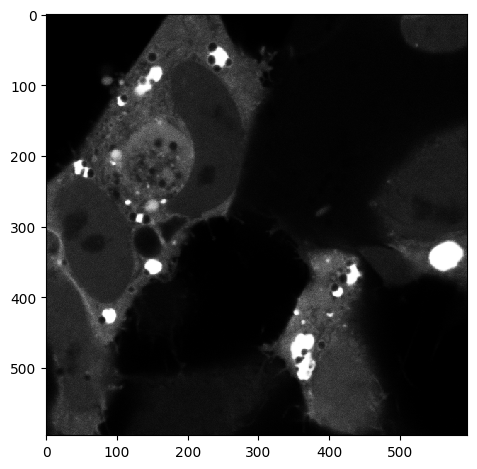

Segmented Cells


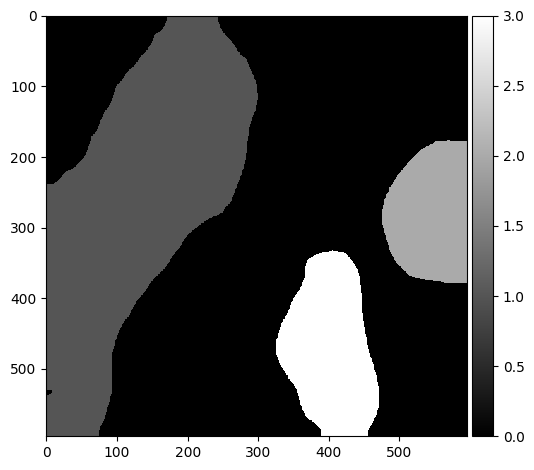

Threshold:  0.5
Bin count 212


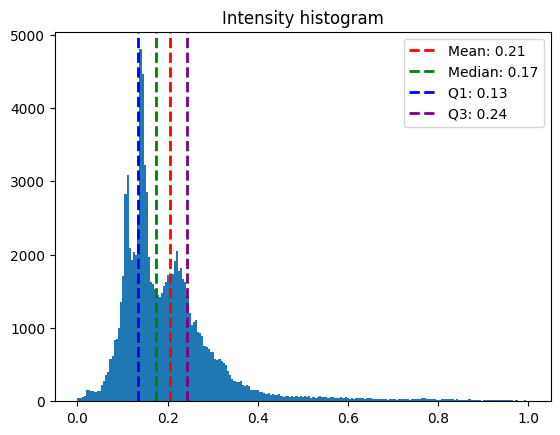

Inclusion Areas:  [481. 769. 111.  22. 263. 294.  11.  45.  52. 194. 110. 423.  36. 352.]


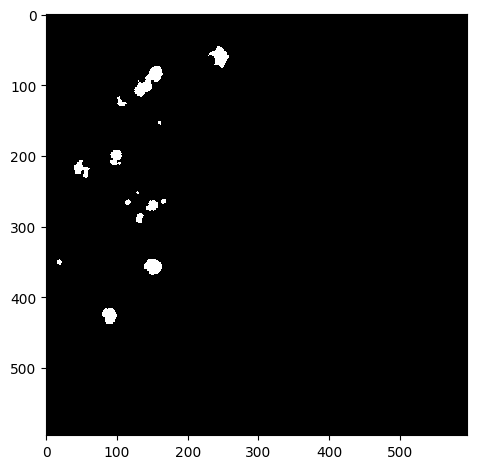

Threshold:  0.5
Bin count 295


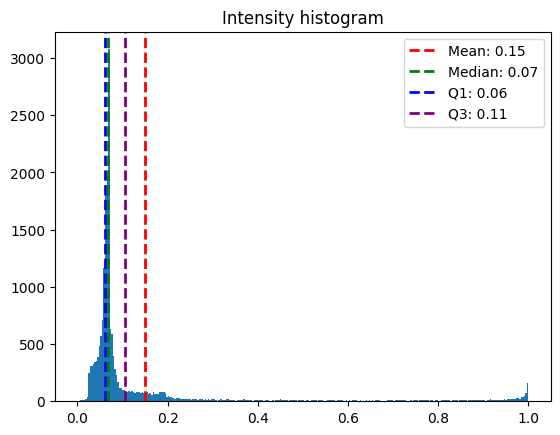

Inclusion Areas:  [1593.]


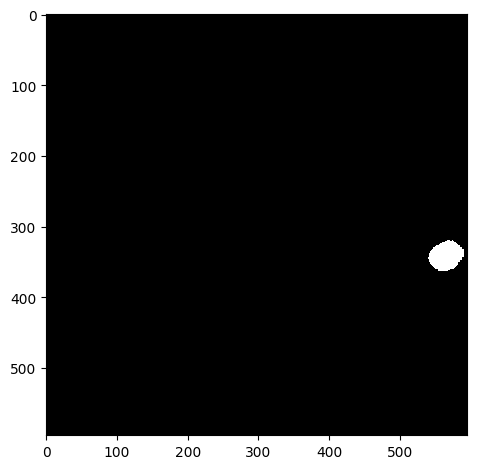

Threshold:  0.5
Bin count 114


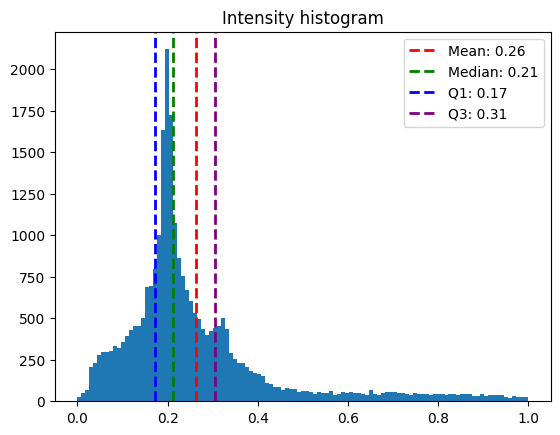

Inclusion Areas:  [  30.  400.  147.   71.   47.   34. 1586.]


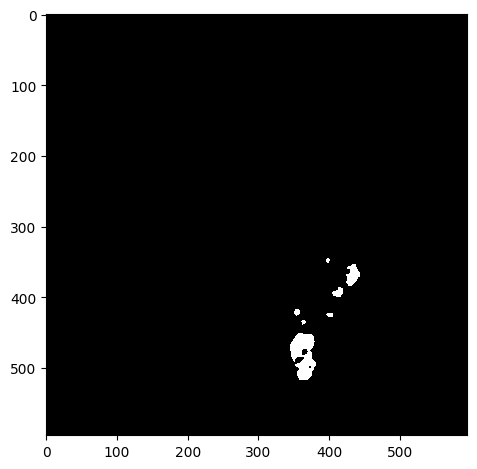

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_02.czi
Red Channel


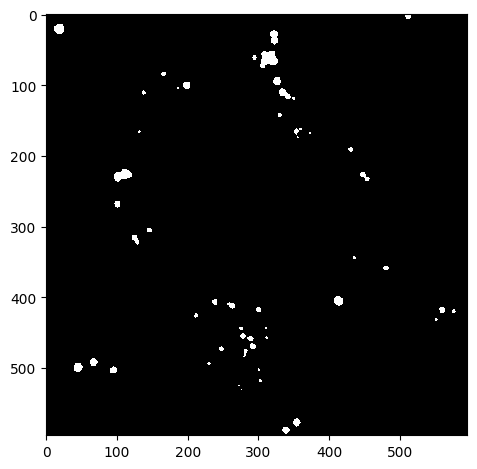

Green Channel


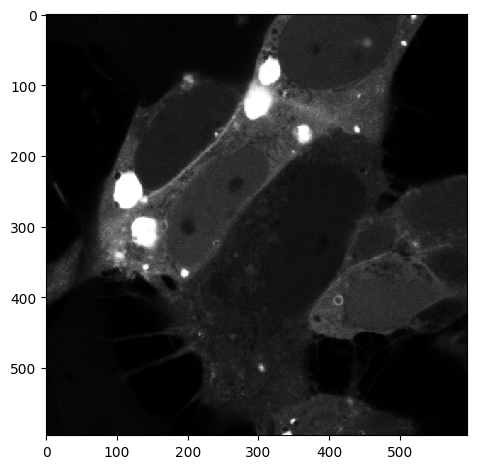

Segmented Cells


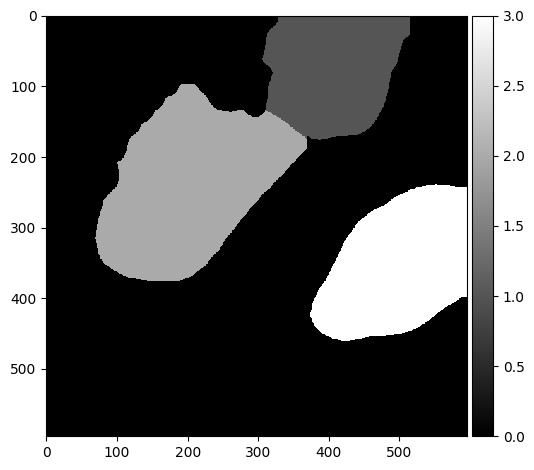

Threshold:  0.5
Bin count 115


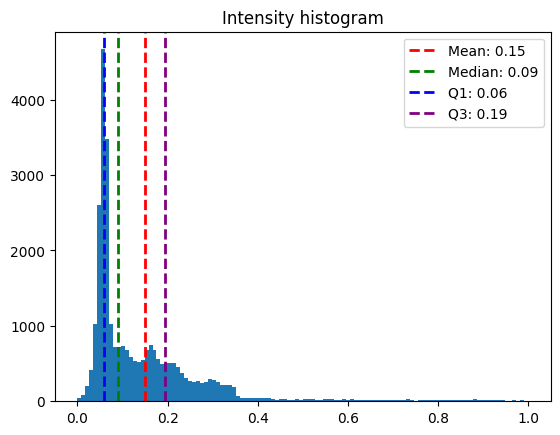

Inclusion Areas:  [778.  26.  17. 244.  70.]


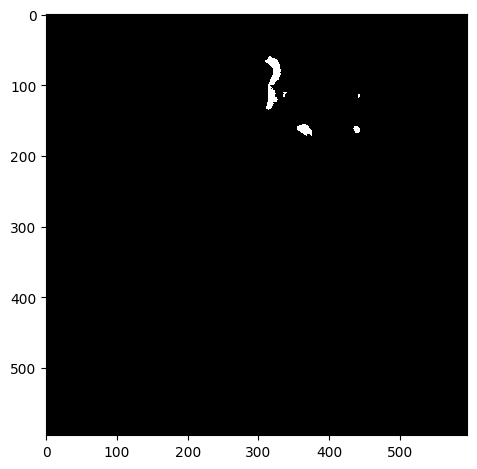

Threshold:  0.5
Bin count 125


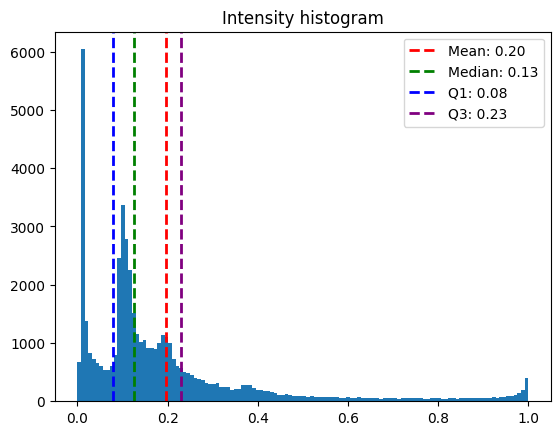

Inclusion Areas:  [ 251.   15.   17.  245.   19.   12. 1810.   25.   17. 1524.   31.   65.
   17.  287.   95.  122.]


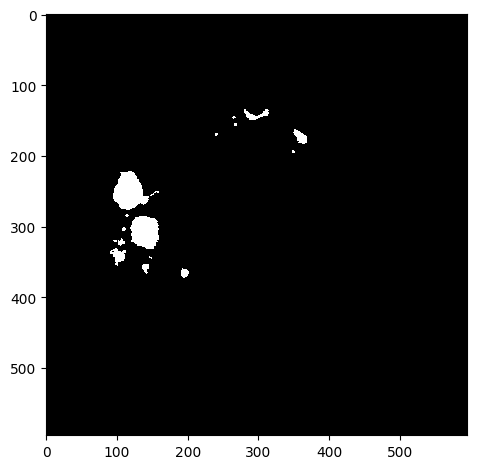

Threshold:  0.95
Bin count 76


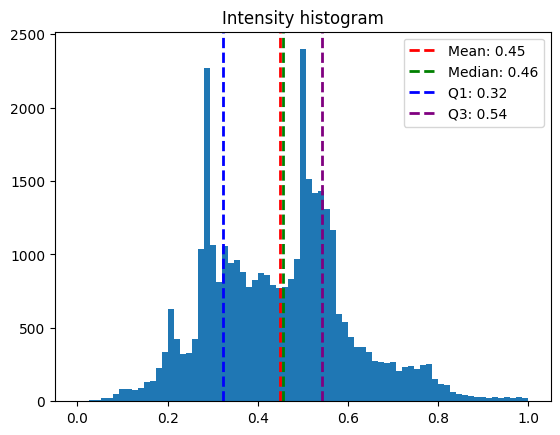

Inclusion Areas:  []


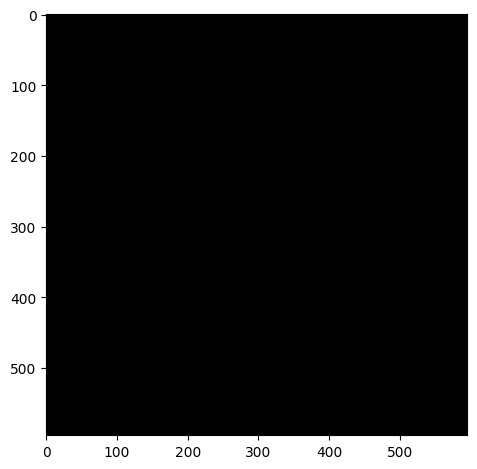

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_03.czi
Red Channel


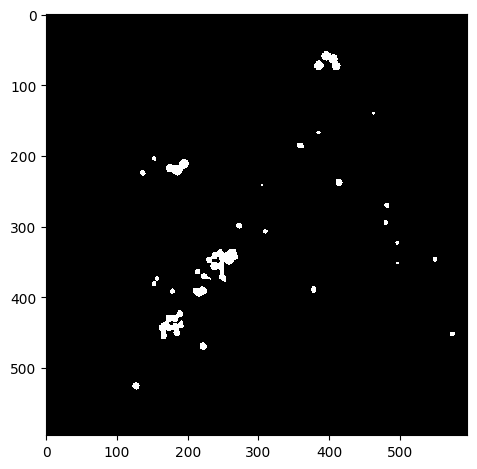

Green Channel


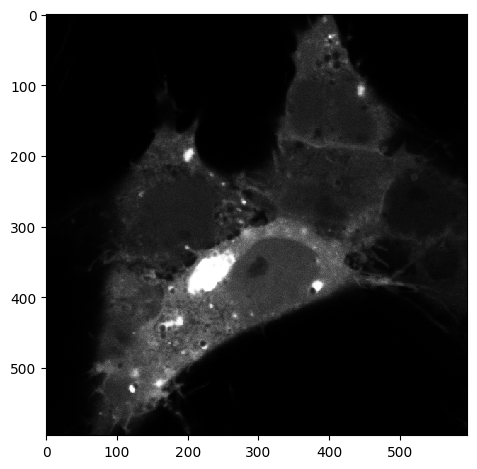

Segmented Cells


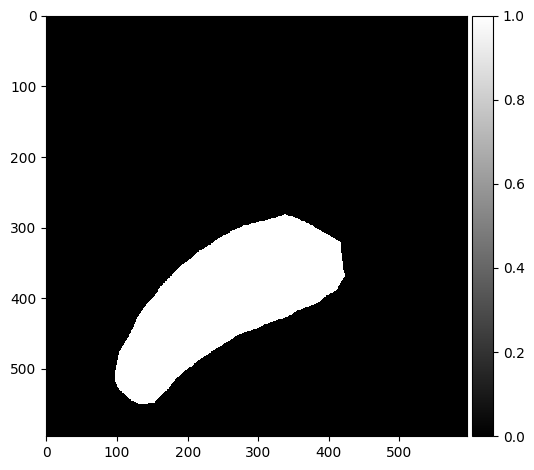

Threshold:  0.5
Bin count 114


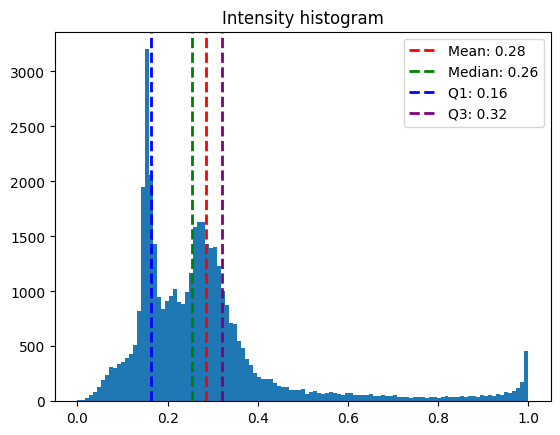

Inclusion Areas:  [  41.  184.   39.   13.   12.   17. 2910.  212.   39.   31.  396.   38.
   12.   32.   43.   27.   68.  356.   94.   75.]


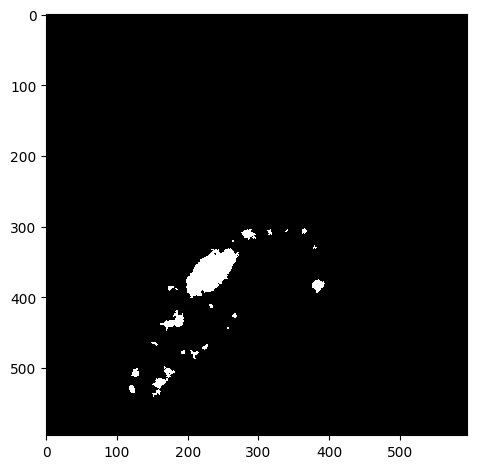

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_04.czi
Red Channel


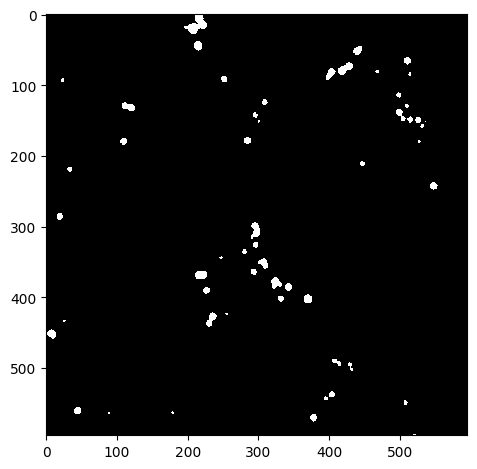

Green Channel


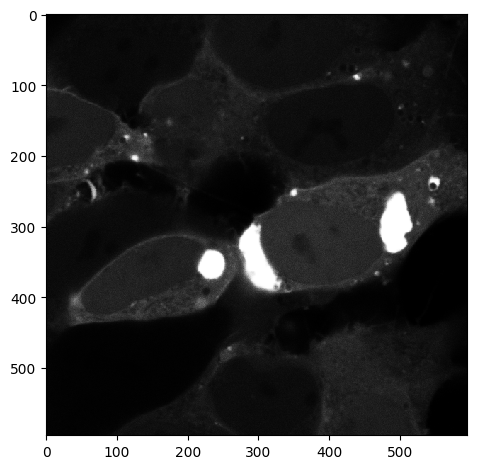

Segmented Cells


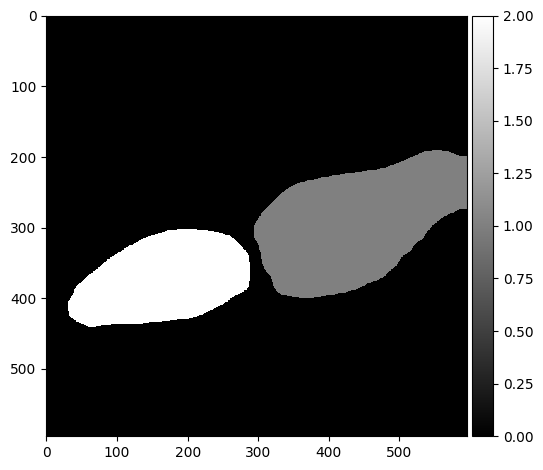

Threshold:  0.5
Bin count 363


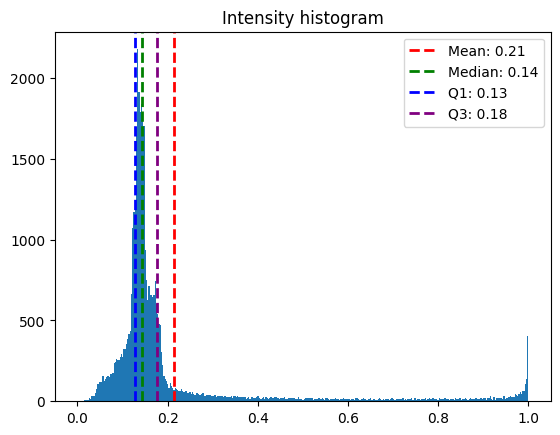

Inclusion Areas:  [ 149.   86. 2853.   27.  643.]


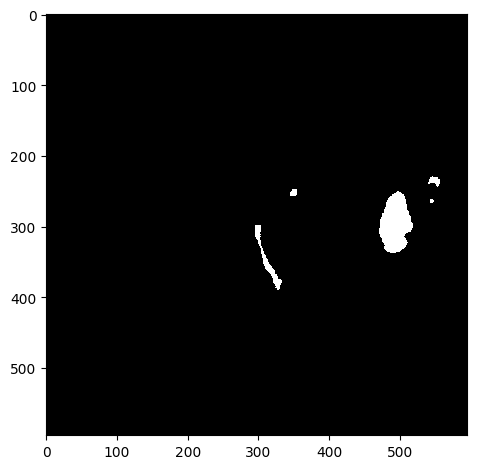

Threshold:  0.5
Bin count 236


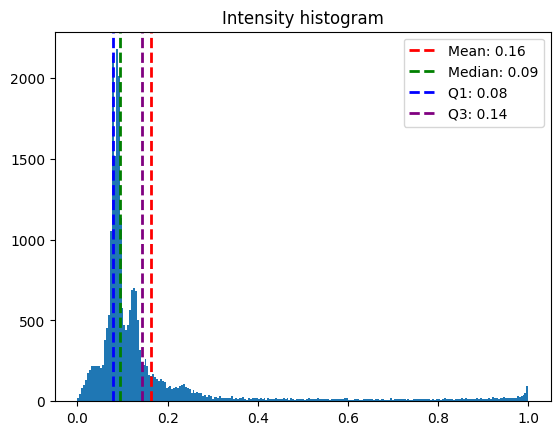

Inclusion Areas:  [ 429. 1290.]


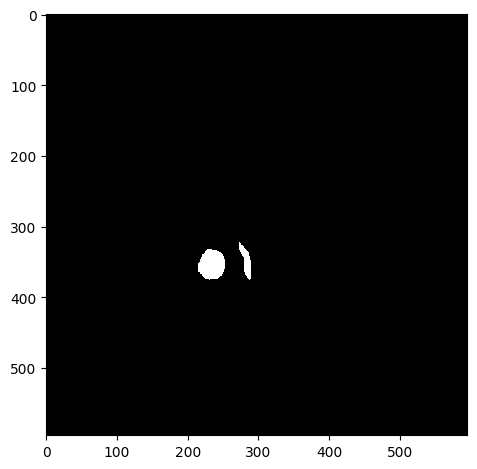

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_05.czi
Red Channel


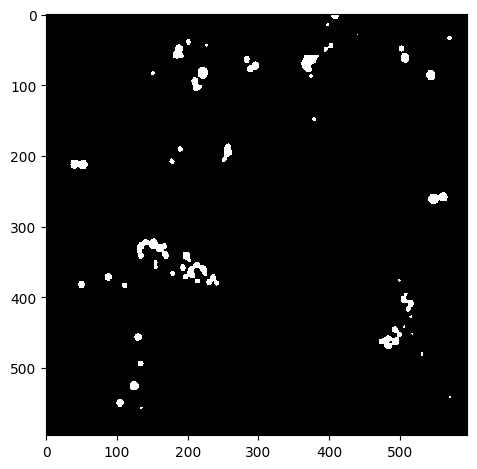

Green Channel


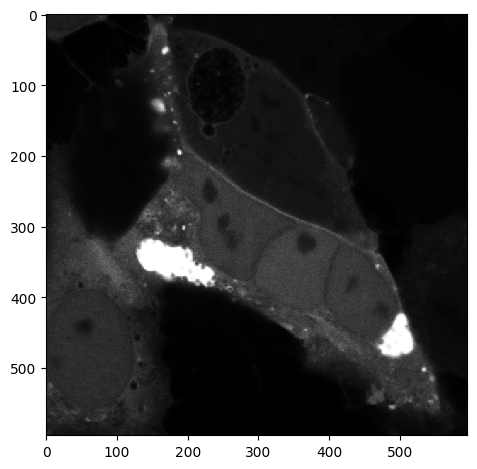

Segmented Cells


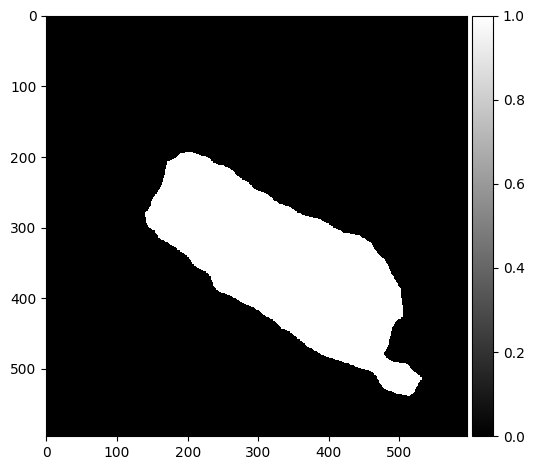

Threshold:  0.5
Bin count 425


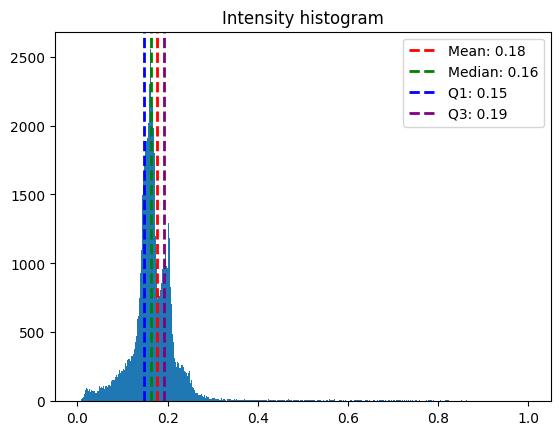

Inclusion Areas:  [ 18.  23. 187. 167.  19.  14.  14. 499.]


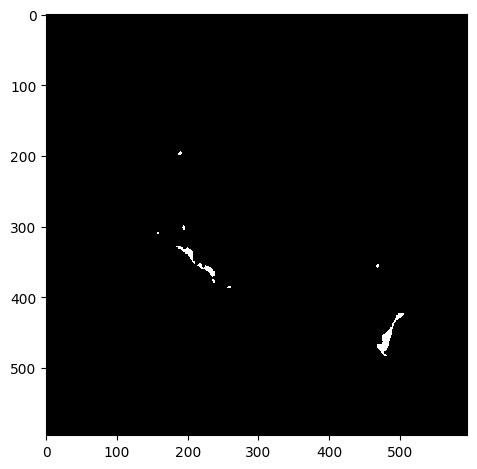

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_06.czi
Red Channel


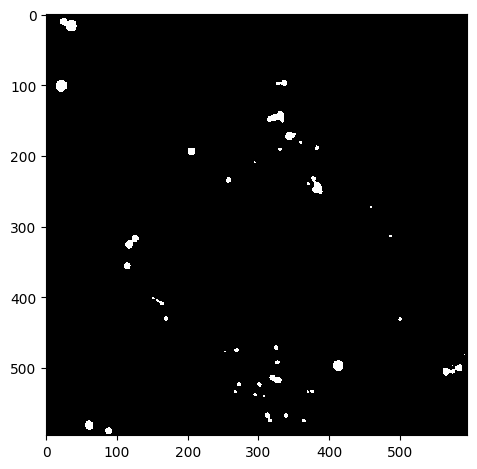

Green Channel


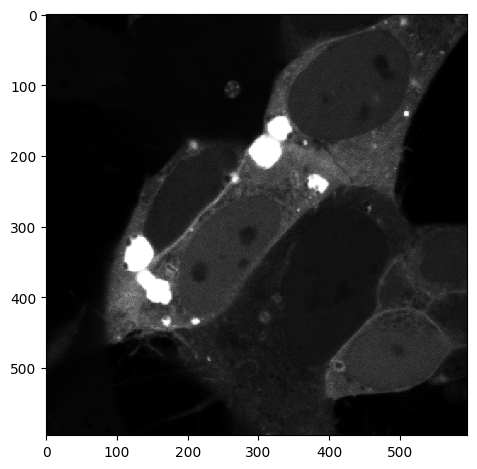

Segmented Cells


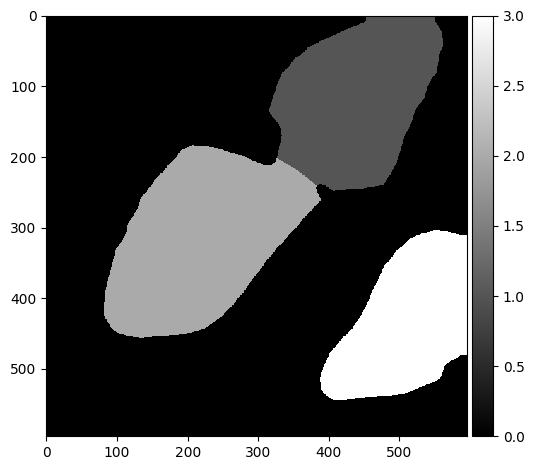

Threshold:  0.5
Bin count 160


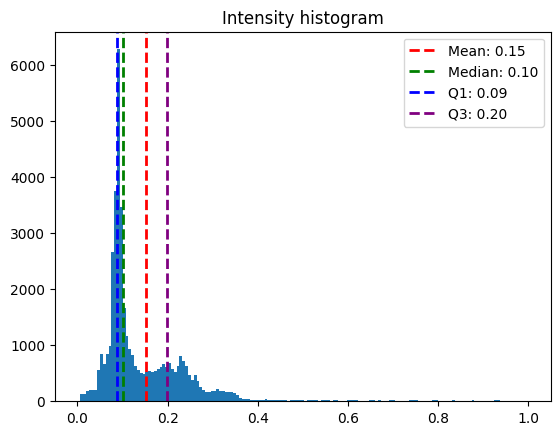

Inclusion Areas:  [ 24.  52. 602.  27. 248.]


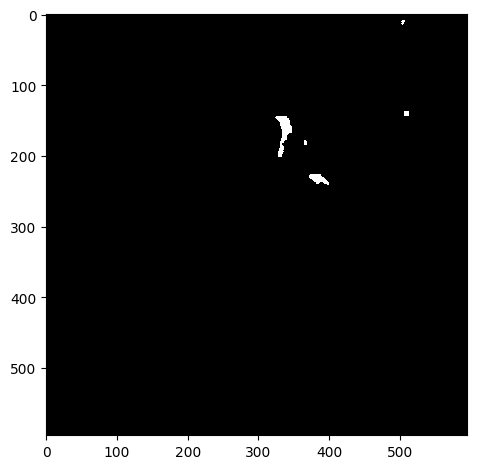

Threshold:  0.5
Bin count 141


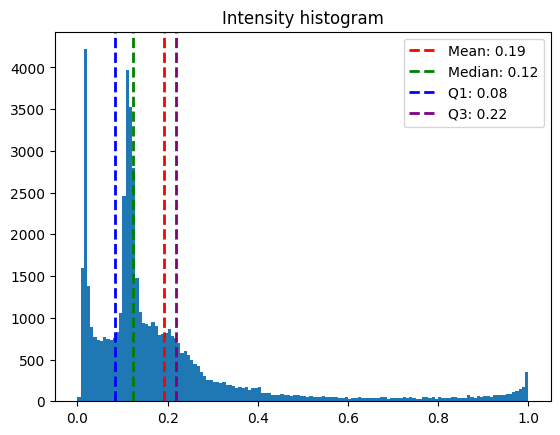

Inclusion Areas:  [  27.  253.  147.  172.   13.   21. 3348.   26.   12.  141.   95.]


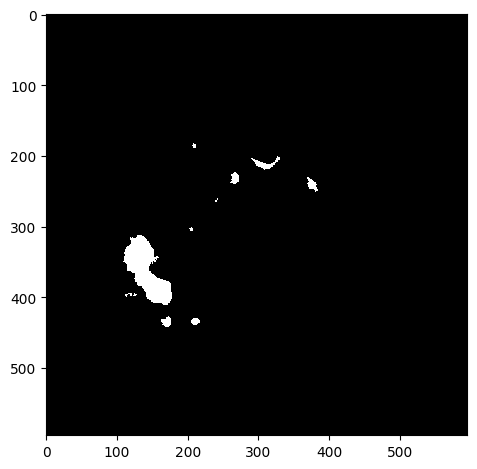

Threshold:  0.95
Bin count 54


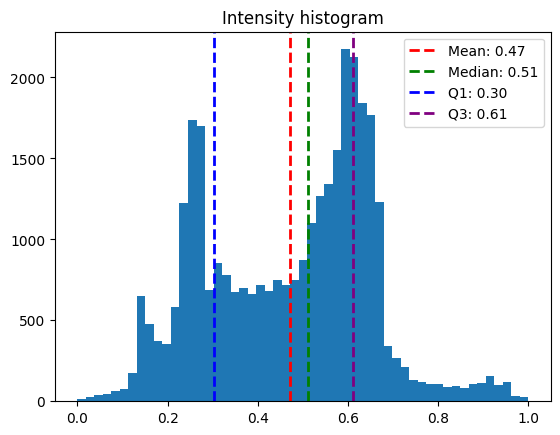

Inclusion Areas:  []


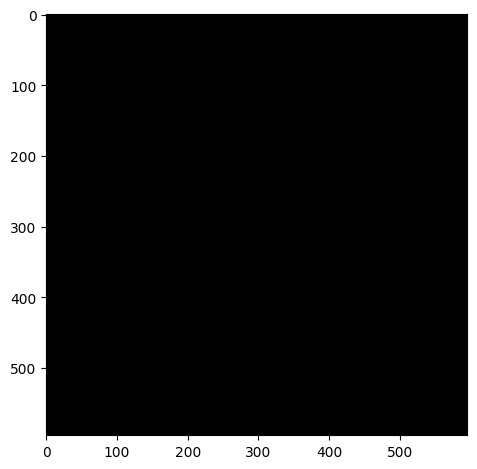

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_OA_LT_01.czi
Red Channel


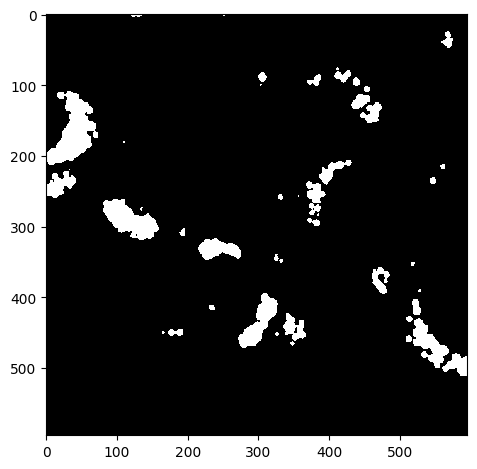

Green Channel


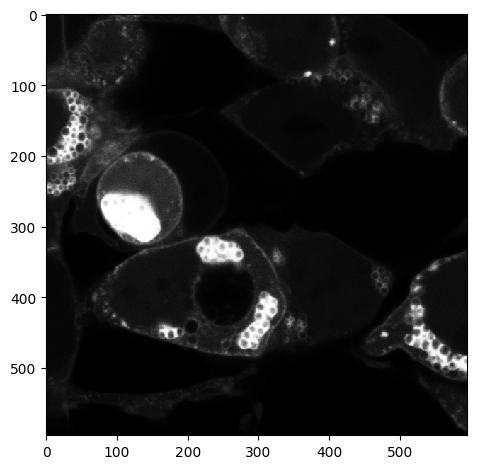

Segmented Cells


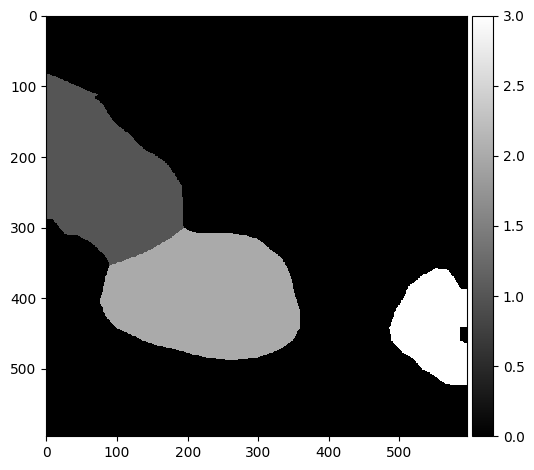

Threshold:  0.5
Bin count 70


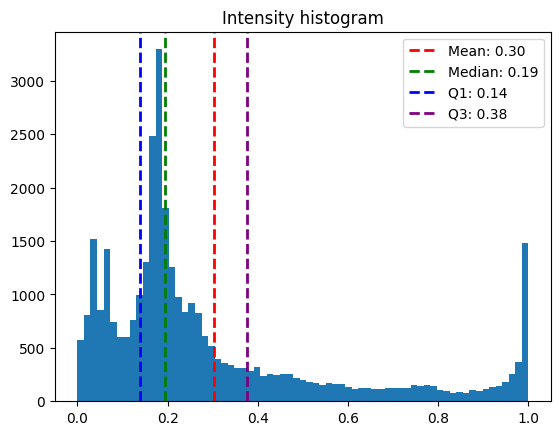

Inclusion Areas:  [1807.   21.   12.   60.  171. 4355.]


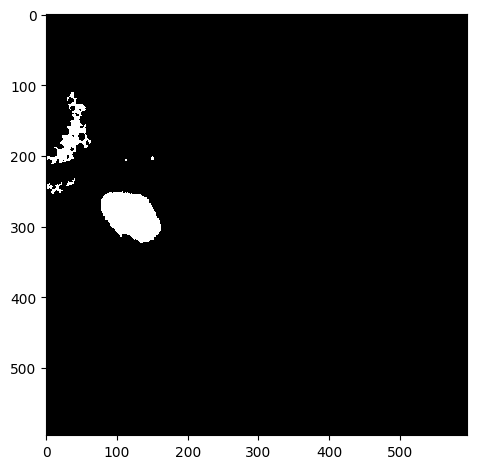

Threshold:  0.5
Bin count 157


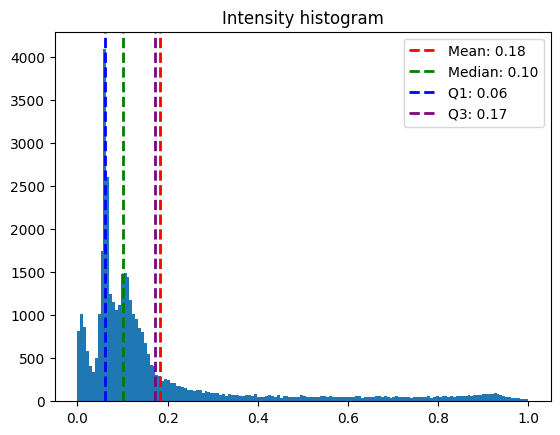

Inclusion Areas:  [1836. 2058.   18.   21.  311.]


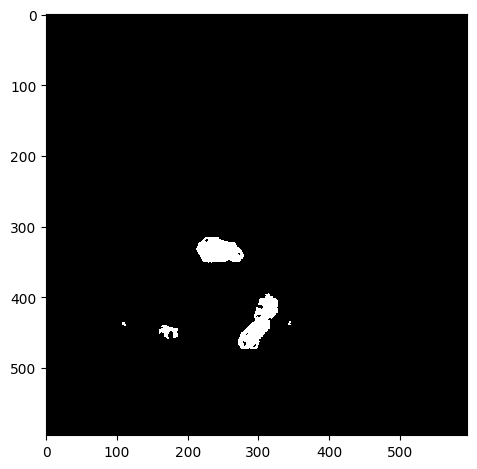

Threshold:  0.5
Bin count 36


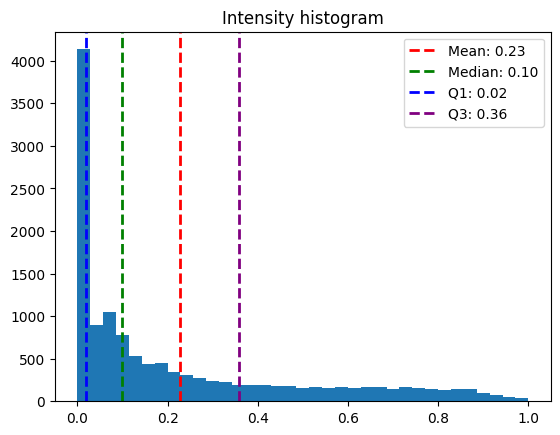

Inclusion Areas:  [  36.  282. 1774.]


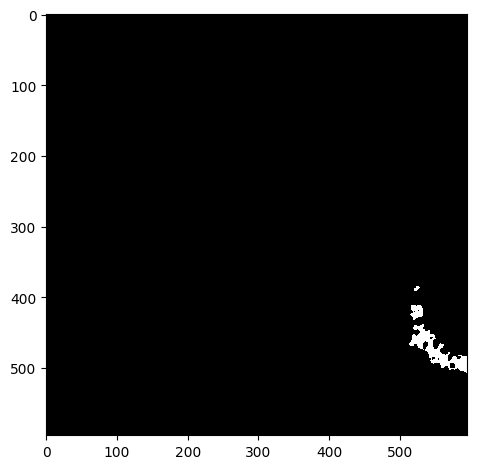

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_OA_LT_02.czi
Red Channel


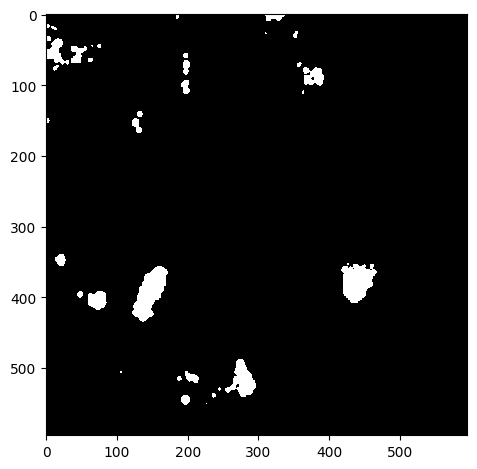

Green Channel


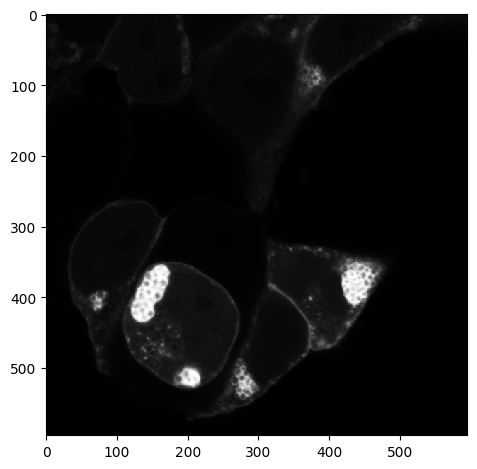

Segmented Cells


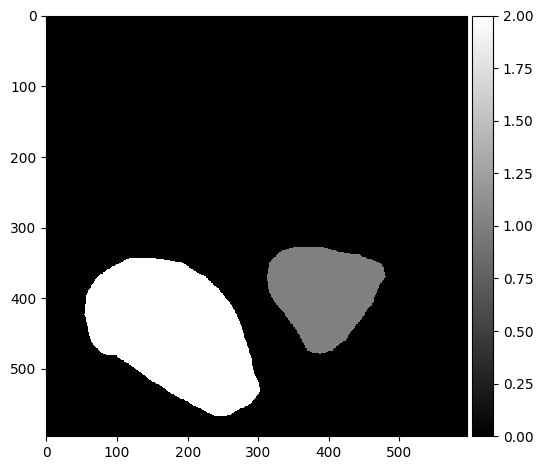

Threshold:  0.5
Bin count 115


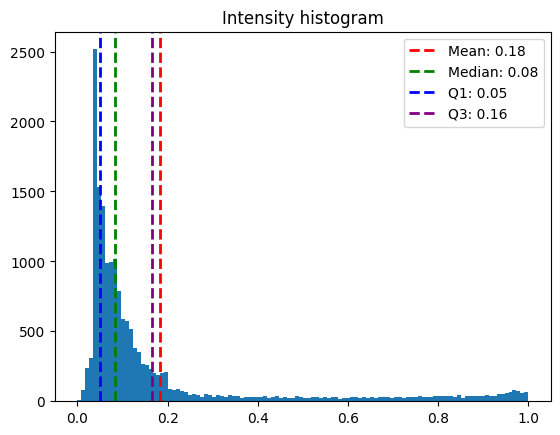

Inclusion Areas:  [2004.]


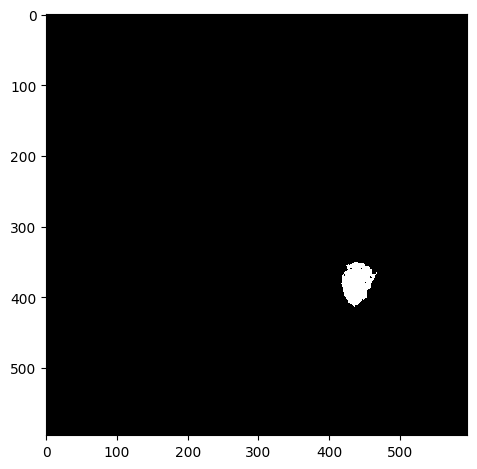

Threshold:  0.5
Bin count 187


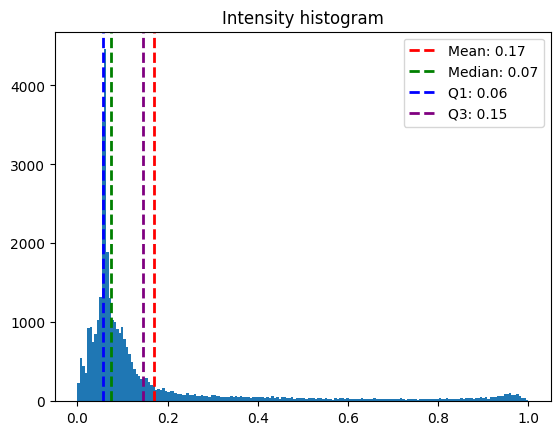

Inclusion Areas:  [2588.  105.  482.  631.]


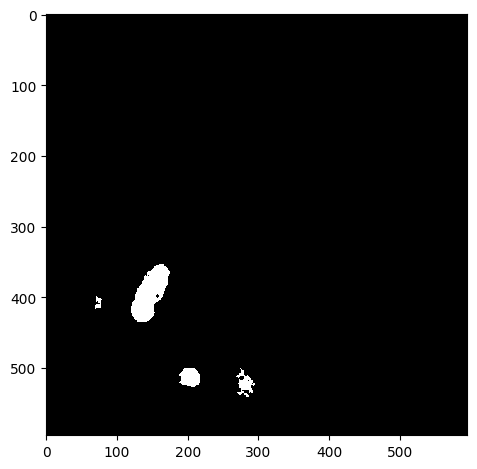

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_OA_LT_03.czi
Red Channel


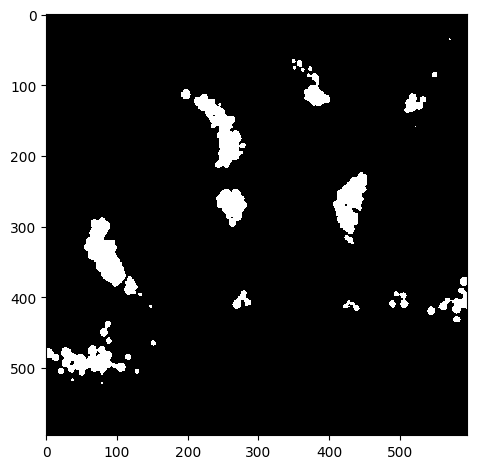

Green Channel


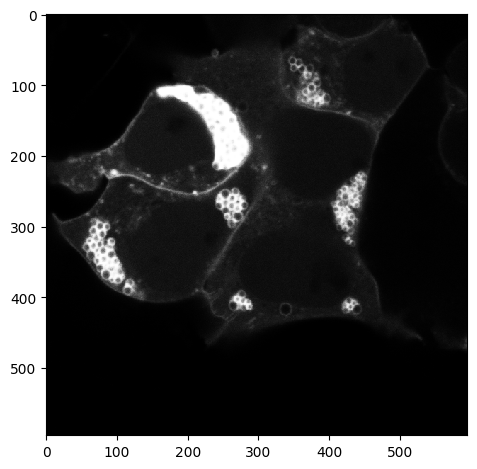

Segmented Cells


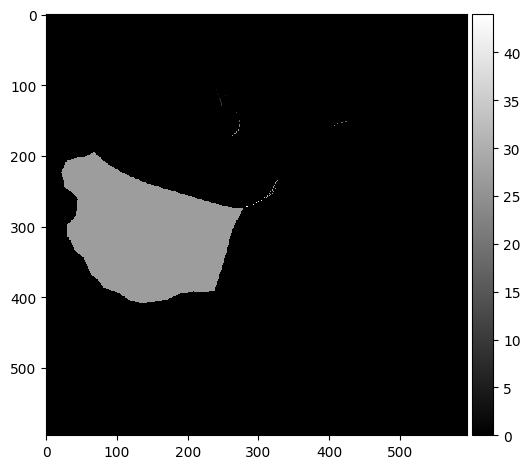

Threshold:  0.5
Bin count 150


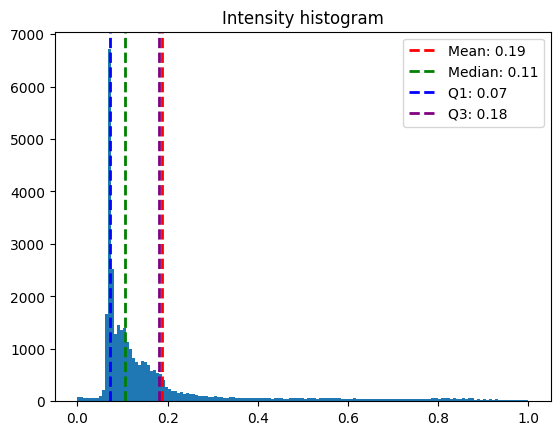

Inclusion Areas:  [  18.  157.  378. 2441.  157.]


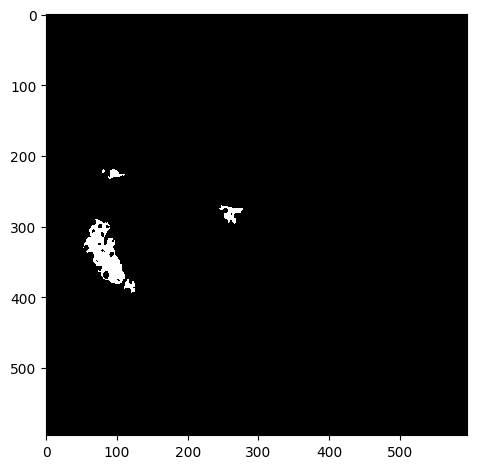

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_OA_LT_04.czi
Red Channel


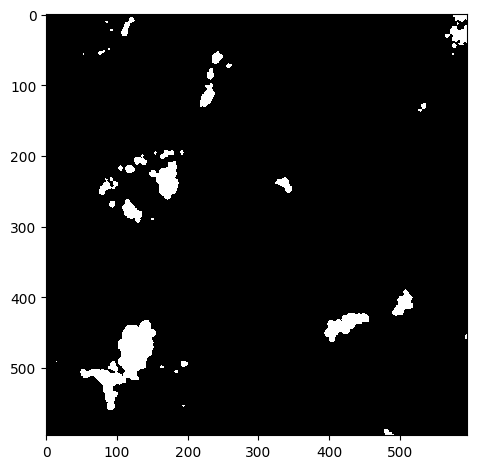

Green Channel


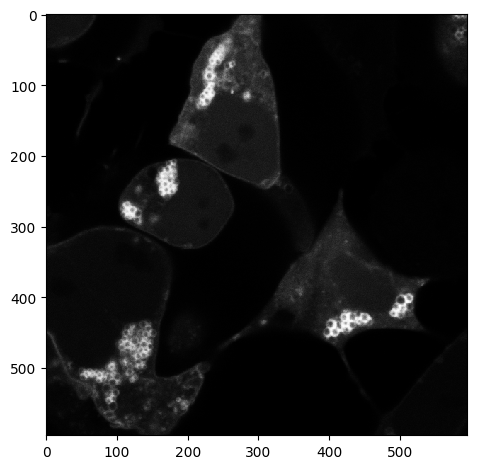

Segmented Cells


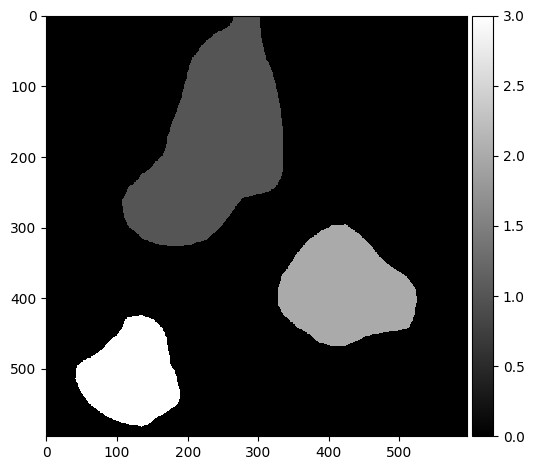

Threshold:  0.5
Bin count 136


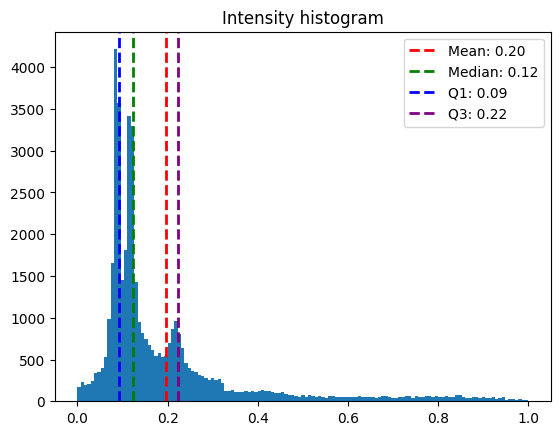

Inclusion Areas:  [  32. 1393.   37.   13.   65.  916.  398.]


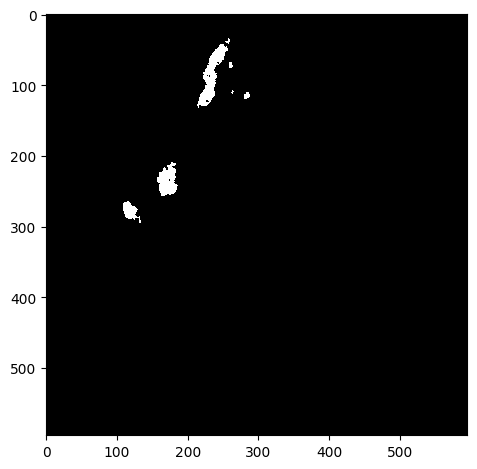

Threshold:  0.5
Bin count 192


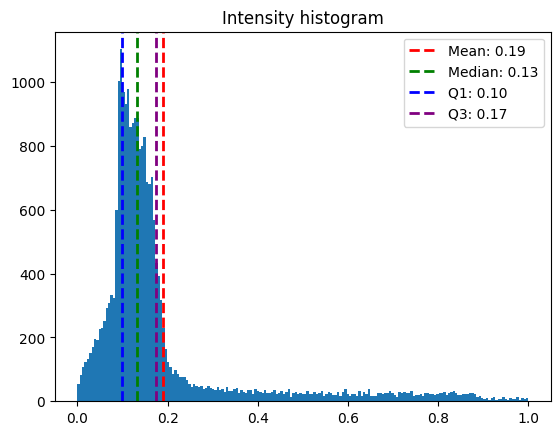

Inclusion Areas:  [ 507. 1124.]


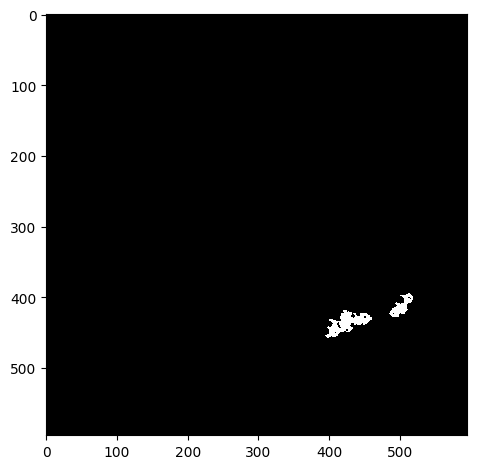

Threshold:  0.5
Bin count 38


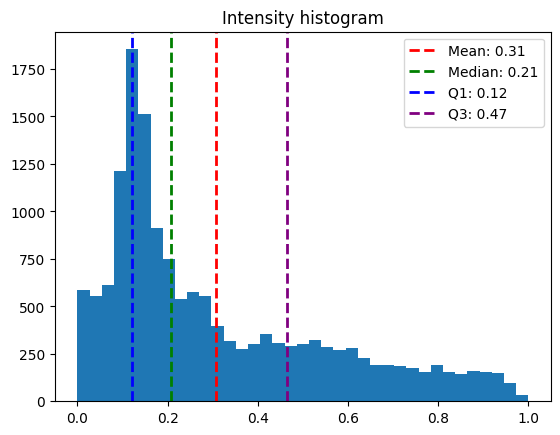

Inclusion Areas:  [ 38.  37. 664.  27.  61. 505.  17.  16.  67.]


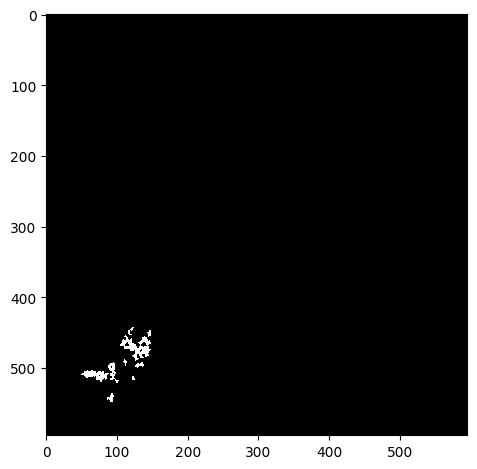

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_OA_LT_05.czi
Red Channel


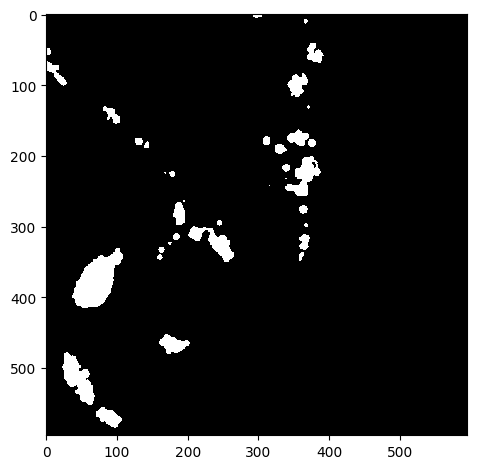

Green Channel


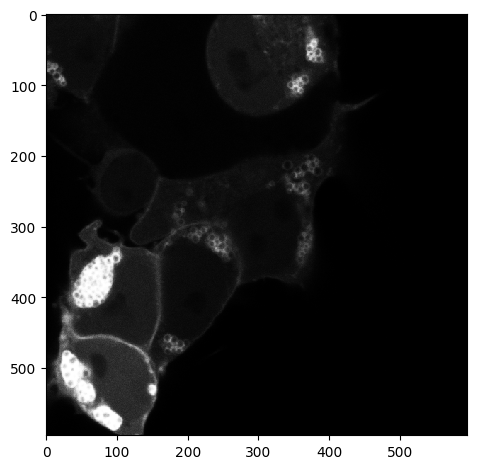

Segmented Cells


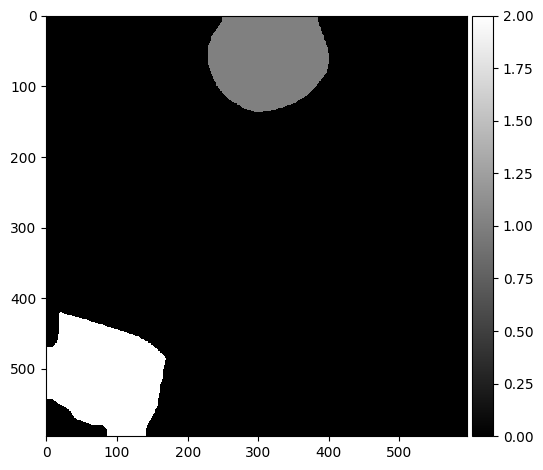

Threshold:  0.5
Bin count 189


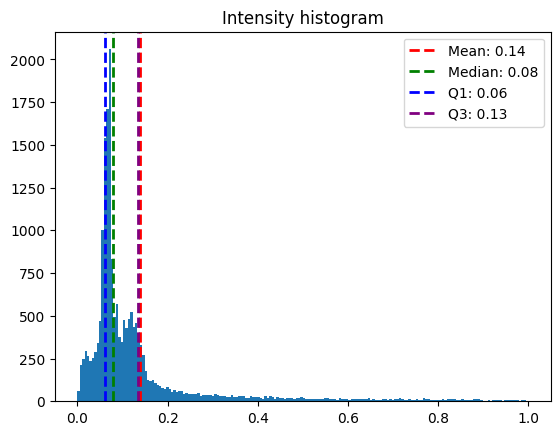

Inclusion Areas:  [355. 197.]


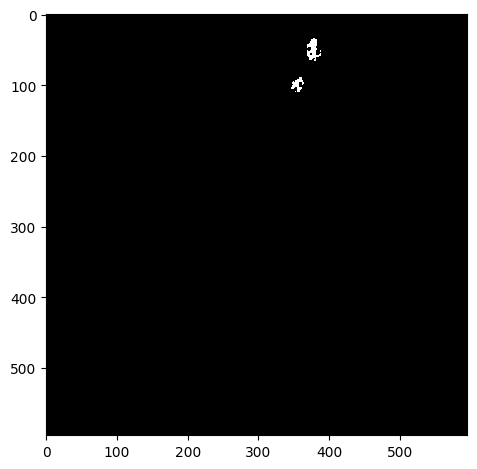

Threshold:  0.5
Bin count 75


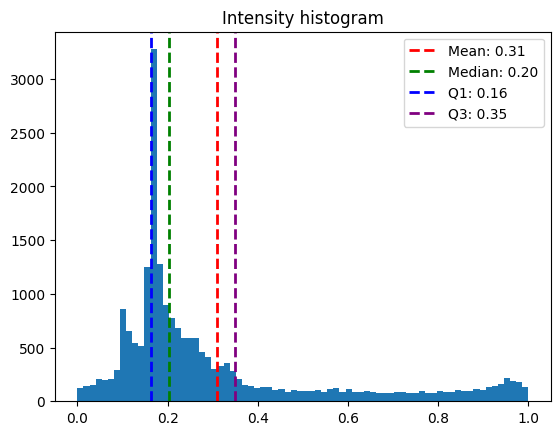

Inclusion Areas:  [  92.   32.   41.   68. 3490.   31.   15.  169.]


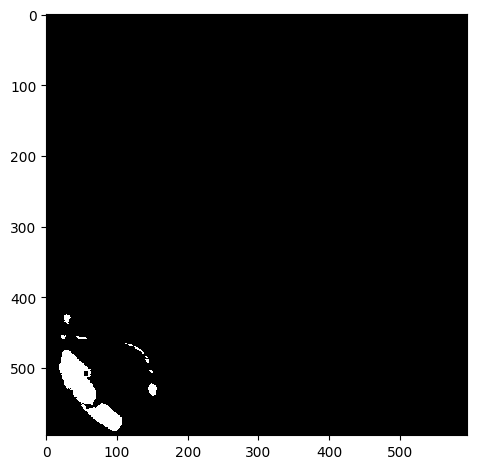

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_OA_LT_06.czi
Red Channel


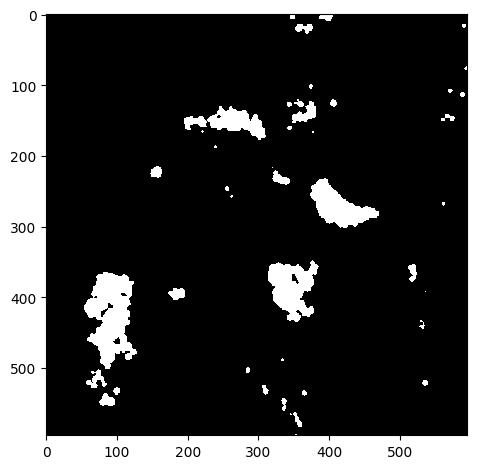

Green Channel


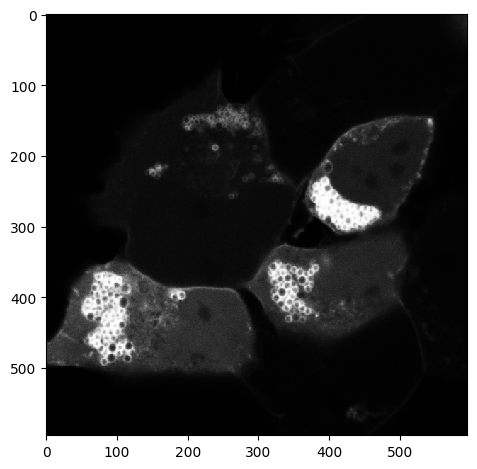

Segmented Cells


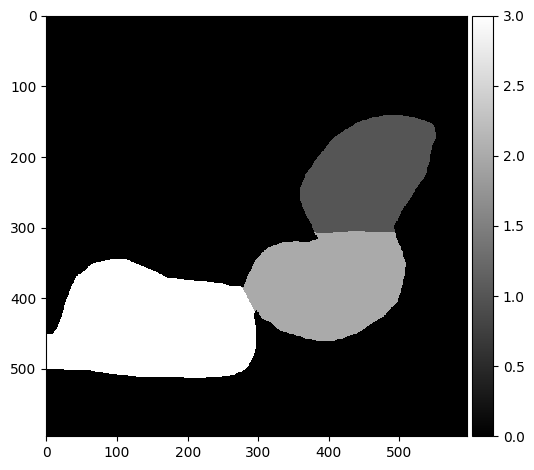

Threshold:  0.5
Bin count 124


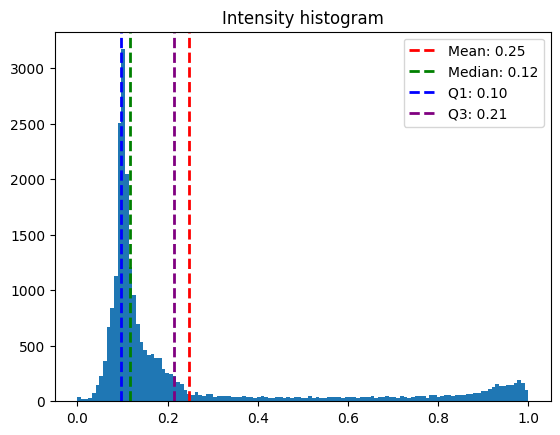

Inclusion Areas:  [  23. 3787.]


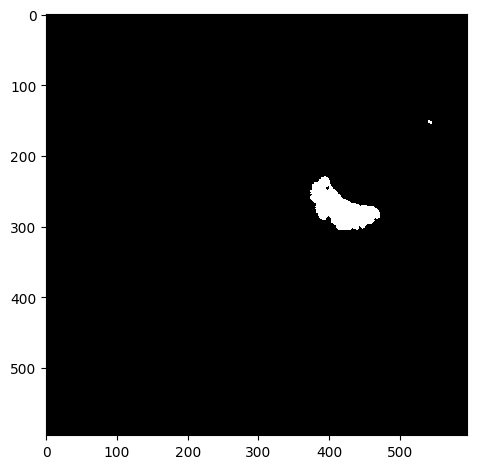

Threshold:  0.5
Bin count 138


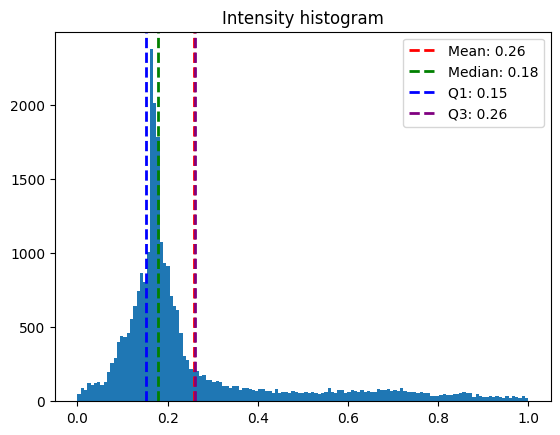

Inclusion Areas:  [  14. 2529.   13.   32.]


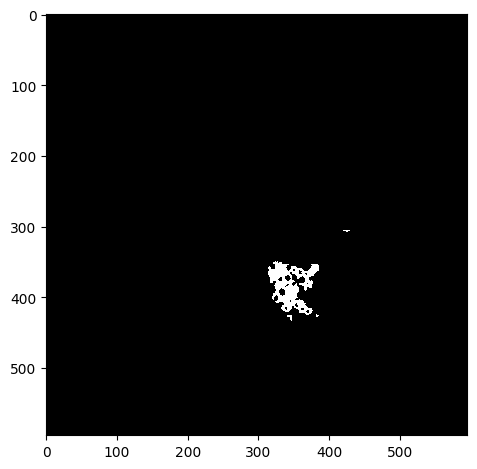

Threshold:  0.5
Bin count 109


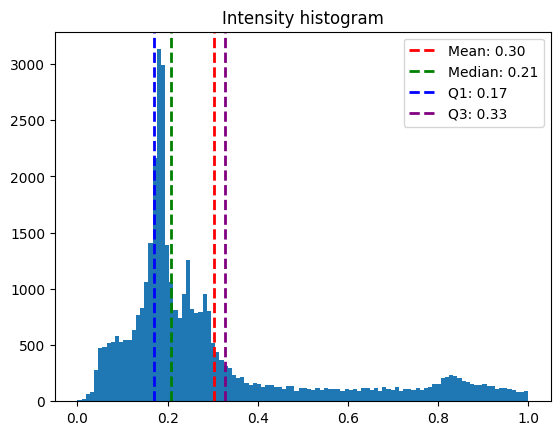

Inclusion Areas:  [5636.  284.]


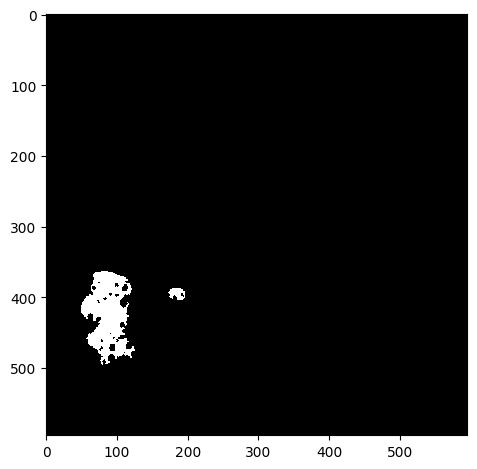

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_01.czi
Red Channel


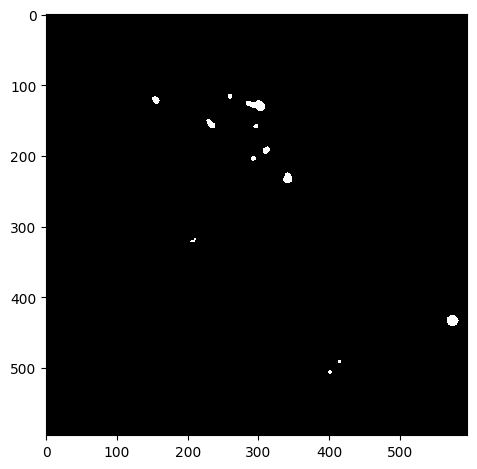

Green Channel


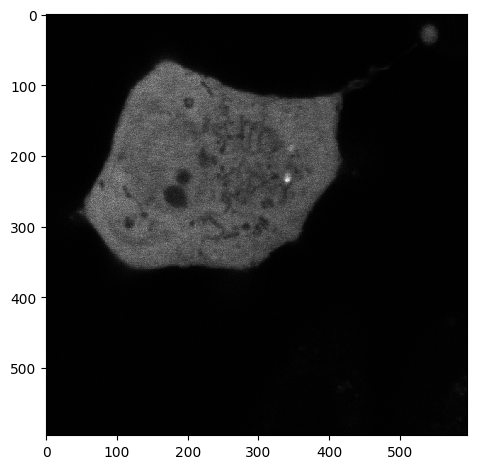

Segmented Cells


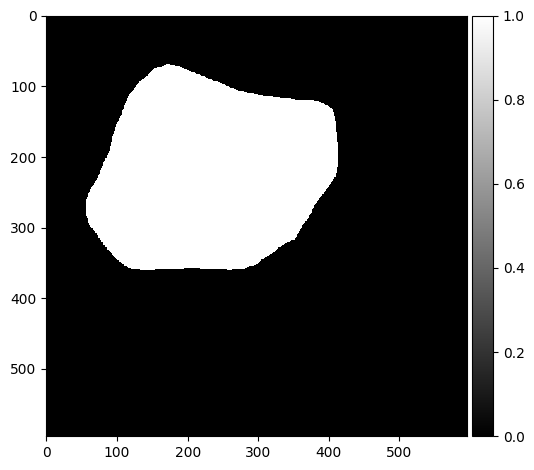

Threshold:  0.95
Bin count 111


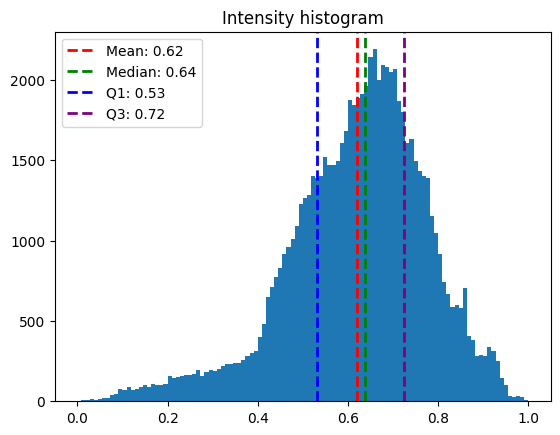

Inclusion Areas:  []


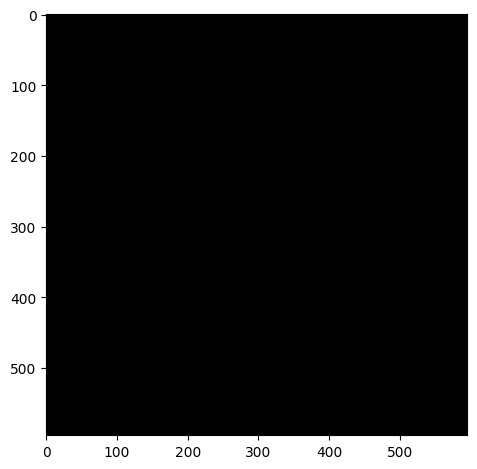

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_02.czi
Red Channel


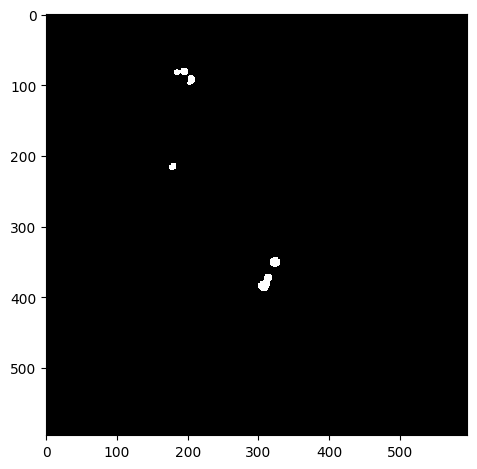

Green Channel


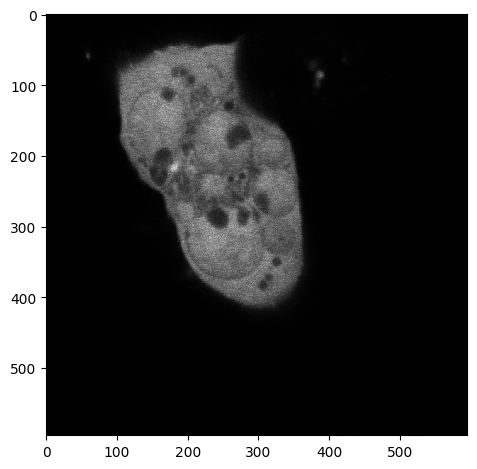

Segmented Cells


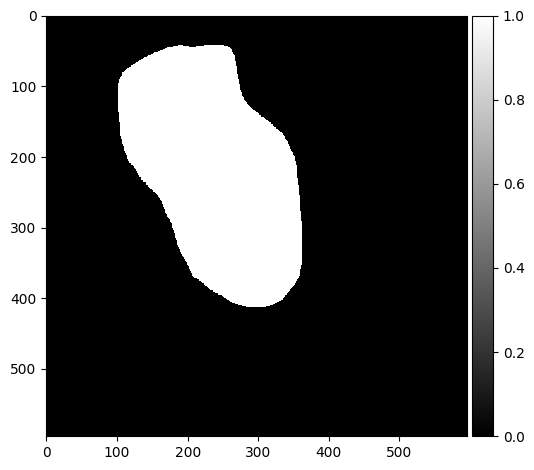

Threshold:  0.95
Bin count 79


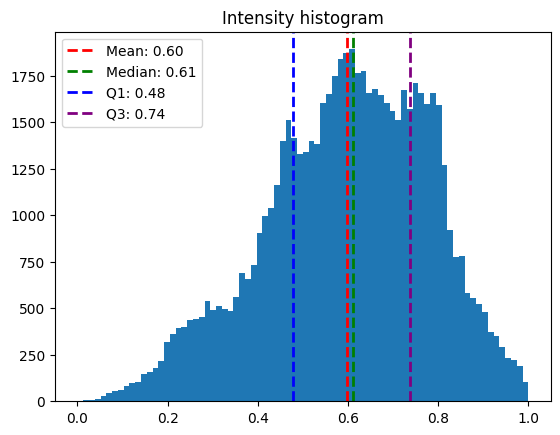

Inclusion Areas:  []


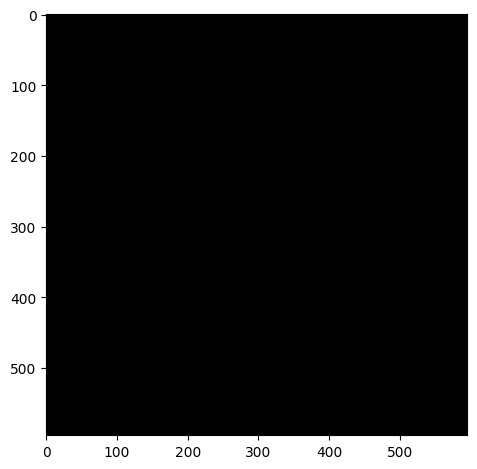

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_03.czi
Red Channel


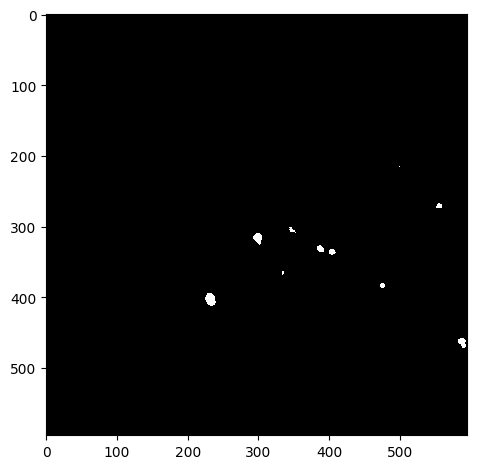

Green Channel


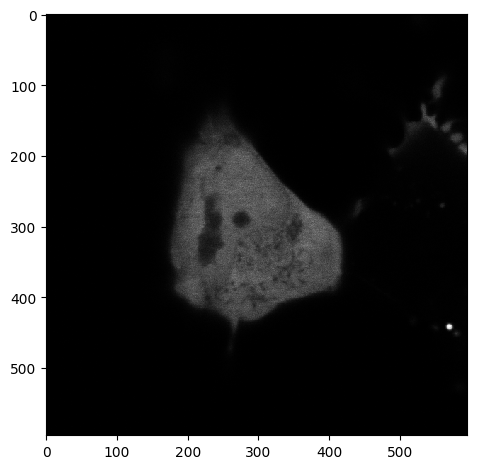

Segmented Cells


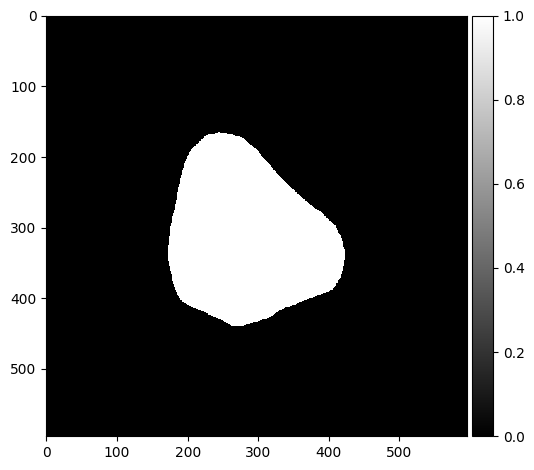

Threshold:  0.95
Bin count 73


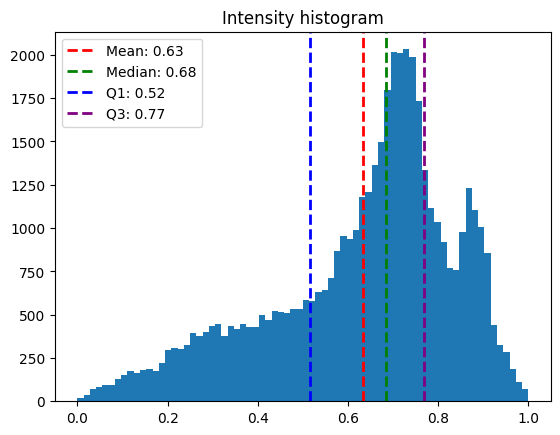

Inclusion Areas:  []


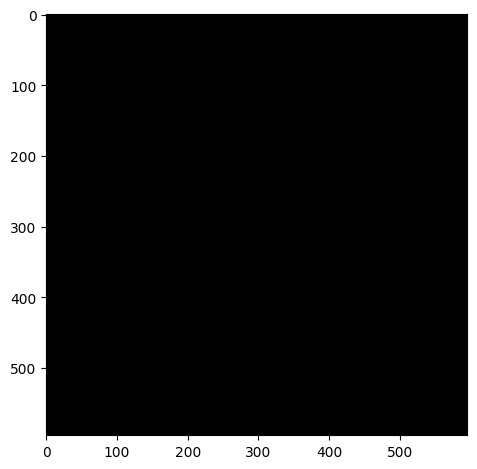

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_04.czi
Red Channel


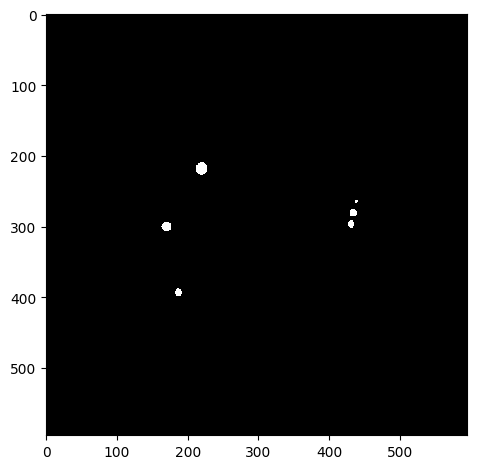

Green Channel


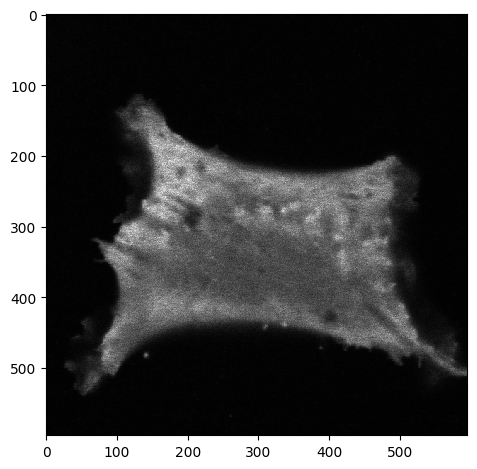

Segmented Cells


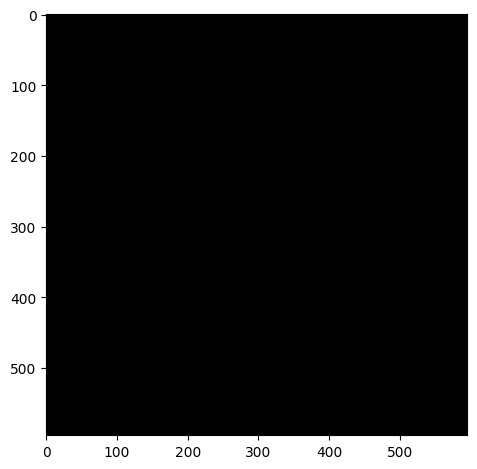

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_05.czi
Red Channel


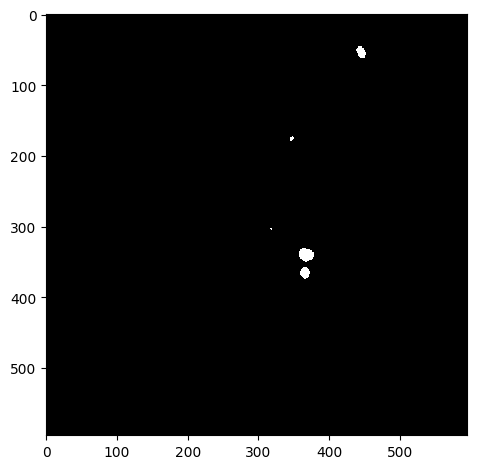

Green Channel


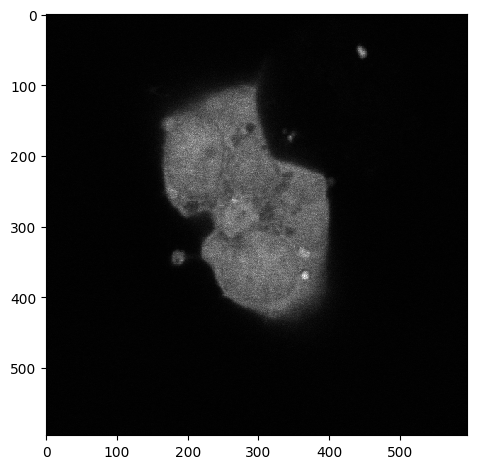

Segmented Cells


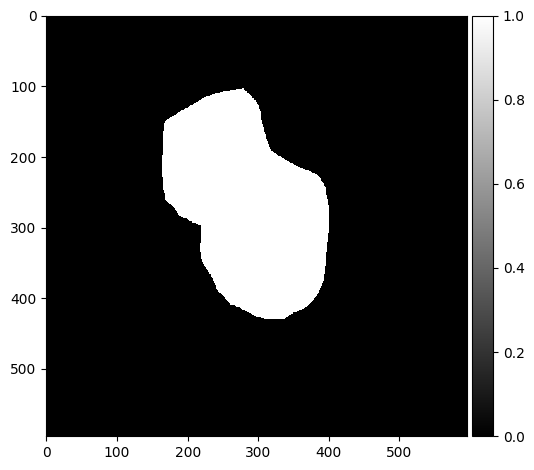

Threshold:  0.95
Bin count 111


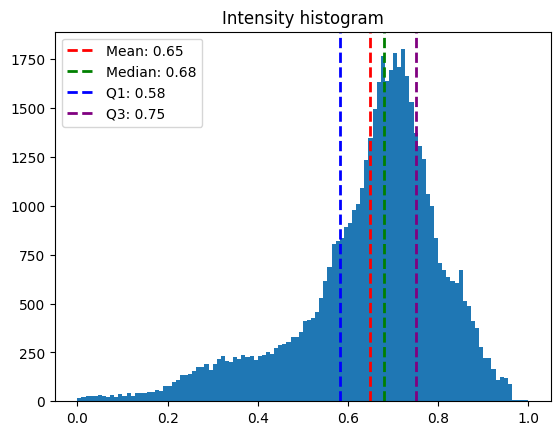

Inclusion Areas:  []


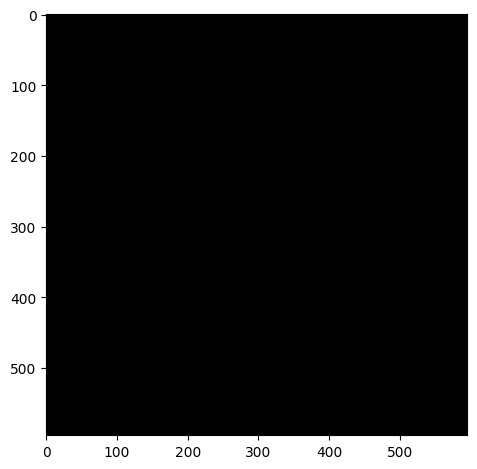

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_06.czi
Red Channel


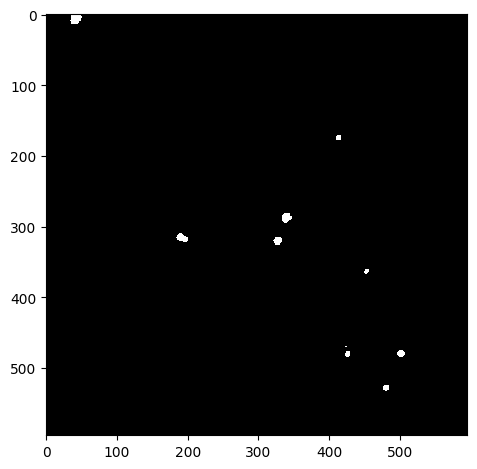

Green Channel


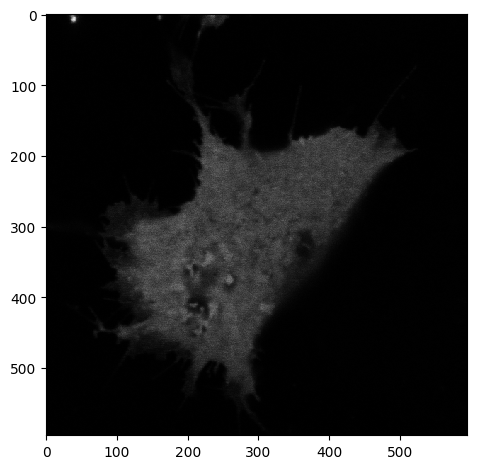

Segmented Cells


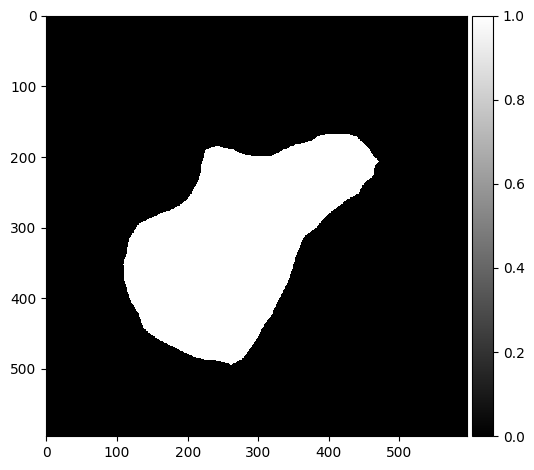

Threshold:  0.95
Bin count 139


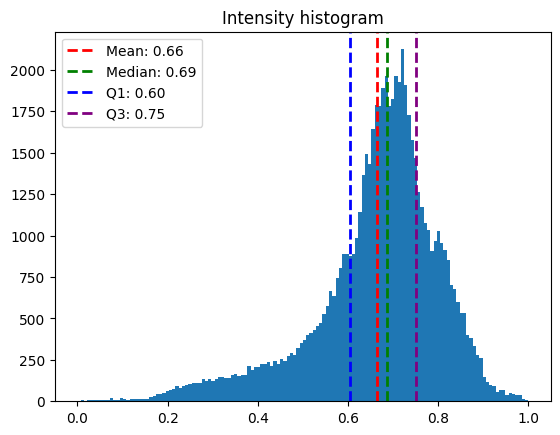

Inclusion Areas:  []


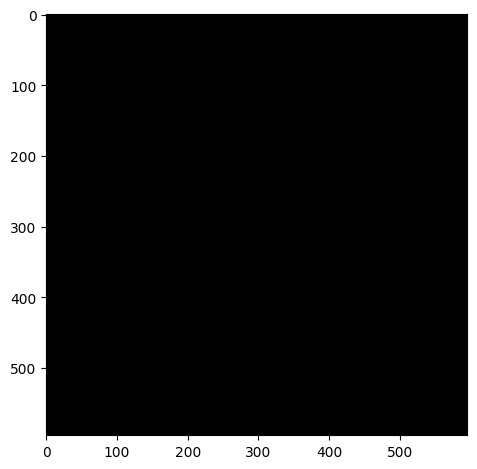

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_01.czi
Red Channel


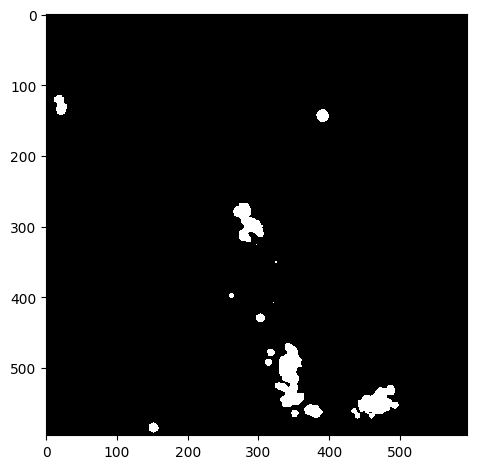

Green Channel


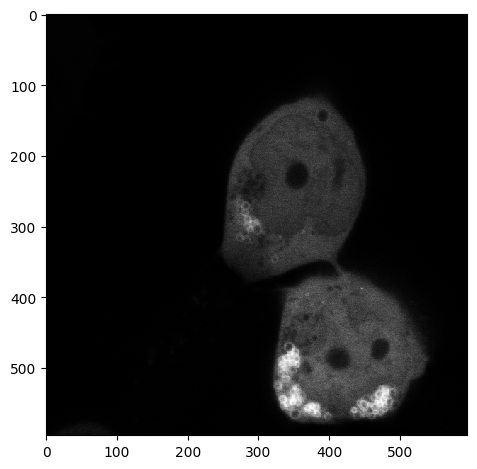

Segmented Cells


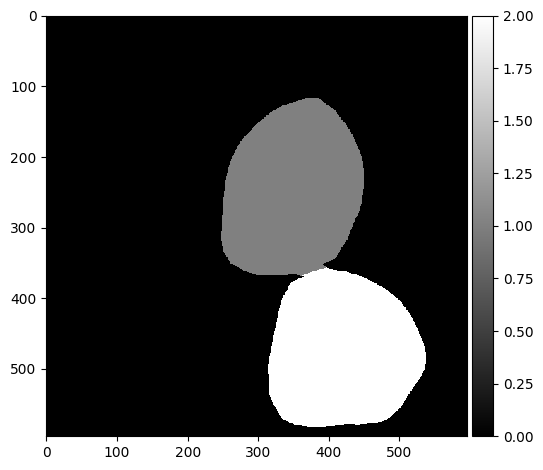

Threshold:  0.5
Bin count 141


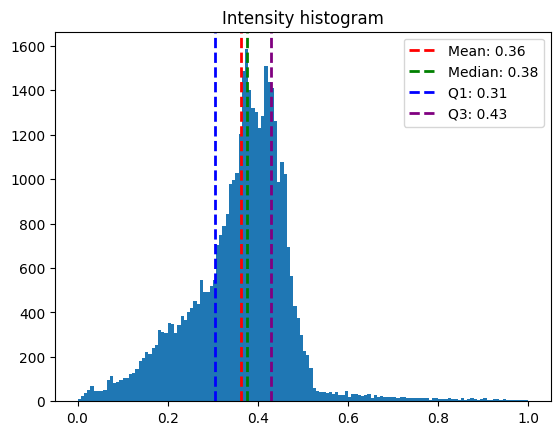

Inclusion Areas:  [58. 12.]


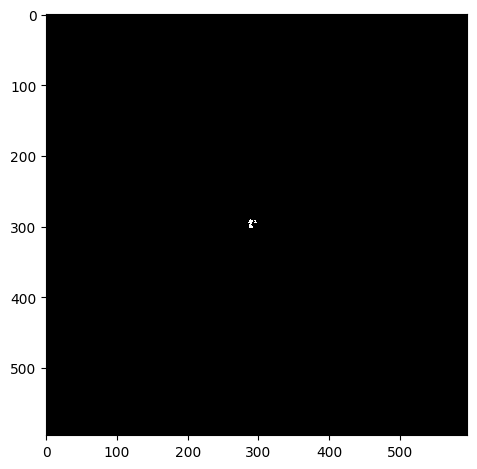

Threshold:  0.5
Bin count 158


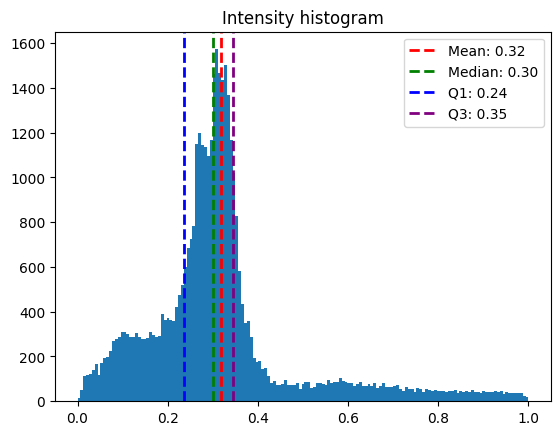

Inclusion Areas:  [1077.  858. 1105.  442.   66.]


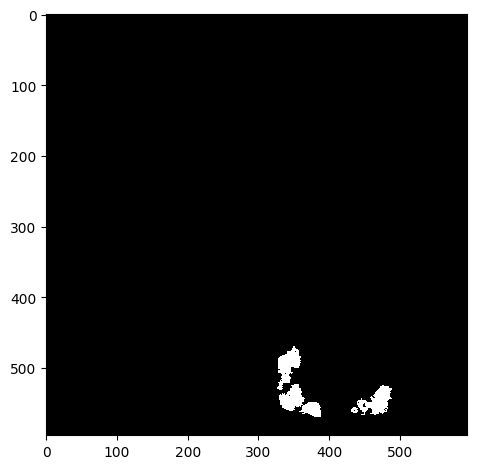

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_02.czi
Red Channel


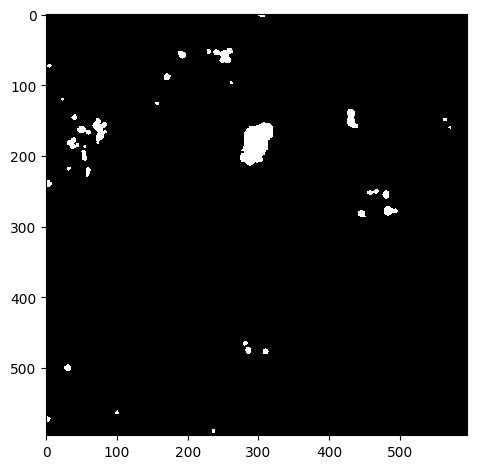

Green Channel


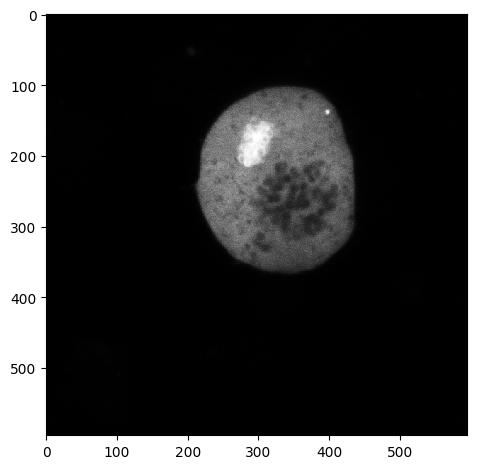

Segmented Cells


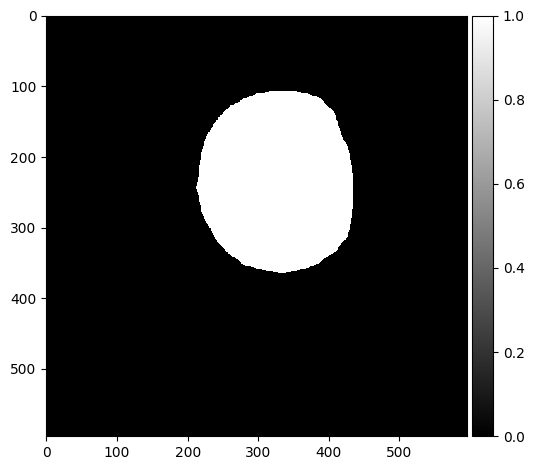

Threshold:  0.5
Bin count 84


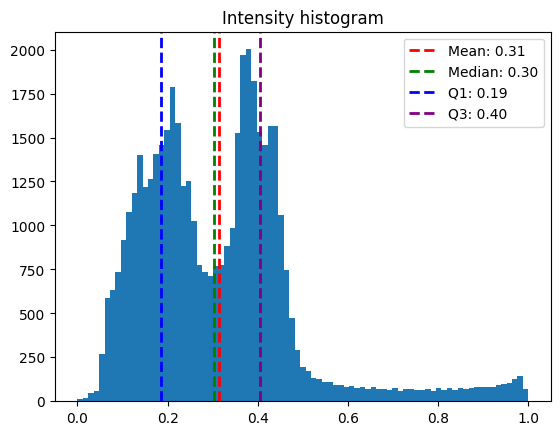

Inclusion Areas:  [  50. 4487.  239.   28.   18.   17.   13.   25.  121.   28.   12.   15.
  412.   17.   15.   41.   32.   12.   27.   12.   19.   31.]


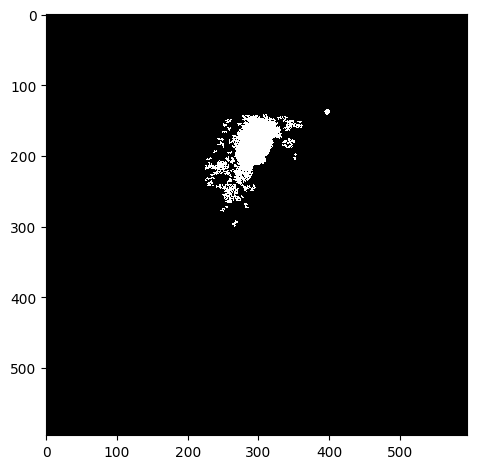

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_03.czi
Red Channel


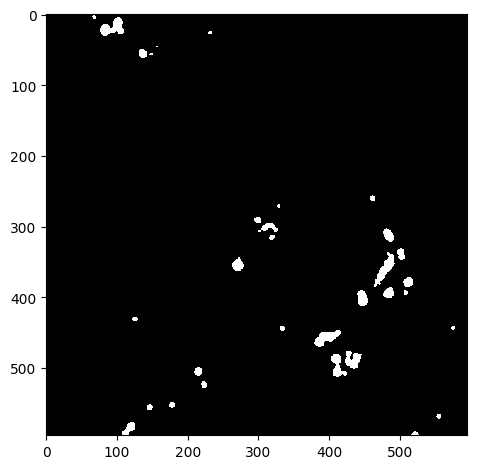

Green Channel


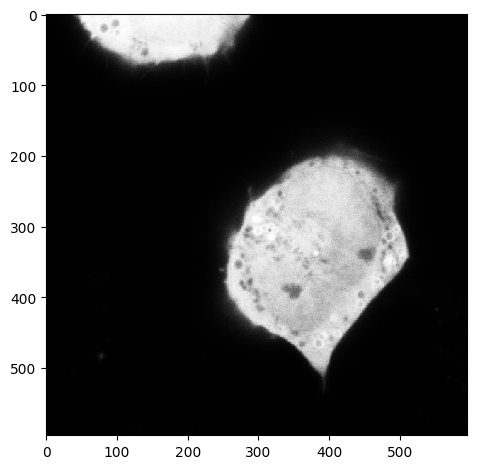

Segmented Cells


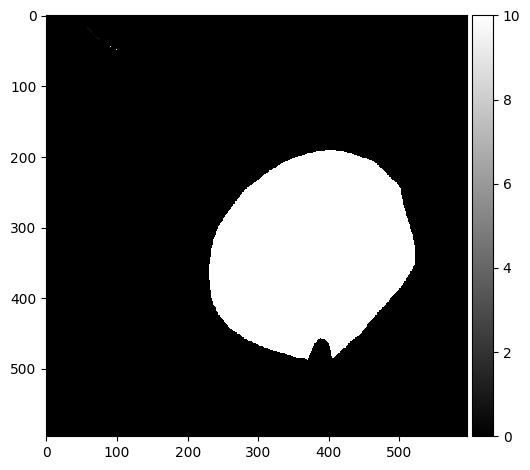

Threshold:  0.95
Bin count 63


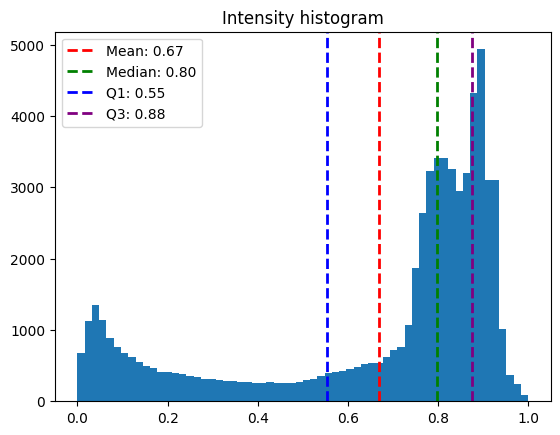

Inclusion Areas:  [137. 154. 160.  30.  52.  17.]


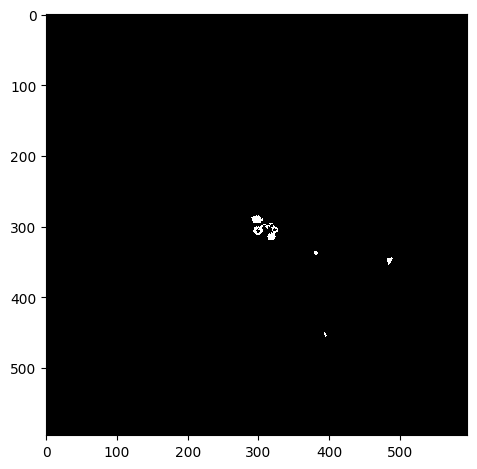

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_04.czi
Red Channel


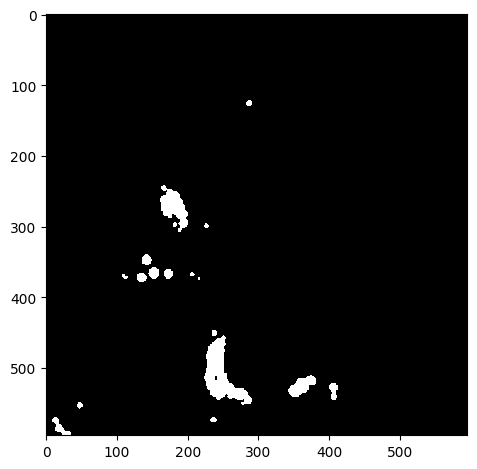

Green Channel


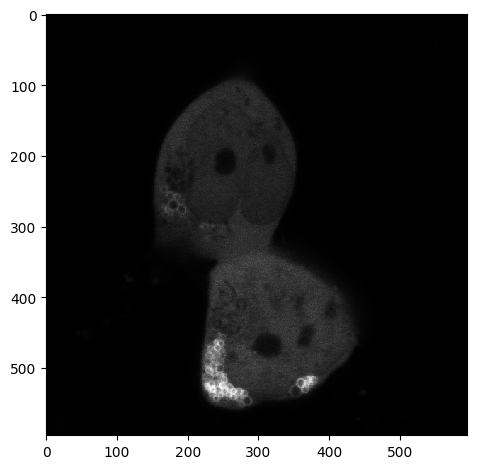

Segmented Cells


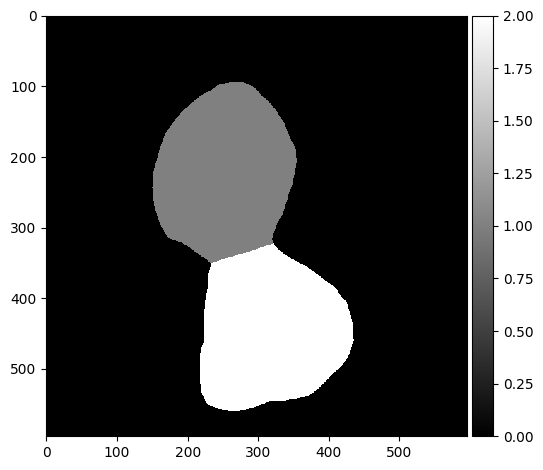

Threshold:  0.95
Bin count 96


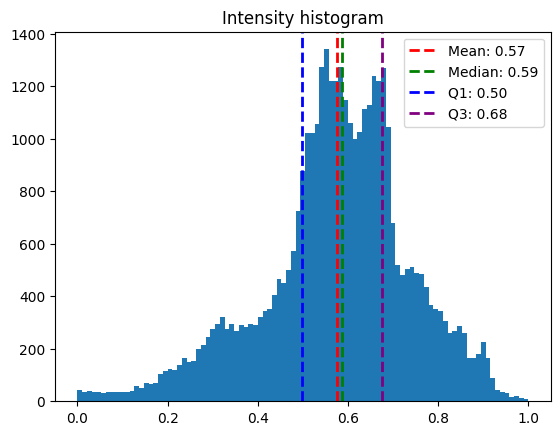

Inclusion Areas:  []


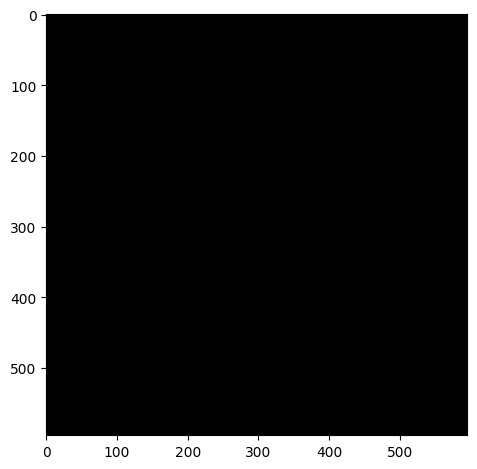

Threshold:  0.5
Bin count 240


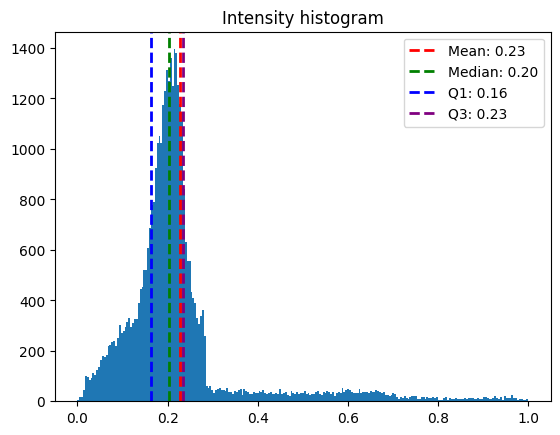

Inclusion Areas:  [1526.  242.]


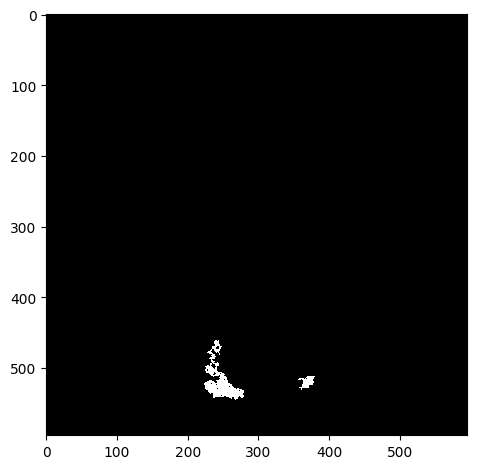

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_05.czi
Red Channel


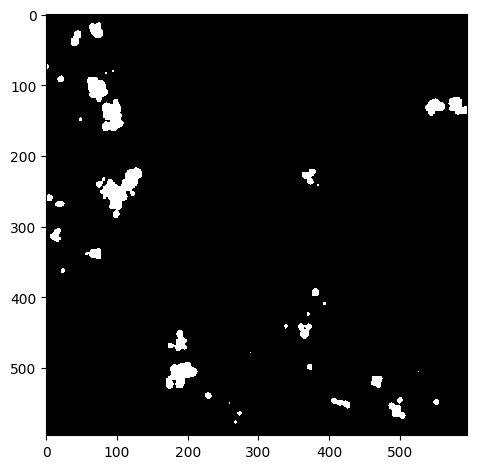

Green Channel


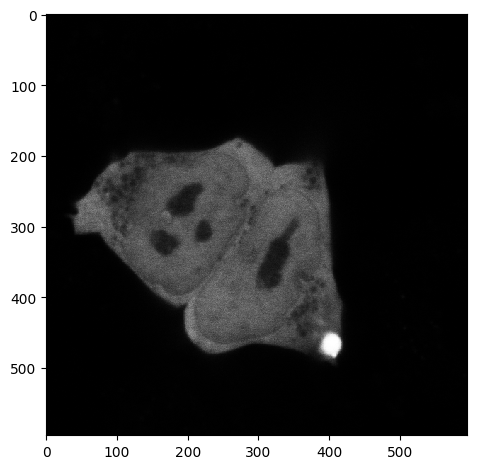

Segmented Cells


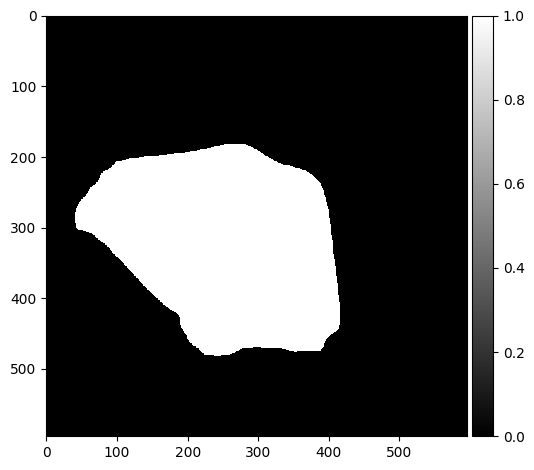

Threshold:  0.5
Bin count 183


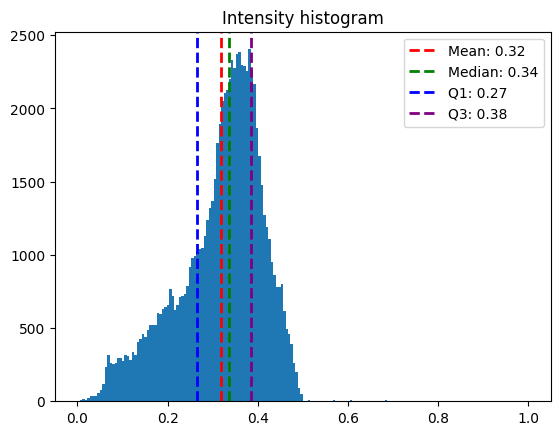

Inclusion Areas:  [ 11.  26. 138.]


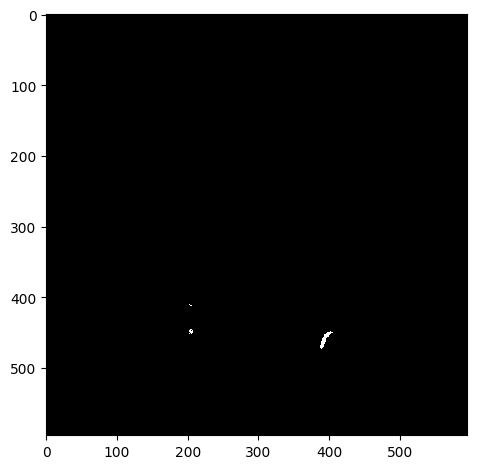

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_06.czi
Red Channel


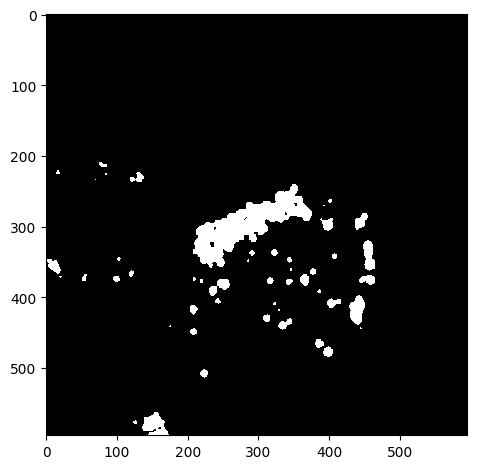

Green Channel


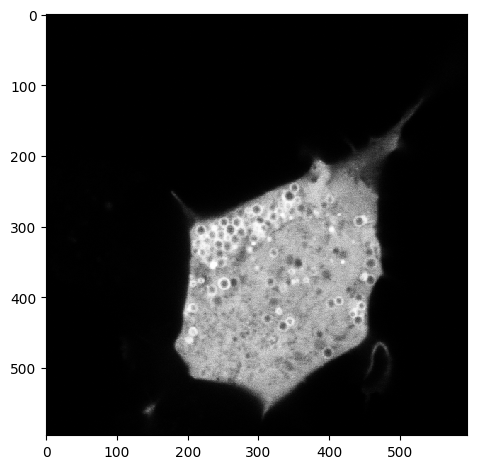

Segmented Cells


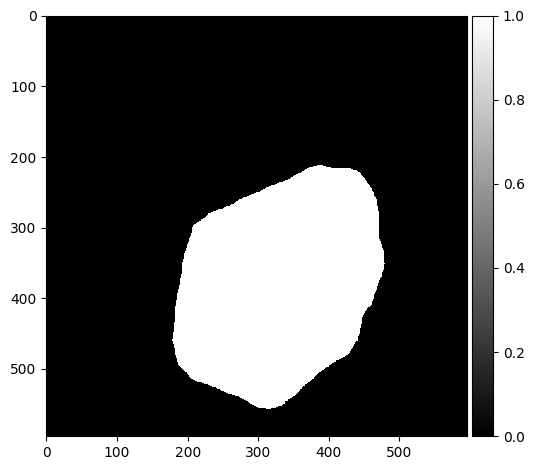

Threshold:  0.95
Bin count 157


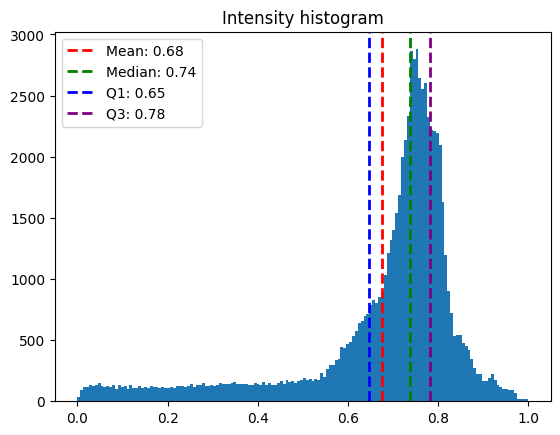

Inclusion Areas:  [32. 21. 11. 92. 46. 27. 14. 15. 20. 13. 11. 74. 12. 21. 12.]


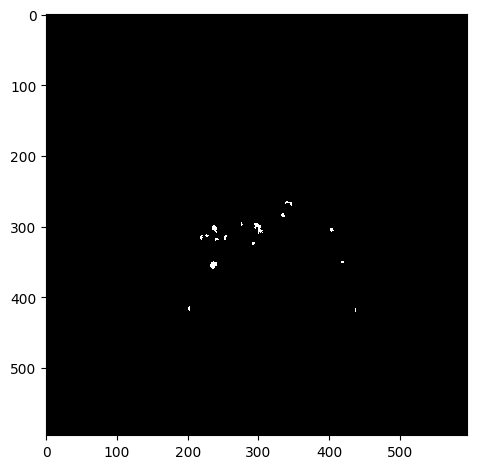

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_01.czi
Red Channel


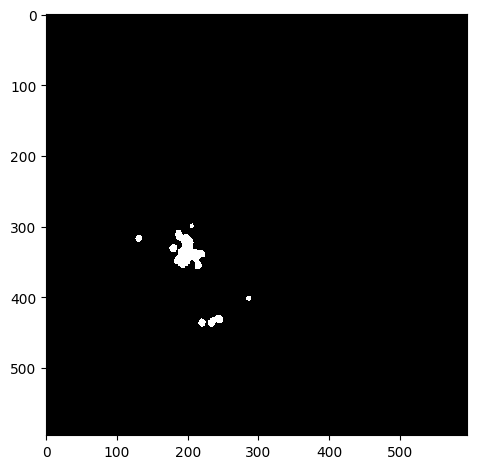

Green Channel


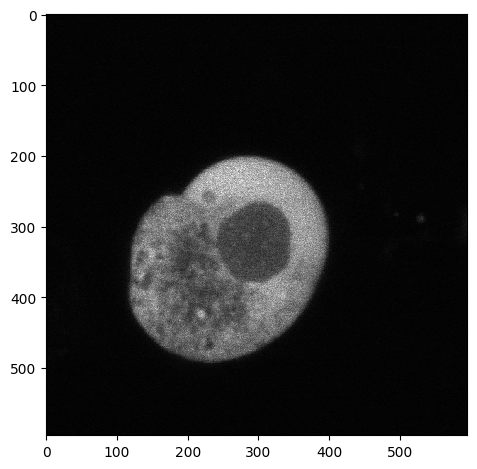

Segmented Cells


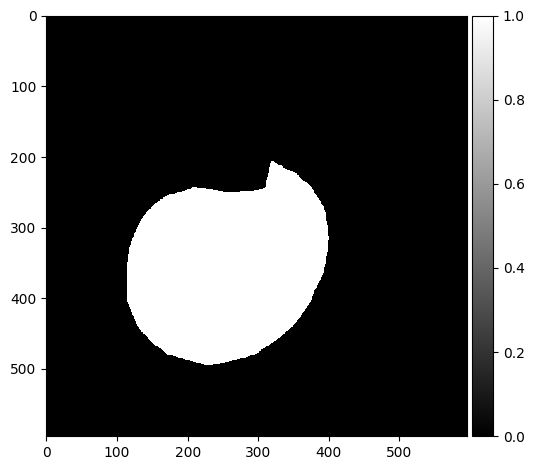

Threshold:  0.95
Bin count 66


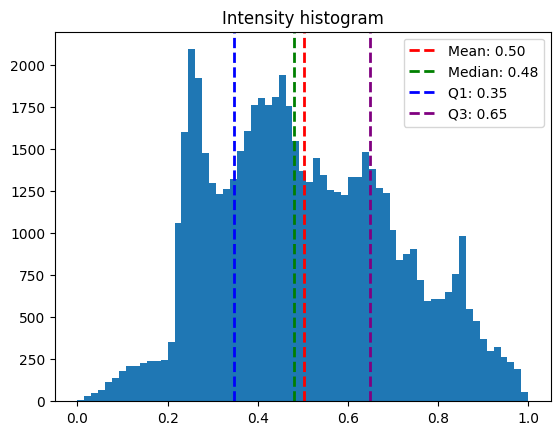

Inclusion Areas:  []


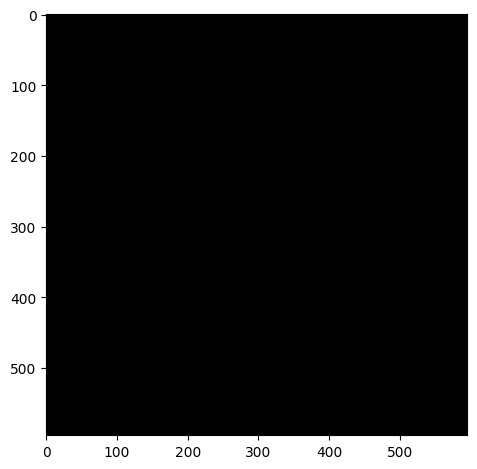

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_02.czi
Red Channel


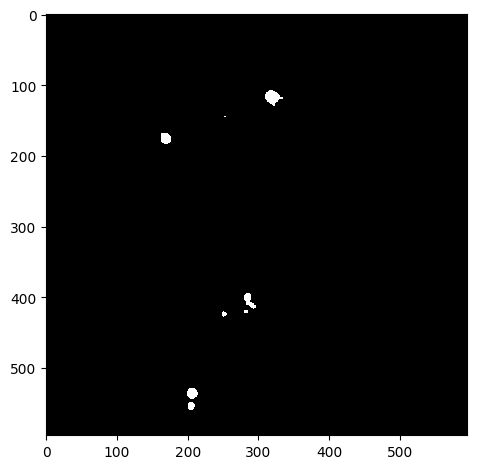

Green Channel


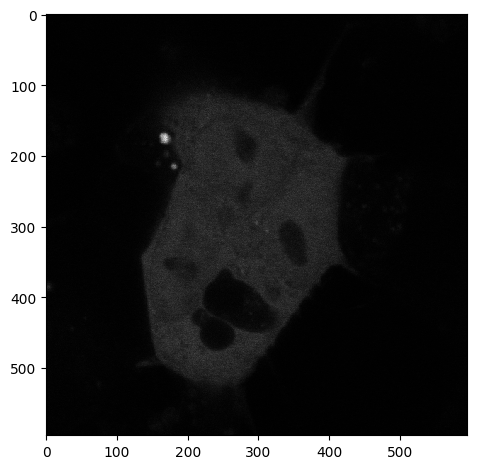

Segmented Cells


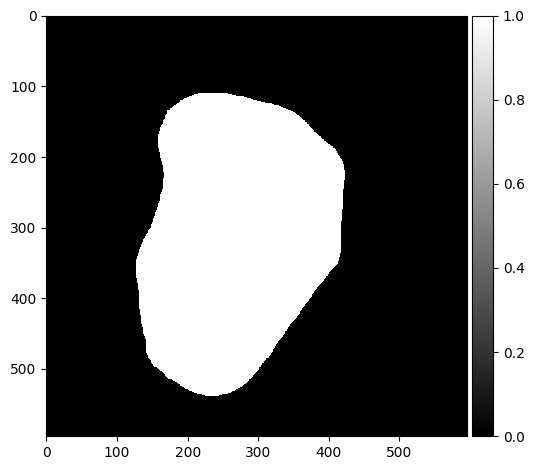

Threshold:  0.5
Bin count 193


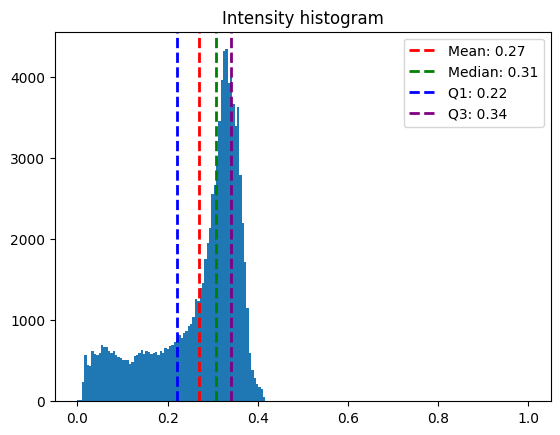

Inclusion Areas:  [95.]


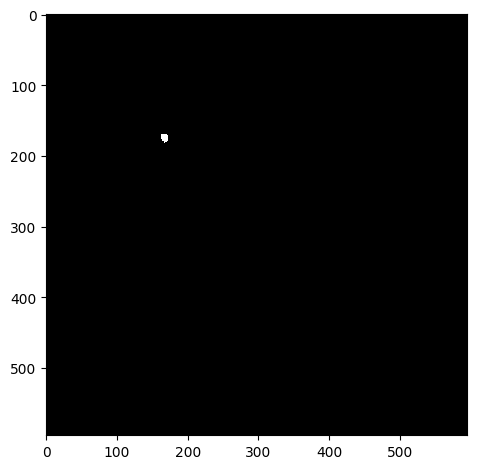

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_03.czi
Red Channel


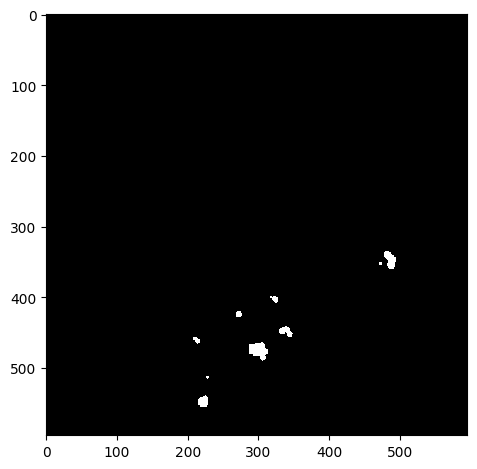

Green Channel


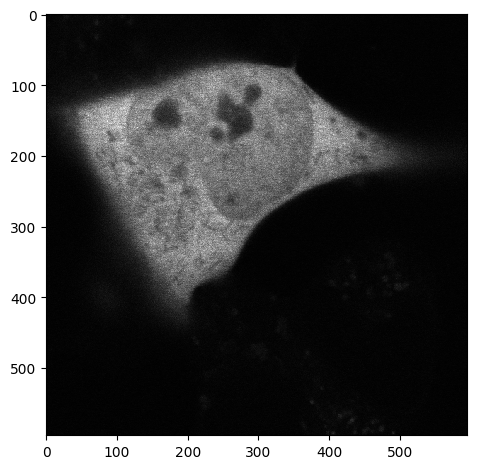

Segmented Cells


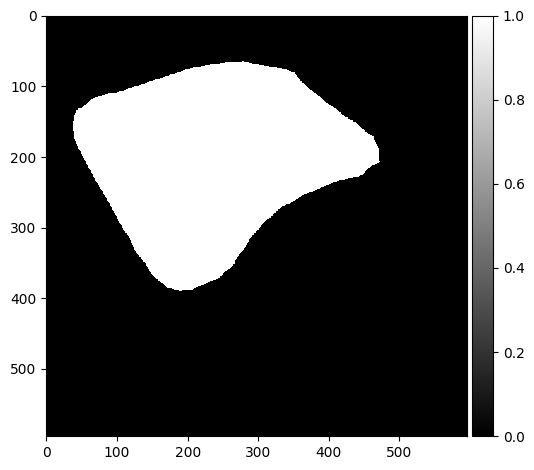

Threshold:  0.95
Bin count 124


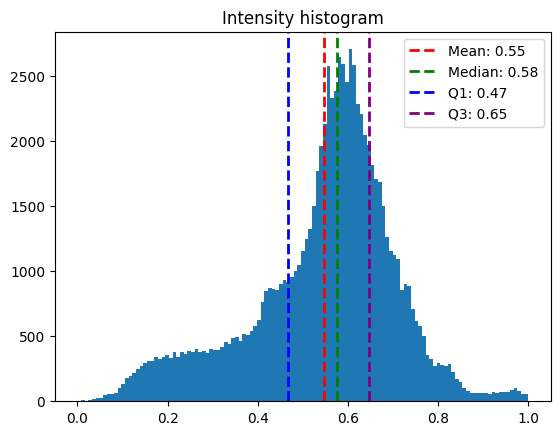

Inclusion Areas:  []


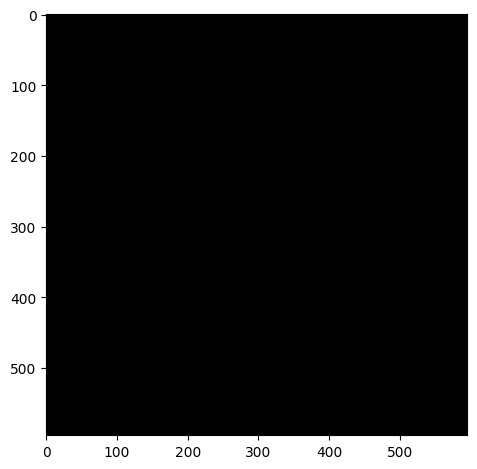

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_04.czi
Red Channel


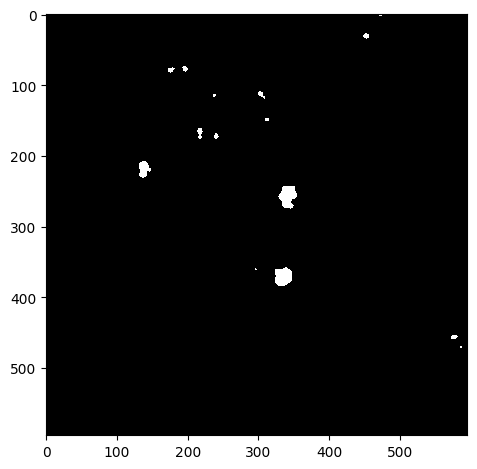

Green Channel


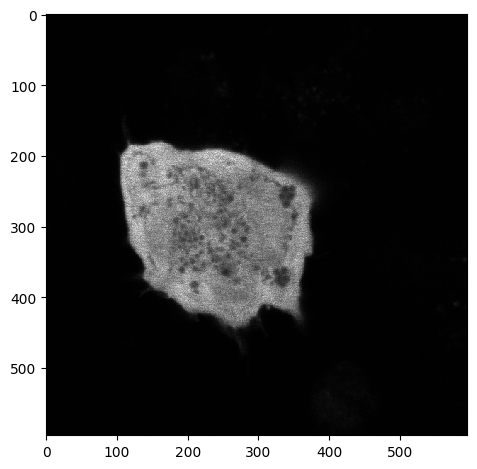

Segmented Cells


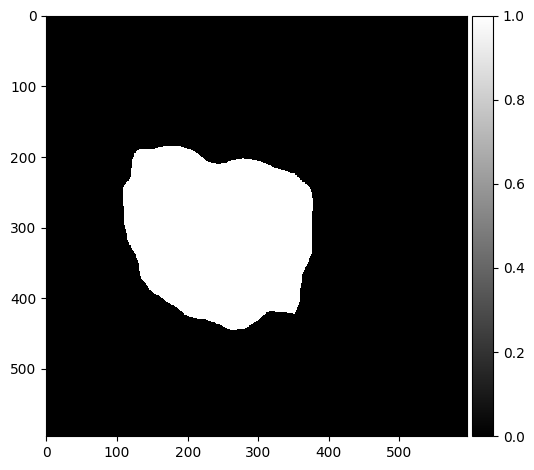

Threshold:  0.95
Bin count 111


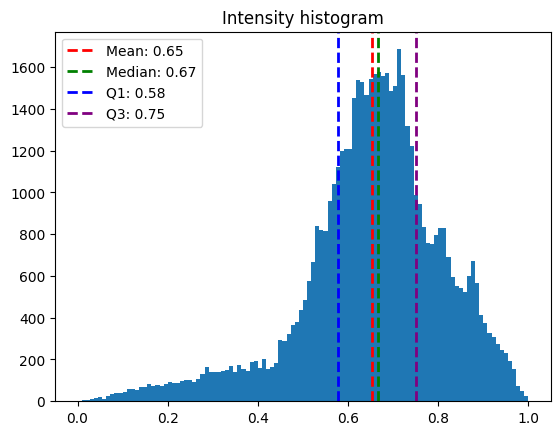

Inclusion Areas:  []


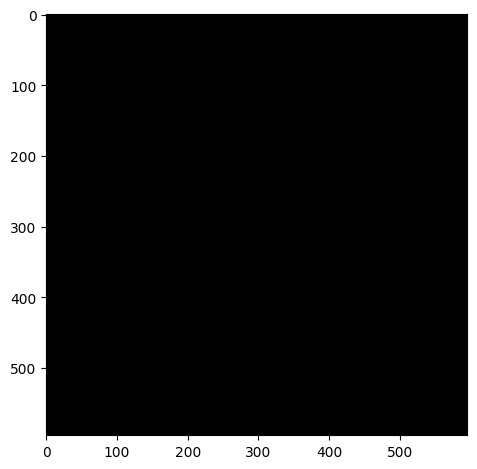

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_05.czi
Red Channel


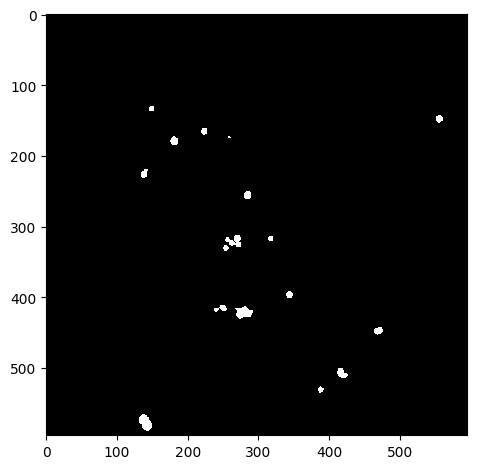

Green Channel


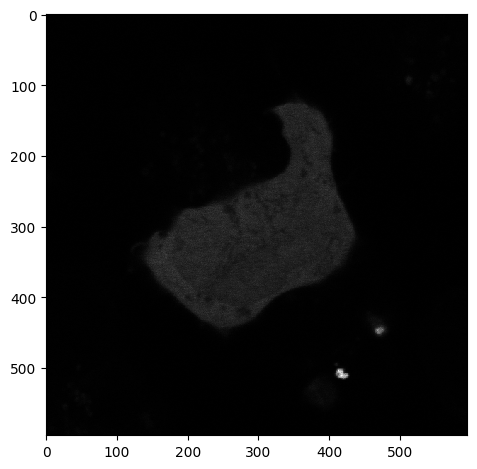

Segmented Cells


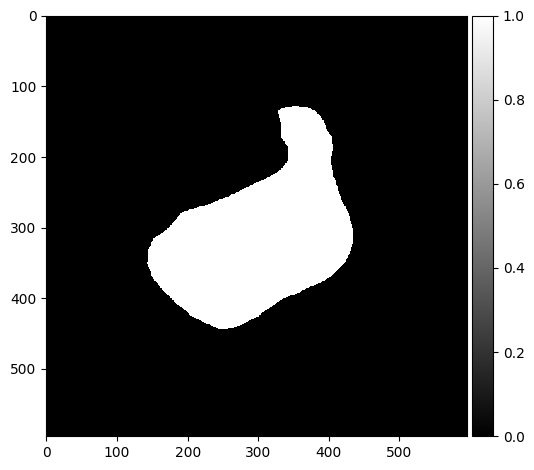

Threshold:  0.95
Bin count 149


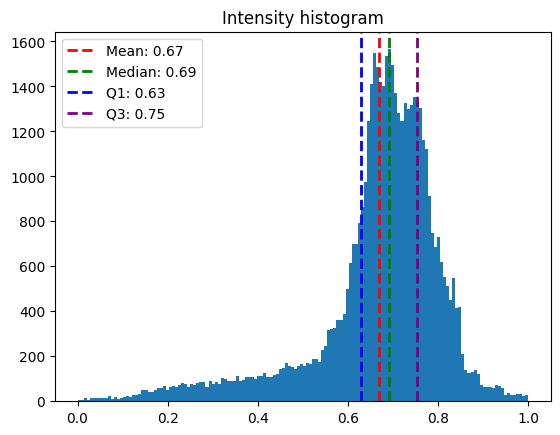

Inclusion Areas:  []


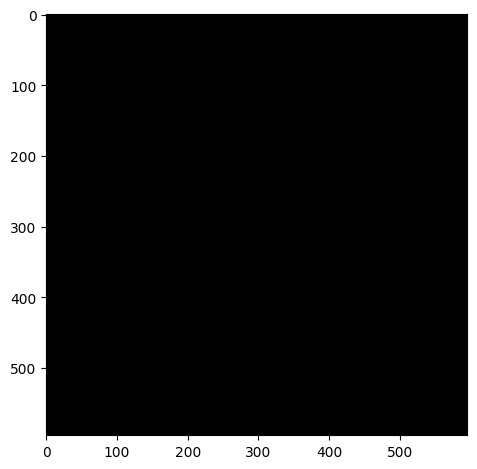

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_06.czi
Red Channel


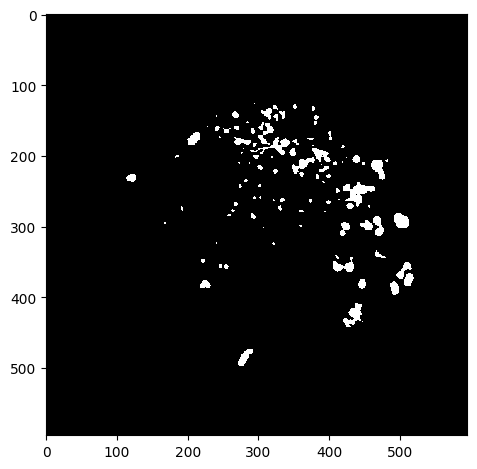

Green Channel


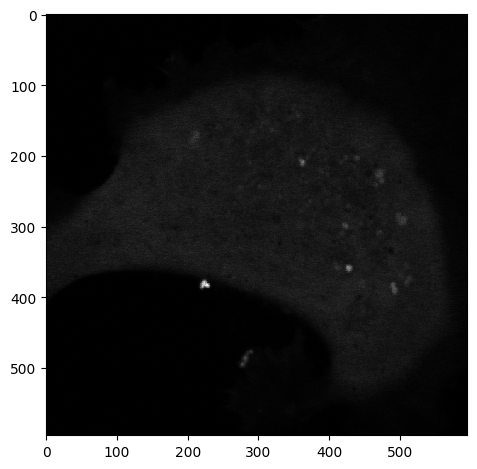

Segmented Cells


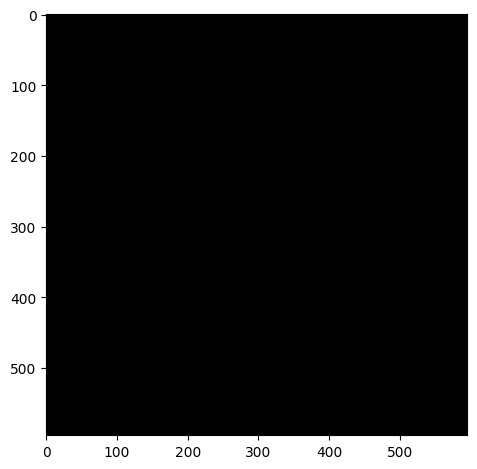

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_01.czi
Red Channel


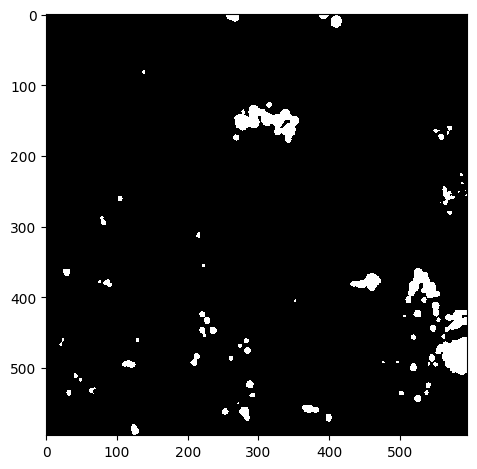

Green Channel


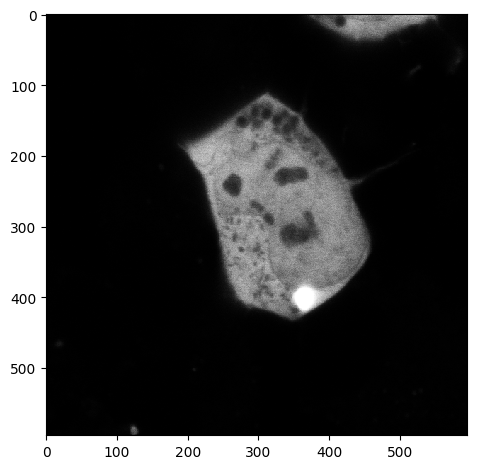

Segmented Cells


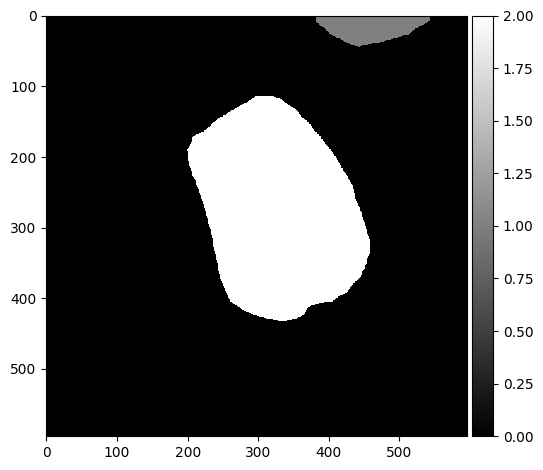

Threshold:  0.95
Bin count 23


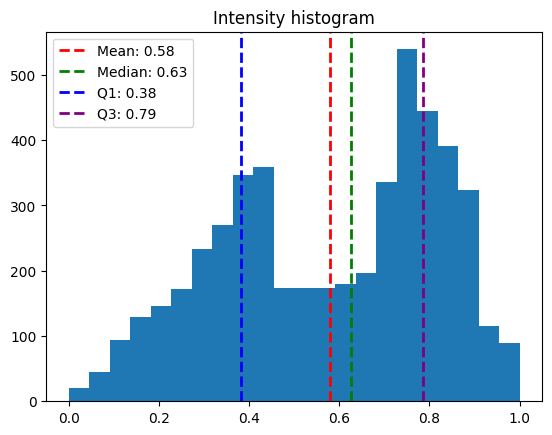

Inclusion Areas:  []


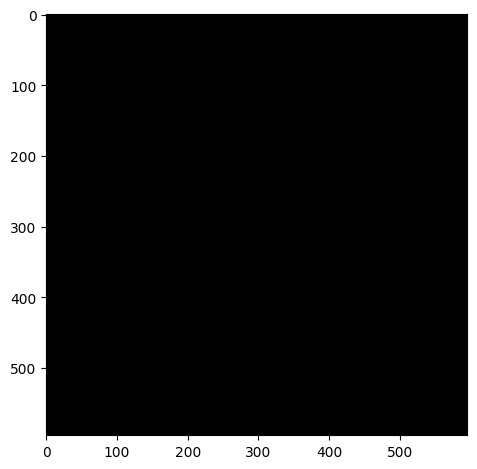

Threshold:  0.95
Bin count 94


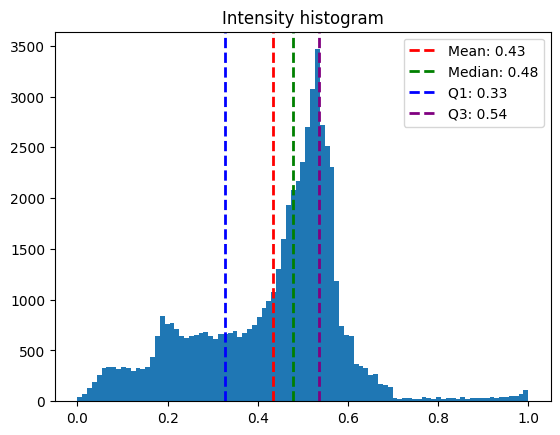

Inclusion Areas:  [693.]


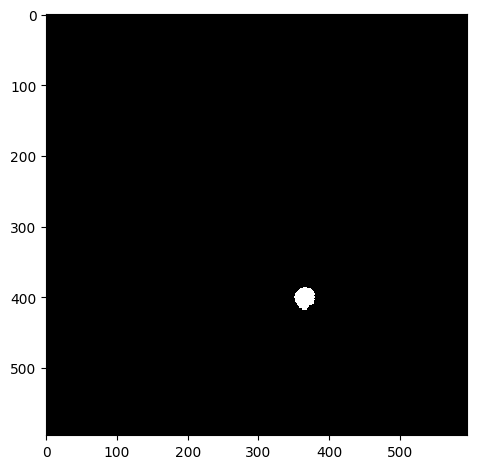

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_02.czi
Red Channel


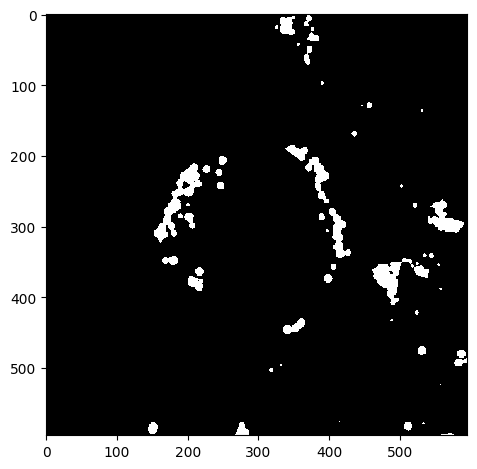

Green Channel


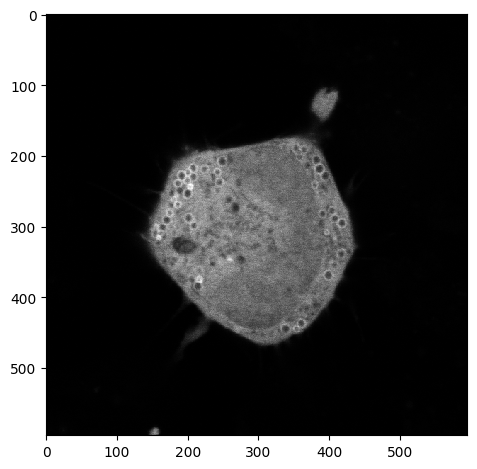

Segmented Cells


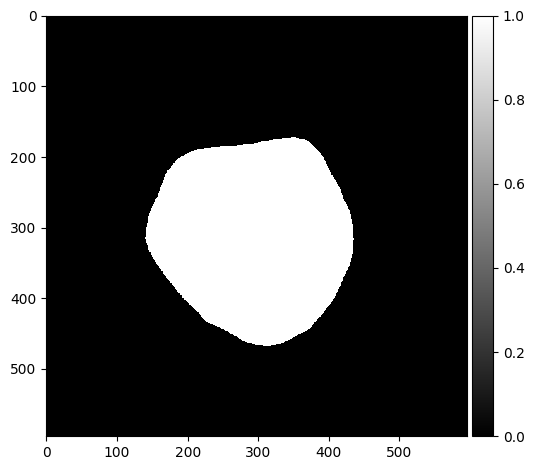

Threshold:  0.95
Bin count 140


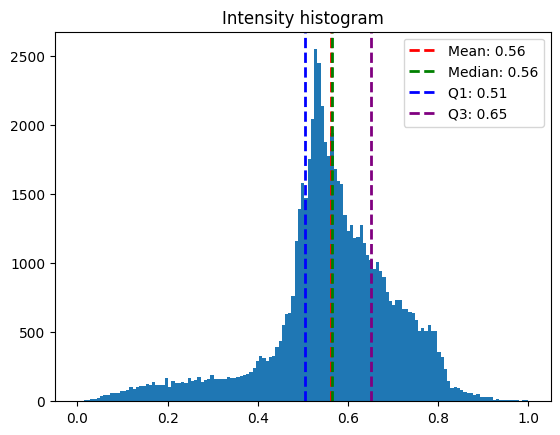

Inclusion Areas:  []


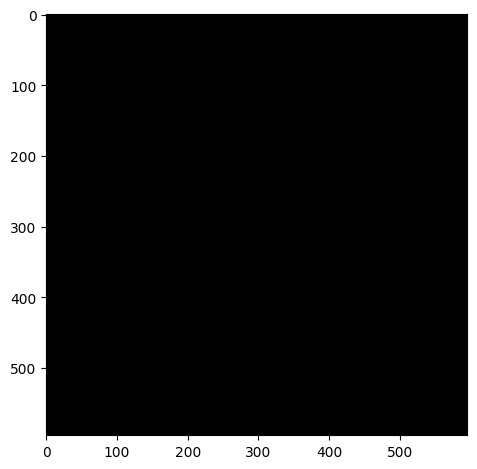

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_03.czi
Red Channel


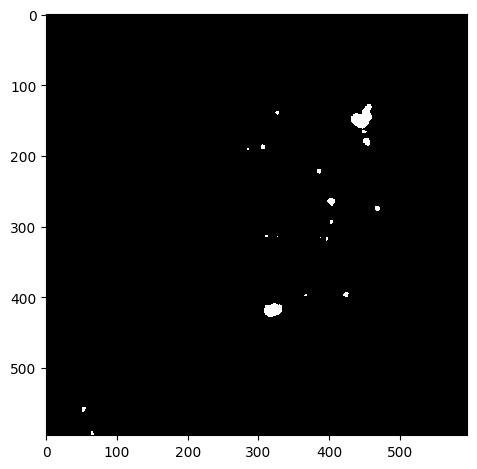

Green Channel


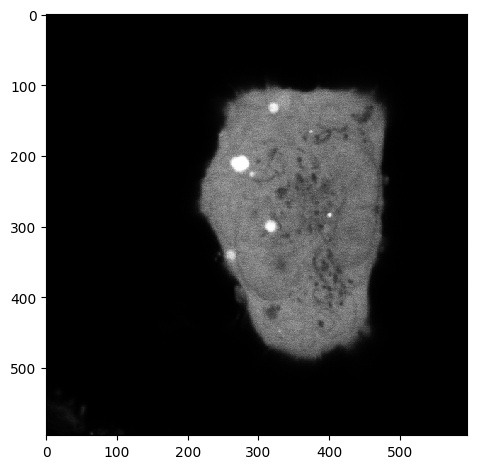

Segmented Cells


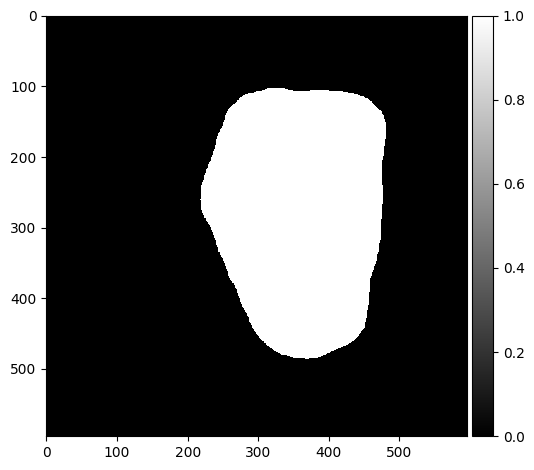

Threshold:  0.5
Bin count 205


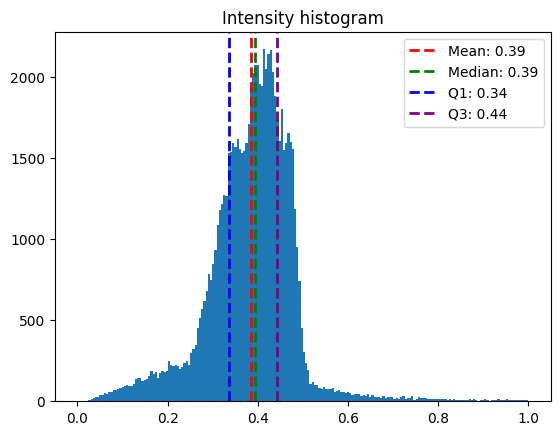

Inclusion Areas:  [8053.  347.  193.   93.   87.   13.   14.   11.  113.   12.   39.   26.
   13.   72.   35.   16.   29.   21.   20.   17.   12.   13.   36.   11.
   46.  889.   11.  313.   27.   17.   11.   24.   13.   19.   12.   63.
   11.   40.  294.   46.   11.  726.   15.   12.   15.   23.   91.   36.
   32.   12.   17.   14.   52.   11.]


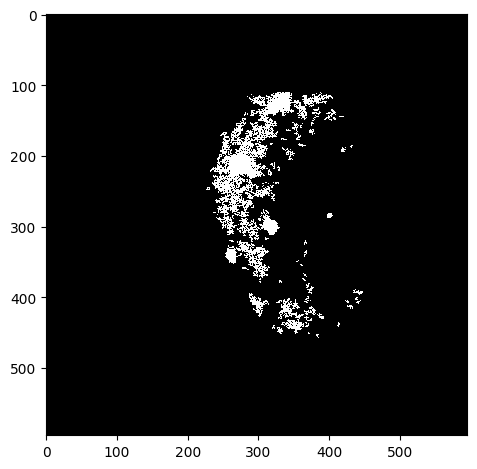

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_04.czi
Red Channel


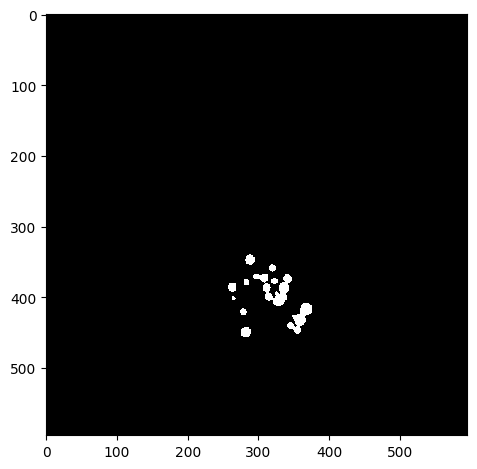

Green Channel


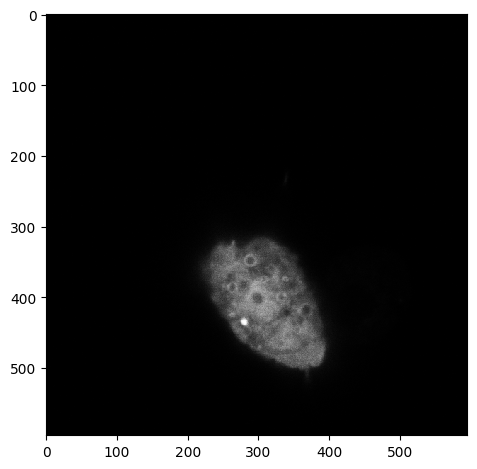

Segmented Cells


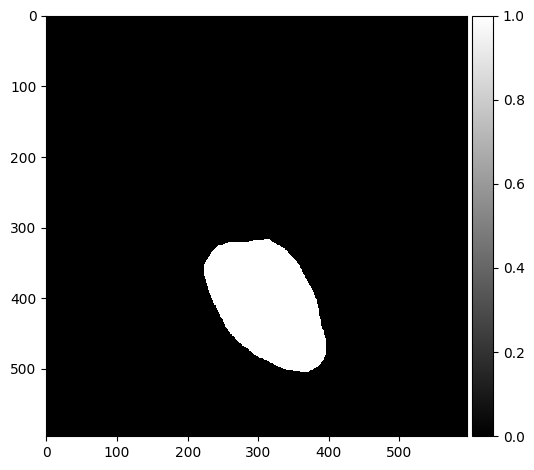

Threshold:  0.95
Bin count 48


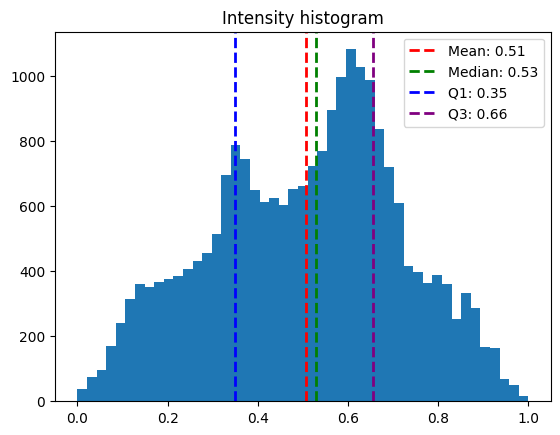

Inclusion Areas:  [27.]


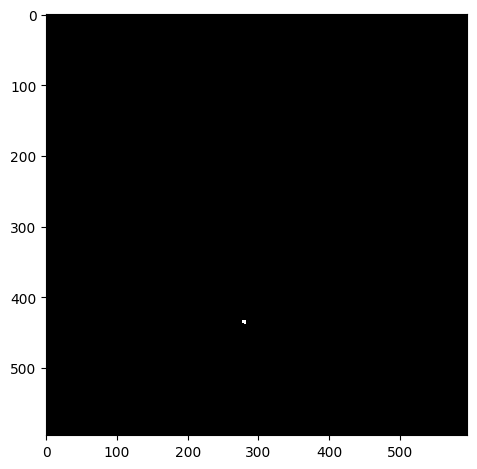

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_05.czi
Red Channel


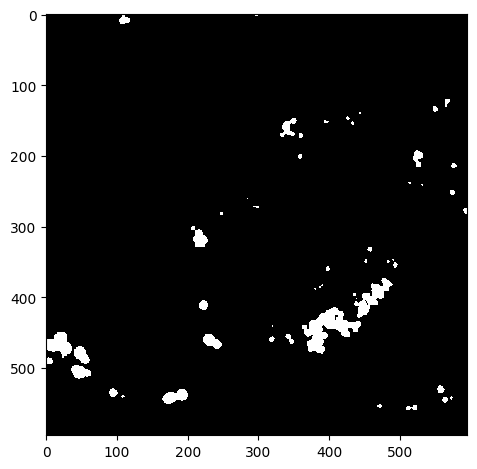

Green Channel


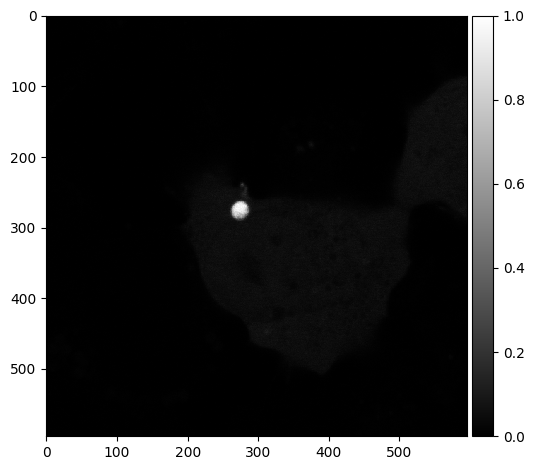

Segmented Cells


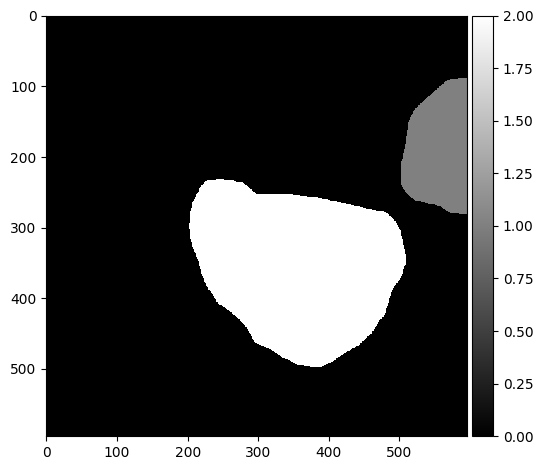

Threshold:  0.95
Bin count 93


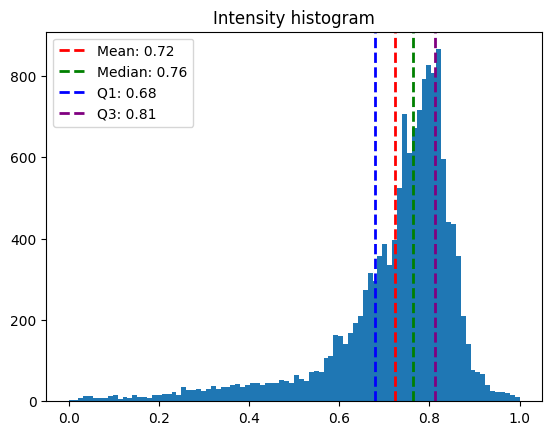

Inclusion Areas:  []


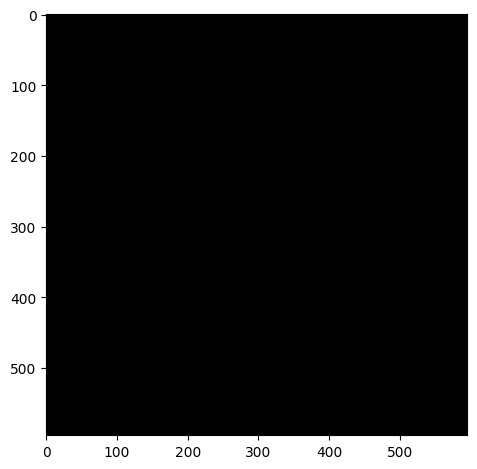

Threshold:  0.5
Bin count 1827


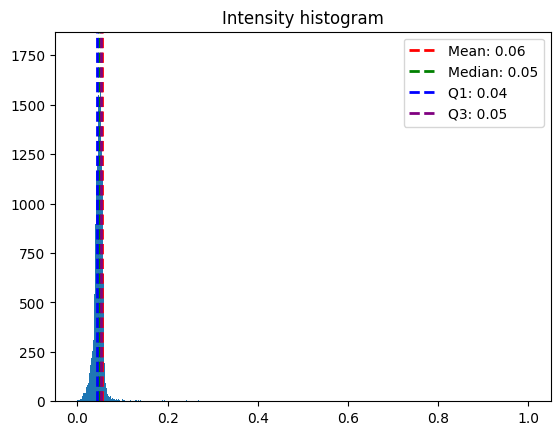

Inclusion Areas:  [426.]


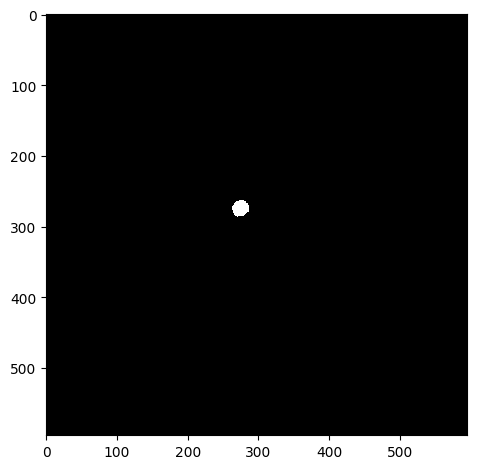

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_06.czi
Red Channel


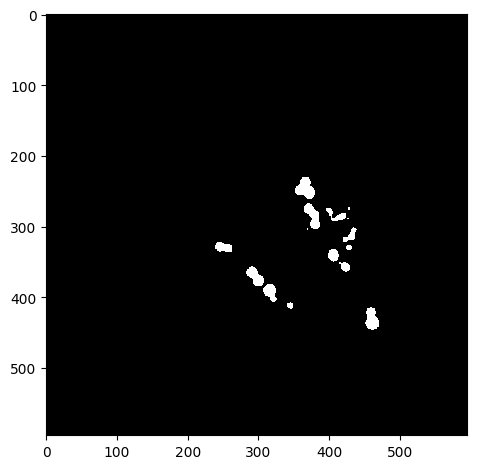

Green Channel


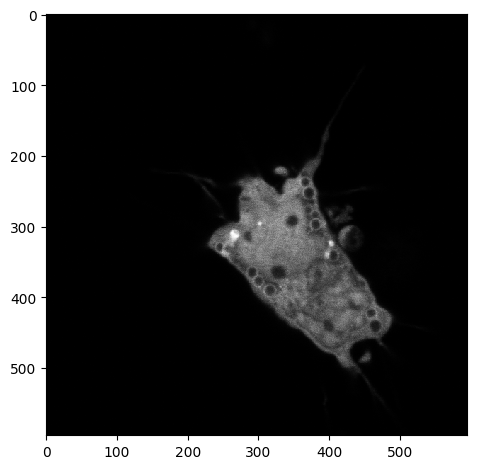

Segmented Cells


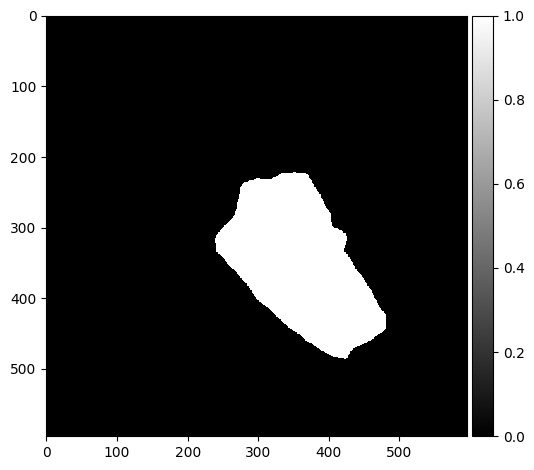

Threshold:  0.95
Bin count 87


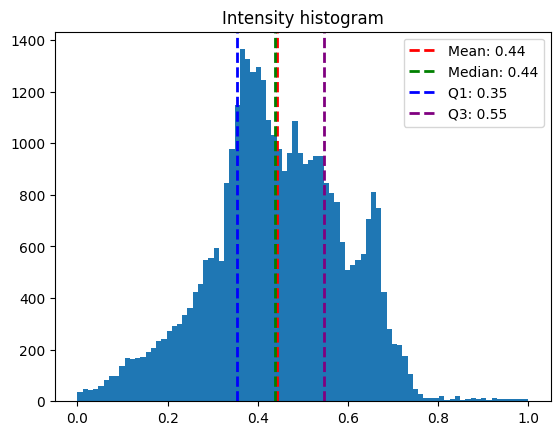

Inclusion Areas:  [35.]


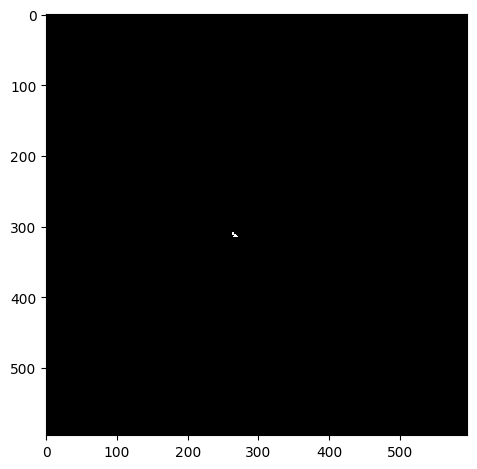

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [18]:

for folder in folders:
    analyze_all_images(folder)
